EDA questions :

Having seen the descriptive stats/top rows, below are a few questions that can be answered using the given data. For this analysis, we will try to answer a few of the questions. Due to a large number of columns present, we will try to answer a few EDA questions one by one, in the process of cleaning the relevant and needed columns and not ending up cleaning all the columns present in the data,

We answer the following questions:

1. What factors are most strongly associated with the price of an Airbnb rental in San Francisco? For example, how does neighborhood affect pricing?

2. What neighborhoods in San Francisco have the highest demand for Airbnb rentals?

3. Can you identify any interesting trends or patterns in the demand for Airbnb rentals in San Francisco over time?

4. Can you predict the occupancy rate and/or price of a given Airbnb listing in San Francisco based on its attributes and availability?

In [574]:
from google.colab import drive
drive.mount('/content/drive/')

!pwd

import os
os.chdir('/content/drive/MyDrive/airbnb-data-analysis')

!pwd

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/My Drive/airbnb-data-analysis
/content/drive/MyDrive/airbnb-data-analysis


# Airbnb San Francisco Data Analysis

## We will be analyzing Airbnb's trends in San Francisco. We will start off with basic analysis of popular trends and data visualization of such trends.

## Once we have some general idea of how the market breaks down in SF, we can use scikit learn and machine learning to predict prices based on several factors.

In [575]:
!pip install basemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.6.3-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.8 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pdpbox 0.2.1 requires matplotlib==3.1.1, but you have matplotlib 3.6.3 which is incompatible.


In [576]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [577]:
import numpy as np
import pandas as pd
import csv
from collections import Counter
%matplotlib inline
import matplotlib.pyplot as plt
plt.close('all')
# module created by UC Berkeley students
from datascience import *
from mpl_toolkits.basemap import Basemap
import sklearn.metrics as metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn import datasets
from sklearn.model_selection import cross_validate
from sklearn import linear_model
from sklearn import ensemble
from IPython.core.display import HTML
from datetime import datetime

# set the max rows into 15 for display
# pd.set_option('display.height', 15)
# pd.set_option('display.max_Rows', 15)

listings_file = '/content/drive/MyDrive/airbnb-data-analysis/detailed_listings.csv'

listingorig = pd.read_csv(listings_file)
listingorig.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,144978,https://www.airbnb.com/rooms/144978,20221204162417,2022-12-04,city scrape,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,https://a0.muscache.com/pictures/915742/ada9fb...,216682,...,4.81,4.81,4.66,NaN,f,9,4,5,0,0.86
1,958,https://www.airbnb.com/rooms/958,20221204162417,2022-12-04,city scrape,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,...,4.88,4.98,4.76,City Registration Pending,f,1,1,0,0,2.28
2,5858,https://www.airbnb.com/rooms/5858,20221204162417,2022-12-04,city scrape,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,https://a0.muscache.com/pictures/17714/3a7aea1...,8904,...,4.85,4.77,4.68,NaN,f,1,1,0,0,0.67
3,8142,https://www.airbnb.com/rooms/8142,20221204162417,2022-12-04,city scrape,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",https://a0.muscache.com/pictures/12d8bff0-1698...,21994,...,4.78,4.67,4.67,NaN,f,12,0,12,0,0.09
4,8339,https://www.airbnb.com/rooms/8339,20221204162417,2022-12-04,city scrape,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,24215,...,5.00,4.94,4.75,STR-0000264,f,2,2,0,0,0.17


In [578]:
listingorig.info(verbose = True, null_counts= True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6789 entries, 0 to 6788
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6789 non-null   int64  
 1   listing_url                                   6789 non-null   object 
 2   scrape_id                                     6789 non-null   int64  
 3   last_scraped                                  6789 non-null   object 
 4   source                                        6789 non-null   object 
 5   name                                          6789 non-null   object 
 6   description                                   6739 non-null   object 
 7   neighborhood_overview                         4741 non-null   object 
 8   picture_url                                   6789 non-null   object 
 9   host_id                                       6789 non-null   i

In [579]:
listingorig.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,6.789000e+03,6.789000e+03,6.789000e+03,6789.000000,6789.000000,0.0,6789.000000,6789.000000,6789.000000,0.0,...,5542.000000,5541.000000,5542.000000,5541.000000,5541.000000,6789.000000,6789.000000,6789.000000,6789.000000,5562.000000
mean,1.208976e+17,2.022120e+13,1.023542e+08,131.413905,164.548682,NaN,37.768296,-122.430186,3.190602,NaN,...,4.770016,4.880628,4.851875,4.790137,4.664091,13.667256,9.624098,3.667256,0.198704,1.364036
std,2.589342e+17,0.000000e+00,1.332468e+08,667.079273,803.755101,NaN,0.023061,0.027537,1.950000,NaN,...,0.409131,0.311893,0.378333,0.388416,0.441526,31.192535,30.470613,9.332142,2.107418,1.991691
min,9.580000e+02,2.022120e+13,1.169000e+03,1.000000,1.000000,NaN,37.708370,-122.512460,0.000000,NaN,...,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.693015e+07,2.022120e+13,5.805679e+06,1.000000,2.000000,NaN,37.752970,-122.442880,2.000000,NaN,...,4.710000,4.890000,4.870000,4.760000,4.590000,1.000000,0.000000,0.000000,0.000000,0.200000
50%,3.564333e+07,2.022120e+13,3.601338e+07,3.000000,4.000000,NaN,37.772640,-122.423030,2.000000,NaN,...,4.910000,4.980000,4.980000,4.900000,4.760000,2.000000,1.000000,0.000000,0.000000,0.580000
75%,5.123414e+07,2.022120e+13,1.565042e+08,14.000000,22.000000,NaN,37.787430,-122.410390,4.000000,NaN,...,5.000000,5.000000,5.000000,5.000000,4.900000,9.000000,2.000000,2.000000,0.000000,1.870000
max,7.734981e+17,2.022120e+13,4.896232e+08,4559.000000,7328.000000,NaN,37.809540,-122.358480,16.000000,NaN,...,5.000000,5.000000,5.000000,5.000000,5.000000,153.000000,152.000000,54.000000,26.000000,36.490000


In [580]:
listingorig.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [581]:
# import columns we want to drop
columns_to_drop= ['listing_url', 'source', 'scrape_id', 'last_scraped',
                  'picture_url', 'host_url', 'host_thumbnail_url',
                  'host_picture_url', 'host_verifications',
                  'host_location', 'host_about', 'neighbourhood']

In [582]:
listing = pd.read_csv(listings_file)

### Cleaning up the data

In [583]:
listing.isna().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               1227
Length: 75, dtype: int64

In [584]:
listing.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,144978,https://www.airbnb.com/rooms/144978,20221204162417,2022-12-04,city scrape,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,https://a0.muscache.com/pictures/915742/ada9fb...,216682,...,4.81,4.81,4.66,NaN,f,9,4,5,0,0.86
1,958,https://www.airbnb.com/rooms/958,20221204162417,2022-12-04,city scrape,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,...,4.88,4.98,4.76,City Registration Pending,f,1,1,0,0,2.28
2,5858,https://www.airbnb.com/rooms/5858,20221204162417,2022-12-04,city scrape,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,https://a0.muscache.com/pictures/17714/3a7aea1...,8904,...,4.85,4.77,4.68,NaN,f,1,1,0,0,0.67
3,8142,https://www.airbnb.com/rooms/8142,20221204162417,2022-12-04,city scrape,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",https://a0.muscache.com/pictures/12d8bff0-1698...,21994,...,4.78,4.67,4.67,NaN,f,12,0,12,0,0.09
4,8339,https://www.airbnb.com/rooms/8339,20221204162417,2022-12-04,city scrape,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,24215,...,5.00,4.94,4.75,STR-0000264,f,2,2,0,0,0.17


In [585]:
print(
      round((listing
      .isnull()
      .sum().sort_values())/len(listing.index),2)
      )

id                              0.00
host_has_profile_pic            0.00
availability_60                 0.00
number_of_reviews_ltm           0.00
neighbourhood_cleansed          0.00
                                ... 
host_about                      0.32
license                         0.40
calendar_updated                1.00
neighbourhood_group_cleansed    1.00
bathrooms                       1.00
Length: 75, dtype: float64


In [586]:
listing.nunique()

id                                              6789
listing_url                                     6789
scrape_id                                          1
last_scraped                                       1
source                                             2
                                                ... 
calculated_host_listings_count                    36
calculated_host_listings_count_entire_homes       27
calculated_host_listings_count_private_rooms      26
calculated_host_listings_count_shared_rooms        8
reviews_per_month                                672
Length: 75, dtype: int64

In [587]:
listing.duplicated().sum()

0

In [588]:
listing["id"].unique().shape[0]/listing["id"].shape[0]*100
print("\n-----\n")
listing["host_id"].unique().shape[0]/listing["host_id"].shape[0]*100


-----



53.07114449845338

Because there are a high number of Nan values, I will delete license column.

In [589]:
listing.drop(columns=["license"], axis=1, inplace=True)

**As we can see, We will drop the features that have over 85% of missing values**

In [590]:
listing.drop(['bathrooms', 'calendar_updated'], axis=1, inplace=True)

In [591]:
# #Filling the NaN value in neighbour_group with the respective location name
listing["neighbourhood_group_cleansed"].fillna("San Francisco", inplace=True)
listing.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availabilit

In [592]:
#Also, verifying if the id of the listings is unique and no duplicate listings in the data
listing["id"].nunique() == listing.shape[0]

True

In [593]:
# listing.drop("host_name",axis=1,inplace=True)

In [594]:
#Also, verifying if the id of the listings is unique and no duplicate listings in the data
listing["id"].nunique() == listing.shape[0]

True

In [595]:
#converting last_review to datetime type
listing["last_review"] = pd.to_datetime(listing["last_review"])

In [596]:
listing.isna().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               1227
Length: 72, dtype: int64

In [597]:
listing.isnull().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               1227
Length: 72, dtype: int64

In [598]:
pd.set_option('display.max_rows', listing.shape[0]+1)

In [599]:
# calculate the % missing values
percentage_result = listing.isnull().sum()/listing.shape[0] * 100
# create a DataFrame to show case the result
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "% missing": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,% missing
0,id,0.000000
1,listing_url,0.000000
2,scrape_id,0.000000
3,last_scraped,0.000000
4,source,0.000000
5,name,0.000000
6,description,0.736485
7,neighborhood_overview,30.166446
8,picture_url,0.000000
9,host_id,0.000000


Overall missing values in entire dataframe

In [600]:
print("Overall missing values in entire dataframe :: listing.isnull().sum().sum() :: ", listing.isnull().sum().sum())
print("Overall missing values in entire dataframe :: listing.isna().sum().sum() :: ", listing.isna().sum().sum())
print("Overall missing values in entire dataframe :: sum(listing.isnull().values.ravel()) :: ", sum(listing.isnull().values.ravel()))

Overall missing values in entire dataframe :: listing.isnull().sum().sum() ::  24119
Overall missing values in entire dataframe :: listing.isna().sum().sum() ::  24119
Overall missing values in entire dataframe :: sum(listing.isnull().values.ravel()) ::  24119


Number of columns with no missing values in entire dataframe

In [601]:
print("Number of columns with no missing values in entire dataframe :: (listing.isna().sum(axis=0) == 0).sum() :: ", (listing.isna().sum(axis=0) == 0).sum())
print("Number of columns with no missing values in entire dataframe :: (listing.isnull().sum(axis=0) == 0).sum() :: ", (listing.isnull().sum(axis=0) == 0).sum())

Number of columns with no missing values in entire dataframe :: (listing.isna().sum(axis=0) == 0).sum() ::  43
Number of columns with no missing values in entire dataframe :: (listing.isnull().sum(axis=0) == 0).sum() ::  43


Number of columns with at least one missing value in entire dataframe

In [602]:
print("Number of columns with at least one missing value in entire dataframe :: sum([True for idx,col in listing.iteritems() if any(col.isnull())]) :: ", sum([True for idx,col in listing.iteritems() if any(col.isnull())]))
print("Number of columns with at least one missing value in entire dataframe :: listing.isna().sum(axis=0) > 0).sum() :: ", (listing.isna().sum(axis=0) > 0).sum())
sum(map(any, listing.isnull()))

Number of columns with at least one missing value in entire dataframe :: sum([True for idx,col in listing.iteritems() if any(col.isnull())]) ::  29
Number of columns with at least one missing value in entire dataframe :: listing.isna().sum(axis=0) > 0).sum() ::  29


72

Number of rows with no missing values in entire dataframe

In [603]:
print("Number of rows with no missing values in entire dataframe :: (listing.isna().sum(axis=1) == 0).sum() :: ", (listing.isna().sum(axis=1) == 0).sum())
print("Number of rows with no missing values in entire dataframe :: (listing.isnull().sum(axis=1) == 0).sum() :: ", (listing.isnull().sum(axis=1) == 0).sum())

Number of rows with no missing values in entire dataframe :: (listing.isna().sum(axis=1) == 0).sum() ::  2089
Number of rows with no missing values in entire dataframe :: (listing.isnull().sum(axis=1) == 0).sum() ::  2089


Number of rows with at least one missing value in entire dataframe

In [604]:
print("Number of rows with at least one missing value in entire dataframe :: sum([True for idx,row in listing.iterrows() if any(row.isnull())]) :: ", sum([True for idx,row in listing.iterrows() if any(row.isnull())]))
print("Number of rows with at least one missing value in entire dataframe :: (listing.isna().sum(axis=1) > 0).sum() :: ", (listing.isna().sum(axis=1) > 0).sum())

Number of rows with at least one missing value in entire dataframe :: sum([True for idx,row in listing.iterrows() if any(row.isnull())]) ::  4700
Number of rows with at least one missing value in entire dataframe :: (listing.isna().sum(axis=1) > 0).sum() ::  4700


In [605]:
listing[(listing.isna().sum(axis=1) <= 0)].shape

(2089, 72)

In [606]:
listing[(listing.isna().sum(axis=1) > 0)].shape

(4700, 72)

In [607]:
listing.isna().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
name                                               0
description                                       50
neighborhood_overview                           2048
picture_url                                        0
host_id                                            0
host_url                                           0
host_name                                          0
host_since                                         0
host_location                                   1120
host_about                                      2171
host_response_time                              1044
host_response_rate                              1044
host_acceptance_rate                             799
host_is_superhost                             

In [608]:
# extract the 'prices' from the table
price = listing['price']
prices = []

In [609]:
for element in price:
    element = float(element[1:].replace(',',''))
    prices.append(element)

In [610]:
# # replacing the current column into a new one for future use
listing['price'] = prices

In [611]:
import seaborn as sb

<Figure size 1440x432 with 0 Axes>

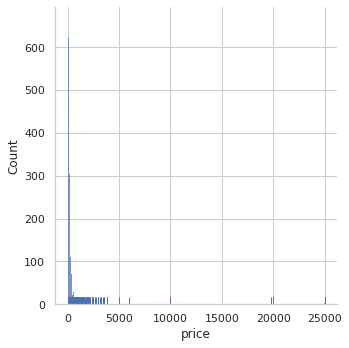

In [612]:
plt.figure(figsize=(20,6))
sb.displot(listing['price'], rug=True)

In [613]:
# calculate the % missing values
percentage_result = listing.isnull().sum()/listing.shape[0] * 100
# create a DataFrame to show case the result
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "% missing": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,% missing
0,id,0.000000
1,listing_url,0.000000
2,scrape_id,0.000000
3,last_scraped,0.000000
4,source,0.000000
5,name,0.000000
6,description,0.736485
7,neighborhood_overview,30.166446
8,picture_url,0.000000
9,host_id,0.000000


In [614]:
pd.reset_option("all")

In [615]:
listing[["price","minimum_nights","number_of_reviews","calculated_host_listings_count","availability_365"]].describe()

,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
count,6789.000000,6789.000000,6789.000000,6789.000000,6789.000000
mean,268.709088,23.556930,48.659449,13.667256,173.049345
std,944.974389,53.748277,94.476154,31.192535,133.141768
min,0.000000,1.000000,0.000000,1.000000,0.000000
25%,99.000000,2.000000,1.000000,1.000000,46.000000
50%,150.000000,6.000000,8.000000,2.000000,164.000000
75%,250.000000,30.000000,49.000000,9.000000,310.000000
max,25000.000000,1125.000000,977.000000,153.000000,365.000000


**Inferences made from the above statistical summary**

**price** - ranges from 0 to 25000, per night. However, 75 percentile of the listings have price <= $250 per night. The data looks to be right tailed.

I should drop the records with zero price, as this is not a valid data based on domain knowledge.

**minimum nights** - ranges from 1 to 1125, with 50 percentile of listings of 6 nights.

I should be dropping the data with minimum nights 1125 as such a listing is an outlier.

**reviews** - There are listings with no reviews to listings with a maximum of 977 reviews. General range of reviews is 1 to 10.

In [616]:
listing = listing.drop(columns_to_drop, axis = 1)

In [617]:
listing.shape

(6789, 60)

In [618]:
#Analysing the price data

listing[listing["price"]==0]["price"].count()

3

In [619]:
# # excluding listings with "0" for price, bedrooms, etc
listing = listing[listing.price > 0]

In [620]:
listing.shape

(6786, 60)

In [621]:
listing = listing[listing.bedrooms > 0]
listing = listing[listing.beds > 0]
listing = listing[listing.review_scores_rating > 0]
listing = listing[listing.reviews_per_month > 0]
listing = listing[listing.accommodates > 0]

In [622]:
listing.shape

(4696, 60)

In [623]:
listing[listing["price"]==0]["price"].count()

0

In [624]:
listing["price"].min()

10.0

<Figure size 1440x432 with 0 Axes>

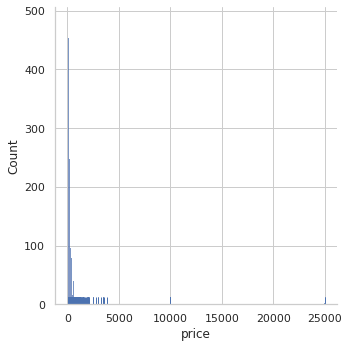

In [625]:
plt.figure(figsize=(20,6))
sb.displot(listing['price'], rug=True)

<Axes: xlabel='price', ylabel='Count'>

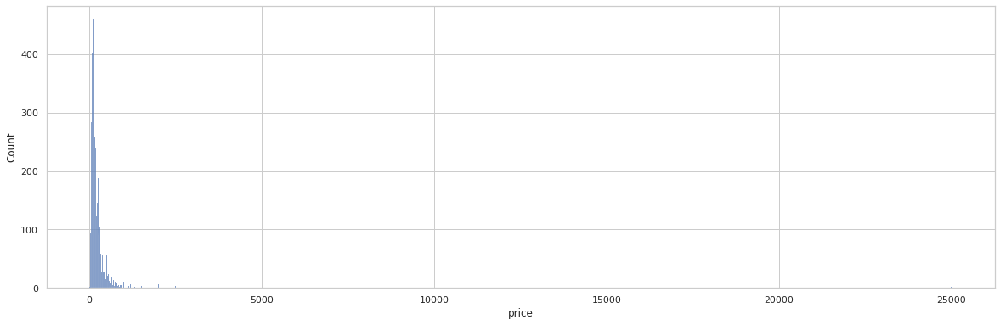

In [626]:
plt.figure(figsize=(20,6))
sb.histplot(listing['price'])

In [627]:
listing.price.describe()

count     4696.000000
mean       242.693143
std        653.676135
min         10.000000
25%        100.000000
50%        150.000000
75%        250.000000
max      25000.000000
Name: price, dtype: float64

**Cleaning the minimum nights outliers**

Dropping the records whose minimum nights is more than 365 days. As general lease agreement is not more than a year long.

In [628]:
#Analysing the records count whose minimum_nights is greater than 365
listing[listing["minimum_nights"]>365].shape[0]

6

In [629]:
#dropping the outlier whose minimum nights is greater than 365
listing = listing[listing["minimum_nights"]<=365]

In [630]:
listing.shape

(4690, 60)

In [631]:
listing["minimum_nights"].max()

365

In [632]:
listing.shape

(4690, 60)

In [633]:
listing.columns

Index(['id', 'name', 'description', 'neighborhood_overview', 'host_id',
       'host_name', 'host_since', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'calendar_last_scraped', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review',

In [634]:
#Change f/t values to binary 0/1
listing['host_is_superhost'].replace('t',1, inplace=True)
listing['host_is_superhost'].replace('f',0, inplace=True)
listing['instant_bookable'].replace('t',1, inplace=True)
listing['instant_bookable'].replace('f',0, inplace=True)
listing['host_has_profile_pic'].replace('t',1, inplace=True)
listing['host_has_profile_pic'].replace('f',0, inplace=True)
listing['host_identity_verified'].replace('t',1, inplace=True)
listing['host_identity_verified'].replace('f',0, inplace=True)
listing['has_availability'].replace('t',1, inplace=True)
listing['has_availability'].replace('f',0, inplace=True)

In [635]:
listing.has_availability.unique()

array([1, 0])

In [636]:
listing.has_availability.value_counts()

1    4619
0      71
Name: has_availability, dtype: int64

In [637]:
listing['data_date']= datetime.strptime('2022-12-04', '%Y-%m-%d')
listing['host_since'] = pd.to_datetime(listing['host_since'])
listing['host_months'] = round((listing['data_date']-listing['host_since']).dt.days/30,0)
#Drop original host_since and data_date variables
listing = listing.drop(['data_date', 'host_since'], axis=1)

In [638]:
listing.isna().sum()

id                                                 0
name                                               0
description                                       19
neighborhood_overview                           1113
host_id                                            0
host_name                                          0
host_response_time                               620
host_response_rate                               620
host_acceptance_rate                             379
host_is_superhost                                  0
host_neighbourhood                               264
host_listings_count                                0
host_total_listings_count                          0
host_has_profile_pic                               0
host_identity_verified                             0
neighbourhood_cleansed                             0
neighbourhood_group_cleansed                       0
latitude                                           0
longitude                                     

In [639]:
listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4690 entries, 0 to 6788
Data columns (total 60 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            4690 non-null   int64         
 1   name                                          4690 non-null   object        
 2   description                                   4671 non-null   object        
 3   neighborhood_overview                         3577 non-null   object        
 4   host_id                                       4690 non-null   int64         
 5   host_name                                     4690 non-null   object        
 6   host_response_time                            4070 non-null   object        
 7   host_response_rate                            4070 non-null   object        
 8   host_acceptance_rate                          4311 non-null   object

**Visualizing Missing Data**

Visualization of missing values in each column

In [640]:
!pip install missingno

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


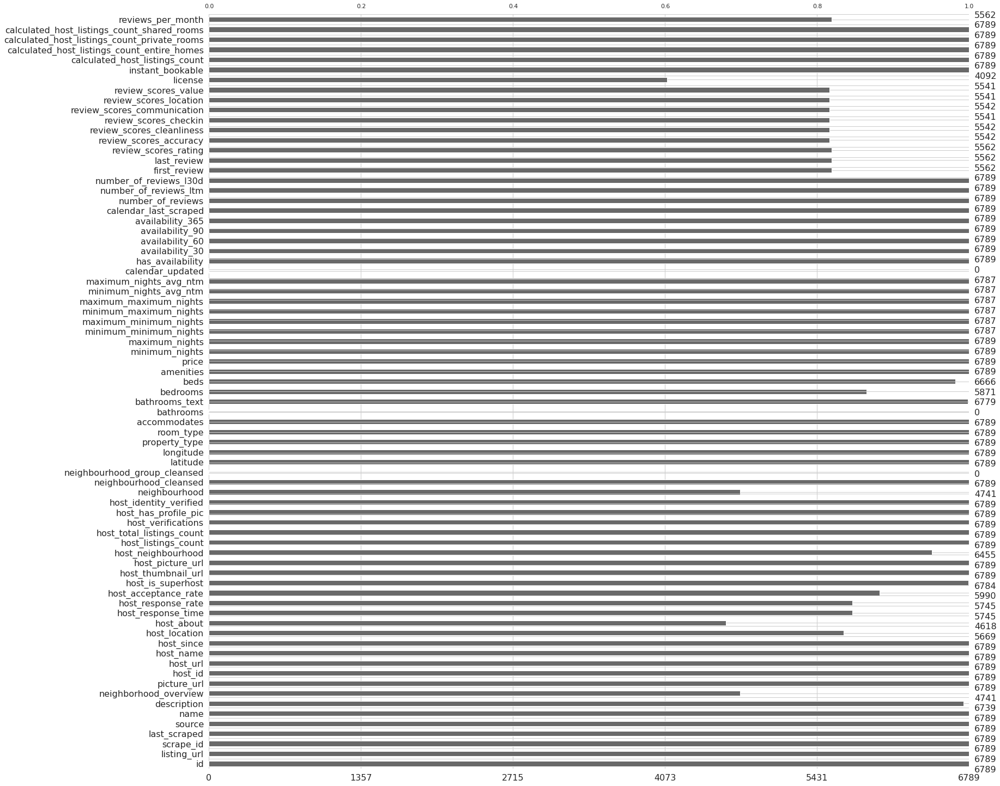

In [641]:
import missingno as msno
msno.bar(listingorig);

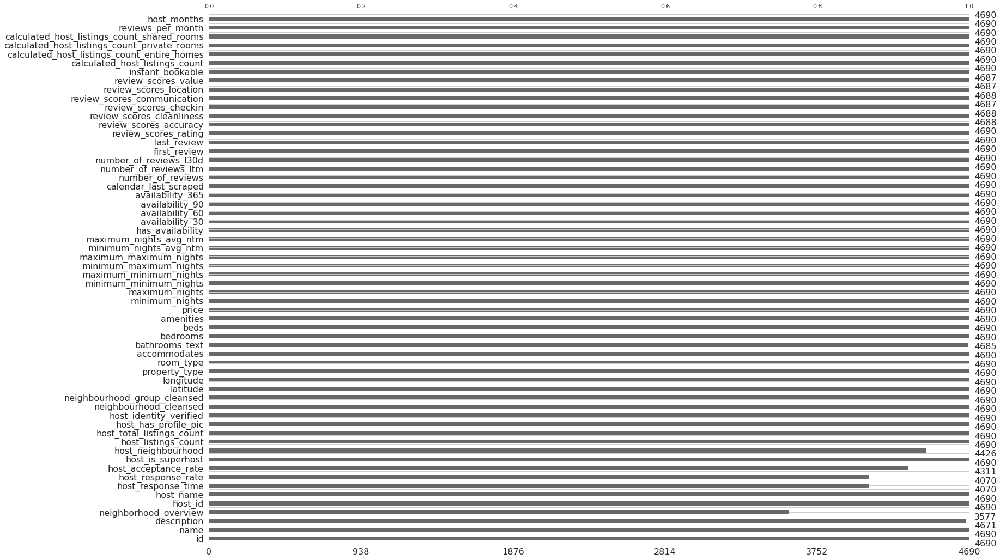

In [642]:
msno.bar(listing);

In [643]:
pd.set_option('display.max_rows', listing.shape[0]+1)

In [644]:
# calculate the % missing values
percentage_result = listing.isnull().sum()/listing.shape[0] * 100
# create a DataFrame to show case the result
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "% missing": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,% missing
0,id,0.000000
1,name,0.000000
2,description,0.405117
3,neighborhood_overview,23.731343
4,host_id,0.000000
5,host_name,0.000000
6,host_response_time,13.219616
7,host_response_rate,13.219616
8,host_acceptance_rate,8.081023
9,host_is_superhost,0.000000


In [645]:
pd.reset_option("all")

Heatmap to see correlation of data between columns

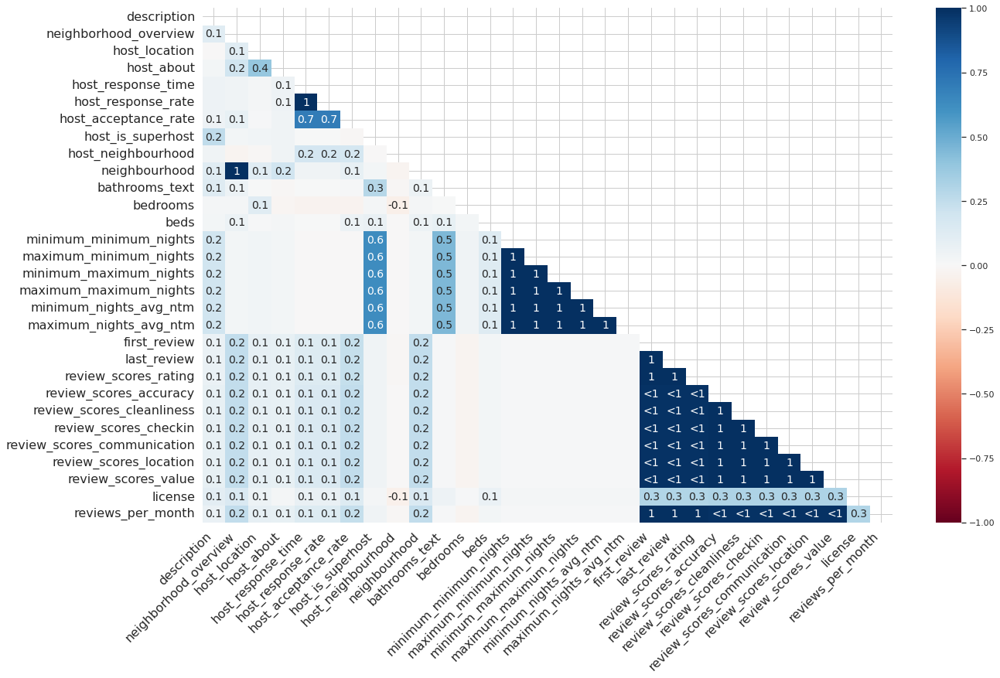

In [646]:
msno.heatmap(listingorig);

In [647]:
pd.set_option('display.max_rows', listingorig.shape[0]+1)

In [648]:
pd.reset_option("all")

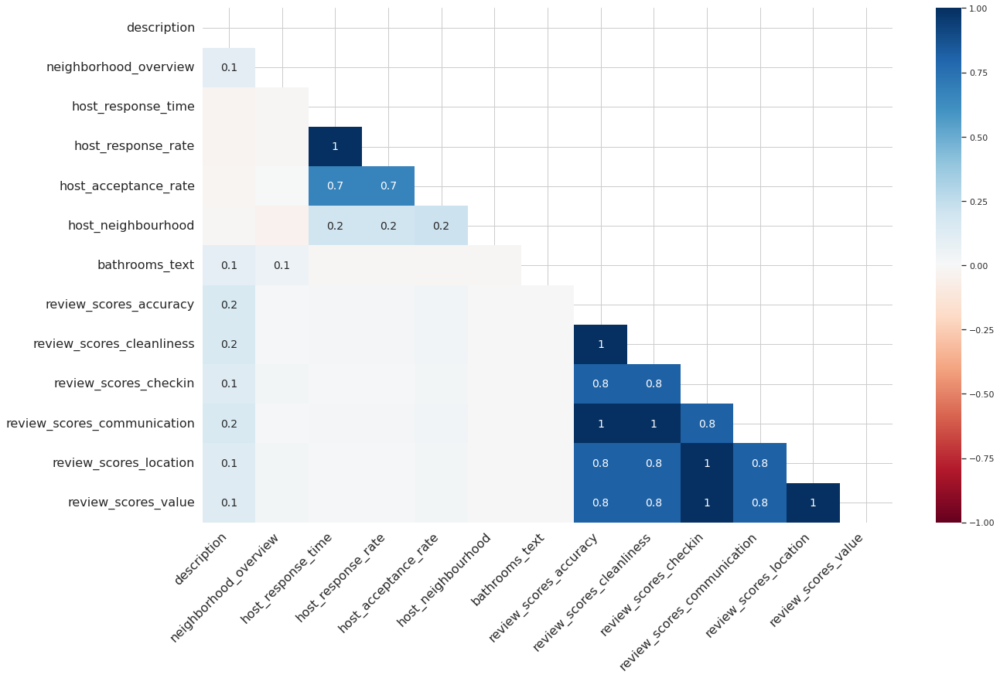

In [649]:
msno.heatmap(listing);

In [650]:
listing.corr()

,id,host_id,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_months
id,1.000000,0.273018,-0.076129,-0.022730,-0.017262,-0.010871,-0.013502,-0.030716,-0.027001,0.060676,...,0.024909,-0.029314,0.029485,0.029222,-0.033403,-0.010126,-0.048145,-0.037370,0.143772,-0.231963
host_id,0.273018,1.000000,-0.076351,0.004018,0.002018,-0.007650,-0.125341,0.037785,-0.038845,-0.014000,...,-0.070393,-0.073910,-0.061577,0.176007,-0.014360,-0.044445,0.058506,0.021464,0.187139,-0.915542
host_is_superhost,-0.076129,-0.076351,1.000000,-0.087808,-0.091717,0.063810,0.025636,-0.061882,-0.073920,0.035260,...,0.198838,0.161335,0.215330,-0.119106,-0.132289,-0.081344,-0.103886,-0.100304,0.160474,0.073012
host_listings_count,-0.022730,0.004018,-0.087808,1.000000,0.982114,0.003856,0.033962,0.092808,0.111456,-0.043220,...,-0.170950,-0.114246,-0.151247,-0.043760,0.643298,0.692823,-0.011168,-0.002574,-0.072726,-0.044647
host_total_listings_count,-0.017262,0.002018,-0.091717,0.982114,1.000000,-0.006056,0.026058,0.101126,0.116353,-0.043482,...,-0.170881,-0.107439,-0.154915,-0.032950,0.625497,0.667644,0.005275,-0.002514,-0.077395,-0.044278
host_has_profile_pic,-0.010871,-0.007650,0.063810,0.003856,-0.006056,1.000000,0.218729,-0.059614,-0.055488,0.033634,...,0.084647,-0.006378,0.007858,-0.084368,-0.140343,0.021493,-0.459829,0.010703,0.008516,0.019217
host_identity_verified,-0.013502,-0.125341,0.025636,0.033962,0.026058,0.218729,1.000000,-0.013202,0.003094,0.011341,...,0.041484,-0.016134,-0.010120,-0.068935,0.025338,0.065195,-0.121053,0.036476,0.018461,0.137422
latitude,-0.030716,0.037785,-0.061882,0.092808,0.101126,-0.059614,-0.013202,1.000000,0.140989,-0.029419,...,-0.080236,0.134659,-0.092922,0.121218,0.153786,0.100776,0.140859,0.036284,-0.094414,-0.044029
longitude,-0.027001,-0.038845,-0.073920,0.111456,0.116353,-0.055488,0.003094,0.140989,1.000000,-0.083509,...,-0.058565,-0.112323,-0.069742,0.047976,0.124921,0.116554,0.052967,-0.042210,-0.143337,0.048727
accommodates,0.060676,-0.014000,0.035260,-0.043220,-0.043482,0.033634,0.011341,-0.029419,-0.083509,1.000000,...,0.085702,0.086255,0.067168,-0.047816,-0.113995,-0.029541,-0.201787,-0.080468,-0.000209,0.014996


In [651]:
len(listingorig.columns)

75

In [652]:
len(listing.columns)

60

In [653]:
listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4690 entries, 0 to 6788
Data columns (total 60 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            4690 non-null   int64         
 1   name                                          4690 non-null   object        
 2   description                                   4671 non-null   object        
 3   neighborhood_overview                         3577 non-null   object        
 4   host_id                                       4690 non-null   int64         
 5   host_name                                     4690 non-null   object        
 6   host_response_time                            4070 non-null   object        
 7   host_response_rate                            4070 non-null   object        
 8   host_acceptance_rate                          4311 non-null   object

In [654]:
import seaborn as sns

In [655]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif_(X):
    
    '''X - pandas dataframe'''
    thresh = 10.0
    print("vif_threshold :: ", thresh)
    variables = list(range(X.shape[1]))
    
    print("variables :: ", variables)

    for i in variables:
        print("i :: ", i)
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]

    print('Remaining variables:')
    print(X.columns[variables])
    return X

from joblib import Parallel, delayed
from statsmodels.stats.outliers_influence import variance_inflation_factor

def removeMultiColl(data, vif_threshold = 5.0):
    print("vif_threshold :: ", vif_threshold)
    for i in data.columns:
        if data[i].nunique() == 1:
            print(f"Dropping {i} due to just 1 unique value")
            data.drop(columns = i, inplace = True)
    drop = True
    col_list = list(data.columns)
    print("col_list :: ", col_list)
    while drop == True:
        drop = False
        vif_list = Parallel(n_jobs = -1, verbose = 5)(delayed(variance_inflation_factor)(data[col_list].values, i) for i in range(data[col_list].shape[1]))
        print("vif_list :: ", vif_list)
        max_index = vif_list.index(max(vif_list))
        print("max_index :: ", max_index)
        if vif_list[max_index] > vif_threshold:
            print("vif_list[max_index] :: ", vif_list[max_index])
            print(f"Dropping column : {col_list[max_index]} at index - {max_index}")
            del col_list[max_index]
            drop = True
    print("Remaining columns :\n", list(data[col_list].columns))
    return data[col_list]

listing_droppedcopy = listing.apply(pd.to_numeric, errors='ignore').info()
listing_droppedcopy = listing.apply(pd.to_numeric, errors='ignore')
print("listing_droppedcopy 1 :: ", listing_droppedcopy)
print("listing_droppedcopy 1 check info :: ")
listing_droppedcopy.info()
listing_droppedcopy = listing_droppedcopy.select_dtypes(exclude=['object'])
print("listing_droppedcopy :: ", listing_droppedcopy)
print("listing_droppedcopy check info :: ")
listing_droppedcopy = listing_droppedcopy.select_dtypes(exclude=['datetime64[ns]'])
print("listing_droppedcopy excluded datetime64[ns] :: ", listing_droppedcopy)
print("listing_droppedcopy datetime64[ns] check info :: ")
listing_droppedcopy.info()
print("listing_droppedcopy check shape :: ", listing_droppedcopy.shape)
print("listing_droppedcopy check na values :: ", listing_droppedcopy.isna().sum())

listing_droppedcopy = listing_droppedcopy.dropna()

listing_droppedcopy['tt'] = 10

print("listing_droppedcopy ready for vif implementation / processing :: ", listing_droppedcopy.isna().sum())

vifdf = calculate_vif_(listing_droppedcopy)

print("vifdf :: ", vifdf.head())

print("vifdf check info :: ")

vifdf.drop('tt', axis = 1, inplace=True)

vifdf.info()

multicolldf = removeMultiColl(listing_droppedcopy, 10)

print("multicolldf check info :: ")

multicolldf.info()

print("listing_droppedcopy final check info :: ")

listing_droppedcopy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4690 entries, 0 to 6788
Data columns (total 60 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4690 non-null   int64  
 1   name                                          4690 non-null   object 
 2   description                                   4671 non-null   object 
 3   neighborhood_overview                         3577 non-null   object 
 4   host_id                                       4690 non-null   int64  
 5   host_name                                     4690 non-null   object 
 6   host_response_time                            4070 non-null   object 
 7   host_response_rate                            4070 non-null   object 
 8   host_acceptance_rate                          4311 non-null   object 
 9   host_is_superhost                             4690 non-null   i

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  37 out of  44 | elapsed:    1.9s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  44 out of  44 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


vif_list ::  [1.0850116321221459, 1.0936374841647636, 1.0271014771287539, 1.0002895437512529, 0.99995652078659858, 0.94267546859159679, 1.0106725399600747, 0.00060738020648824808, 8.5423423815207835e-05, 1.0093451654286922, 1.0075417396975286, 1.0034492828518036, 1.1661387936332734, 1.0014002668599453, 1.0002208630015557, 1.0019504670141723, 1.0012301455779558, 6.8303525228304176, 24.876574112767319, 1.0014266051909428, 41.030788044256617, 1.081479797926503, 1.0209864053028959, 1.0268440370510012, 1.0299983552797578, 1.0115815324095478, 1.0641663412324331, 1.0342621523693889, 1.0321437599111709, 0.0011807052104977442, 0.99081743470720252, 0.97044886581273271, 0.97796278766743461, 0.92808251466965053, 0.94354515614646761, 0.93597105145993398, 0.98931869153476548, 1.0411738682592795, 0.99898613131779856, 1.001215711913966, 1.0075523170146692, 1.0018623919945535, 1.0549032290365363, 5.9410655422360366]
max_index ::  20
vif_list[max_index] ::  41.0307880443
Dropping column : maximum_nights

[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  36 out of  43 | elapsed:    0.4s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  43 out of  43 | elapsed:    0.4s finished


vif_list ::  [1.0850116321172301, 1.0936374841112662, 1.027101478569737, 1.0002895418038007, 0.99995651927156171, 0.94267545875670822, 1.0106725390559872, 0.00060738019351984644, 8.5423412735231367e-05, 1.0093451655315551, 1.0075417393495389, 1.003444813385638, 1.0979363260855881, 1.0014002668289002, 1.0002208630012275, 1.001950466983867, 1.0012301455525114, 3.1925494649925512, 3.2011906503988072, 1.0014266051650633, 1.0814797899595847, 1.0209864051881665, 1.0268440368882461, 1.029998355084792, 1.011508915232231, 1.0641660950207805, 1.0342621523036288, 1.0321437598955467, 0.0011726552614118664, 0.99040842470448864, 0.97009781905715697, 0.97786185951246452, 0.92796610508594335, 0.94354514963740954, 0.93562078221000866, 0.98916134349109897, 1.0411738682372549, 0.99898529531685232, 1.0012157119060683, 1.0075455502171302, 1.0018623919951528, 1.0549027104874136, 5.9410655066337767]
max_index ::  42
Remaining columns :
 ['id', 'host_id', 'host_is_superhost', 'host_listings_count', 'host_tota

In [656]:
listing_droppedcopy.corr()

,id,host_id,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_months
id,1.000000,0.272960,-0.076223,-0.022762,-0.017297,-0.010847,-0.013412,-0.030669,-0.027165,0.061015,...,0.024943,-0.029314,0.029485,0.029291,-0.033465,-0.010158,-0.048222,-0.037400,0.143631,-0.232009
host_id,0.272960,1.000000,-0.076345,0.003994,0.001992,-0.007630,-0.125278,0.037797,-0.038995,-0.013660,...,-0.070375,-0.073910,-0.061577,0.176230,-0.014404,-0.044464,0.058446,0.021442,0.187040,-0.915600
host_is_superhost,-0.076223,-0.076345,1.000000,-0.087856,-0.091770,0.063846,0.025704,-0.061659,-0.074001,0.034482,...,0.198935,0.161335,0.215330,-0.119821,-0.132403,-0.081442,-0.103922,-0.100354,0.160413,0.072899
host_listings_count,-0.022762,0.003994,-0.087856,1.000000,0.982113,0.003864,0.033991,0.092829,0.111444,-0.043200,...,-0.170943,-0.114246,-0.151247,-0.043764,0.643295,0.692822,-0.011189,-0.002582,-0.072786,-0.044657
host_total_listings_count,-0.017297,0.001992,-0.091770,0.982113,1.000000,-0.006047,0.026089,0.101149,0.116337,-0.043454,...,-0.170873,-0.107439,-0.154915,-0.032948,0.625493,0.667642,0.005251,-0.002523,-0.077462,-0.044289
host_has_profile_pic,-0.010847,-0.007630,0.063846,0.003864,-0.006047,1.000000,0.218717,-0.059629,-0.055466,0.033614,...,0.084640,-0.006378,0.007858,-0.084415,-0.140331,0.021501,-0.459828,0.010710,0.008558,0.019225
host_identity_verified,-0.013412,-0.125278,0.025704,0.033991,0.026089,0.218717,1.000000,-0.013247,0.003231,0.011128,...,0.041457,-0.016134,-0.010120,-0.069013,0.025392,0.065226,-0.120998,0.036502,0.018613,0.137456
latitude,-0.030669,0.037797,-0.061659,0.092829,0.101149,-0.059629,-0.013247,1.000000,0.141125,-0.029190,...,-0.080284,0.134659,-0.092922,0.121494,0.153836,0.100816,0.140882,0.036300,-0.094340,-0.043974
longitude,-0.027165,-0.038995,-0.074001,0.111444,0.116337,-0.055466,0.003231,0.141125,1.000000,-0.083328,...,-0.058464,-0.112323,-0.069742,0.048163,0.124894,0.116547,0.052931,-0.042264,-0.143653,0.048715
accommodates,0.061015,-0.013660,0.034482,-0.043200,-0.043454,0.033614,0.011128,-0.029190,-0.083328,1.000000,...,0.085762,0.086255,0.067168,-0.049198,-0.114035,-0.029592,-0.201750,-0.080498,0.000166,0.014887


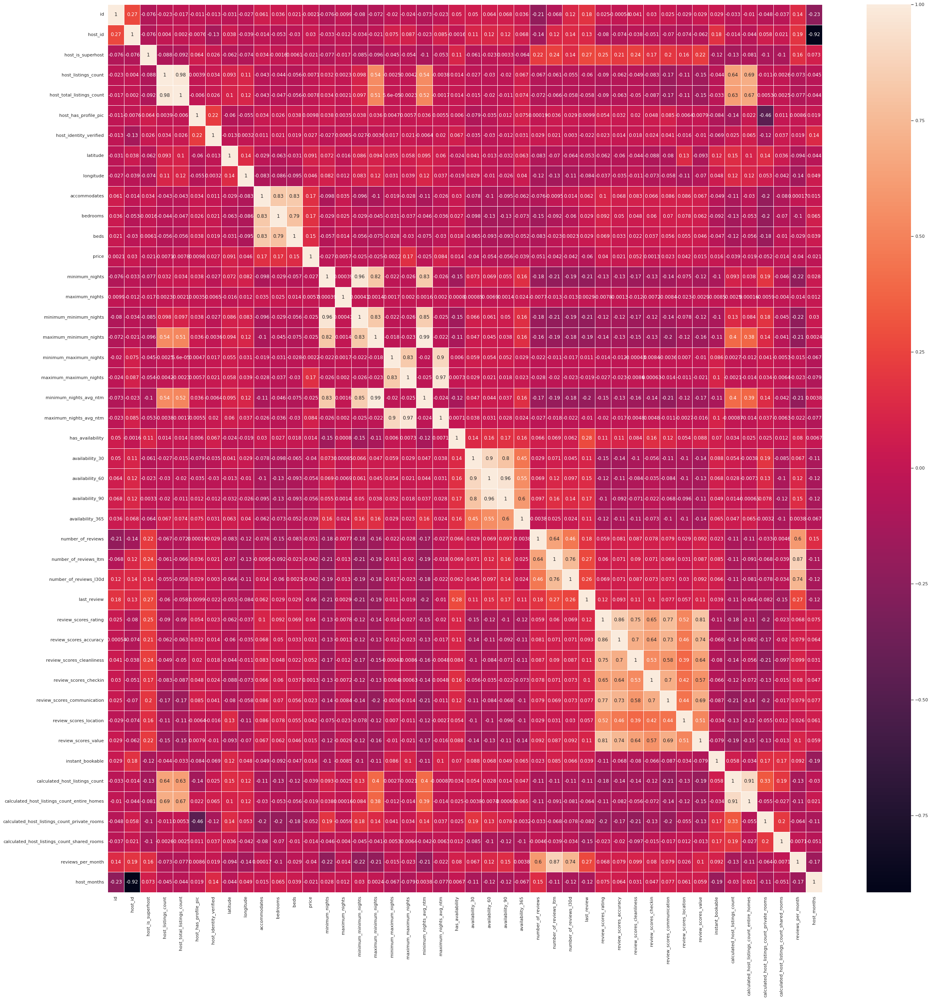

In [657]:
fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.heatmap(listing_droppedcopy.corr(), annot=True, ax=ax, linewidths=1)
plt.show()

In [658]:
listing[['host_total_listings_count','calculated_host_listings_count', 
                       'calculated_host_listings_count_entire_homes', 
                       'calculated_host_listings_count_private_rooms', 
                       'calculated_host_listings_count_shared_rooms']]

,host_total_listings_count,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,9,9,4,5,0
1,1,1,1,0,0
2,2,1,1,0,0
3,13,12,0,12,0
4,6,2,2,0,0
...,...,...,...,...,...
6784,1,1,1,0,0
6785,5,1,1,0,0
6786,3,2,1,1,0
6787,3,1,0,1,0


In [659]:
listing[["price","minimum_nights","number_of_reviews","calculated_host_listings_count","availability_365"]].describe()

,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
count,4690.000000,4690.000000,4690.000000,4690.000000,4690.000000
mean,242.579744,18.591045,63.644136,6.751173,170.000213
std,654.058119,38.728202,104.683287,17.557198,128.409232
min,10.000000,1.000000,1.000000,1.000000,0.000000
25%,100.000000,2.000000,4.000000,1.000000,55.000000
50%,150.000000,4.000000,18.000000,2.000000,157.000000
75%,250.000000,30.000000,75.750000,4.000000,299.000000
max,25000.000000,365.000000,977.000000,153.000000,365.000000


**Analysing the data validity of calculated_host_listings_count**

From the above statistics, we can conclude that based on calculated_host_listings_count, the max is 153.

I am going to verify if the value is equal to the value calculated by grouping records based on host_id

In [660]:
listing.groupby("host_id")["price"].count().sort_values(ascending=False)

host_id
117141107    42
17042045     29
107434423    29
4430421      25
131200418    22
             ..
9095863       1
9095946       1
9106943       1
9113472       1
487306954     1
Name: price, Length: 2934, dtype: int64

In [661]:
#Analysing of the account has listed same property more than once by verifing if the names of listings are same
listing[listing["host_id"]==117141107]["name"].value_counts()

Red Victorian - Private suite w/bath, Redwood         1
Red Victorian - Dusk Bottom Bunk, Hole in the Wall    1
Red Victorian - Four beds in shared Hula Hoop Room    1
Red Victorian:Saturn Bottom bunk in Hula Hoop Room    1
Red Victorian - Jupiter Bunk shared room Hula Hoop    1
Red Victorian - Double bed in shared Eden Hostel      1
Red Victorian - Private room, Peace Room              1
Red Victorian - Private room w loftbed, Butterfly     1
Red Victorian - Private room, Hole in the Wall        1
Red Victorian - Dawn Top Bunk, Hole in the Wall       1
Red Victorian - Private room 1/2 bath, Night Duty     1
Red Victorian - Air Bunk in shared Peacock Room       1
Red Victorian  - Top double in shared Eden Hostel     1
Red Victorian- Eden Hostel single bed shared room     1
Red Victorian - Moon Bunk in shared Friends Room      1
Red Victorian - Star Bunk in shared Friends Room      1
Red Victorian - Comet Bunk in shared Friends Room     1
Red Victorian: Neptune top bunk, Hula Hoop Room 

Noticed that all the listings by the host have unique names. So analysing further by looking for value counts based on grouping by neighbourhood, room_type, latitude and longitude values

In [662]:
listing[listing["host_id"]==117141107][["neighbourhood_cleansed","room_type","latitude","longitude"]].value_counts()

neighbourhood_cleansed  room_type     latitude  longitude 
Haight Ashbury          Shared room   37.76942  -122.44991    12
                        Private room  37.76944  -122.44992    11
                                      37.76942  -122.44991     5
                        Shared room   37.76944  -122.44992     5
                        Hotel room    37.76944  -122.44992     1
                        Shared room   37.77073  -122.44490     1
                                      37.77075  -122.44412     1
                                      37.77078  -122.44289     1
                                      37.77080  -122.44369     1
                                      37.77085  -122.44324     1
                                      37.77137  -122.44474     1
                                      37.77253  -122.44504     1
                                      37.77275  -122.44489     1
dtype: int64

As there are only few lisitngs with all the neighbourhood, room_type, latitude and longitude values same, we can conclude that the host is genuine.

Also, as the calculated_host_listings values looks outdated, I will not consider that feature during analysis. Hence, I shall drop the feature.

In [663]:
#we will skip first column for now and begin from host_id

#let's see what hosts (IDs) have the most listings on Airbnb platform and taking advantage of this service
top_host=listing.host_id.value_counts().head(10)
top_host

117141107    42
17042045     29
107434423    29
4430421      25
131200418    22
100238132    21
1257432      21
48005494     21
55782784     20
62034618     17
Name: host_id, dtype: int64

In [664]:
#coming back to our dataset we can confirm our fidnings with already existing column called 'calculated_host_listings_count'
top_host_check=listing.calculated_host_listings_count.max()
top_host_check

153

In [665]:
top_host_df=pd.DataFrame(top_host)
top_host_df.reset_index(inplace=True)
top_host_df.rename(columns={'index':'Host_ID', 'host_id':'P_Count'}, inplace=True)
top_host_df

,Host_ID,P_Count
0,117141107,42
1,17042045,29
2,107434423,29
3,4430421,25
4,131200418,22
5,100238132,21
6,1257432,21
7,48005494,21
8,55782784,20
9,62034618,17


[Text(0, 0, '1257432'),
 Text(1, 0, '4430421'),
 Text(2, 0, '17042045'),
 Text(3, 0, '48005494'),
 Text(4, 0, '55782784'),
 Text(5, 0, '62034618'),
 Text(6, 0, '100238132'),
 Text(7, 0, '107434423'),
 Text(8, 0, '117141107'),
 Text(9, 0, '131200418')]

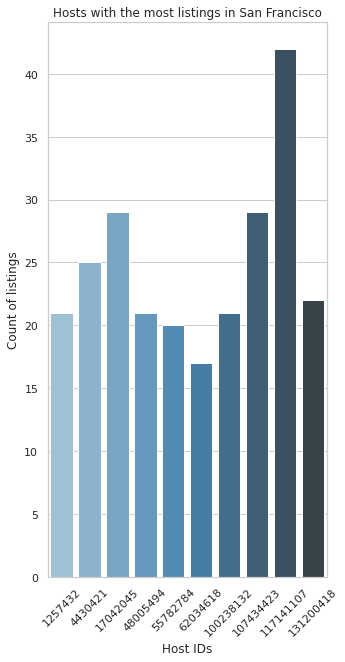

In [666]:
viz_1=sns.barplot(x="Host_ID", y="P_Count", data=top_host_df,
                 palette='Blues_d')
viz_1.set_title('Hosts with the most listings in San Francisco')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Host IDs')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)

In [667]:
listing.drop("calculated_host_listings_count",axis=1,inplace=True)

Let's remove the columns that are similar to host_total_listing_count since these columns are highly correlated with it

In [668]:
listing.drop(['host_total_listings_count', 
                       'calculated_host_listings_count_entire_homes', 
                       'calculated_host_listings_count_private_rooms', 
                       'calculated_host_listings_count_shared_rooms'], axis=1, inplace=True)

In [669]:
#Considering room_type as a categorical variable
listing["room_type"] = listing["room_type"].astype("category")

In [670]:
#Considering neighbourhood_group_cleansed as a categorical variable
listing["neighbourhood_group_cleansed"] = listing["neighbourhood_group_cleansed"].astype("category")

Considering the 95 percentile data for analysis, as there few listings whose price distribution is right skewed and are outliers to the overall data.

In [671]:
# ! pip install plotly==4.11.0
! pip install cufflinks

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [672]:
!pip install plotly --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [673]:
# # #Using plotly and cufflinks for interactive plotting of pandas data frame
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# import cufflinks as cf
# init_notebook_mode(connected = True)
# cf.go_offline()

<Axes: ylabel='Frequency'>

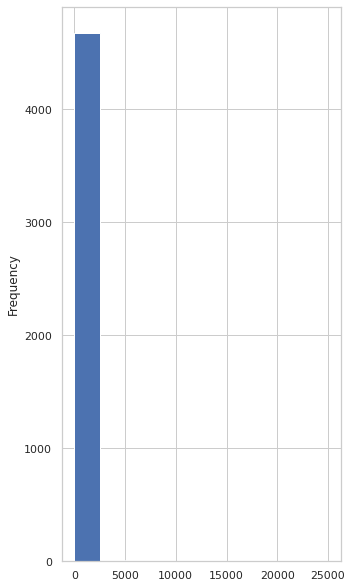

In [674]:
listing["price"].plot(kind="hist")

# I noticed some similarities on the data for minimum and maximum night stay, I will only be keeping minimum_nights and maximum_nights

In [675]:
listing[['minimum_nights', 'maximum_nights', 'minimum_minimum_nights','minimum_maximum_nights', 
                       'maximum_minimum_nights','maximum_maximum_nights', 
                       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm']]

,minimum_nights,maximum_nights,minimum_minimum_nights,minimum_maximum_nights,maximum_minimum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
0,30,365,30.0,365.0,30.0,365.0,30.0,365.0
1,2,30,1.0,1125.0,2.0,1125.0,2.0,1125.0
2,30,60,30.0,60.0,30.0,60.0,30.0,60.0
3,32,90,32.0,90.0,32.0,90.0,32.0,90.0
4,9,91,9.0,91.0,9.0,91.0,9.0,91.0
...,...,...,...,...,...,...,...,...
6784,3,28,3.0,1125.0,3.0,1125.0,3.0,1125.0
6785,2,29,2.0,29.0,2.0,29.0,2.0,29.0
6786,1,98,1.0,1125.0,1.0,1125.0,1.0,1125.0
6787,2,1125,2.0,1125.0,2.0,1125.0,2.0,1125.0


In [676]:
listing.drop(['minimum_minimum_nights','minimum_maximum_nights', 
                       'maximum_minimum_nights','maximum_maximum_nights', 
                       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm'], axis=1, inplace=True)

**Let's take a look at the shape of our data**

In [677]:
listing.shape

(4690, 49)

Above histogram plot, further confirms that the price distribution of the listings is right skewed.

In [678]:
listing.head()

,id,name,description,neighborhood_overview,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months
0,144978,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,216682,Jay,within a few hours,100%,89%,0,...,4.68,4.78,4.45,4.86,4.81,4.81,4.66,0,0.86,149.0
1,958,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,1169,Holly,within an hour,100%,98%,1,...,4.86,4.93,4.92,4.95,4.88,4.98,4.76,0,2.28,175.0
2,5858,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,8904,Philip And Tania,within a few hours,80%,71%,0,...,4.88,4.85,4.87,4.89,4.85,4.77,4.68,0,0.67,168.0
3,8142,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",21994,Aaron,within a few hours,100%,74%,0,...,4.67,4.44,4.44,4.78,4.78,4.67,4.67,0,0.09,164.0
4,8339,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,24215,Rosy,within a few hours,100%,0%,0,...,4.87,4.88,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0


In [679]:
np.percentile(listing["price"],95)

585.0

In [680]:
listing['price'].max()

25000.0

**Price Distribution analysis**

In [681]:
import seaborn as sns

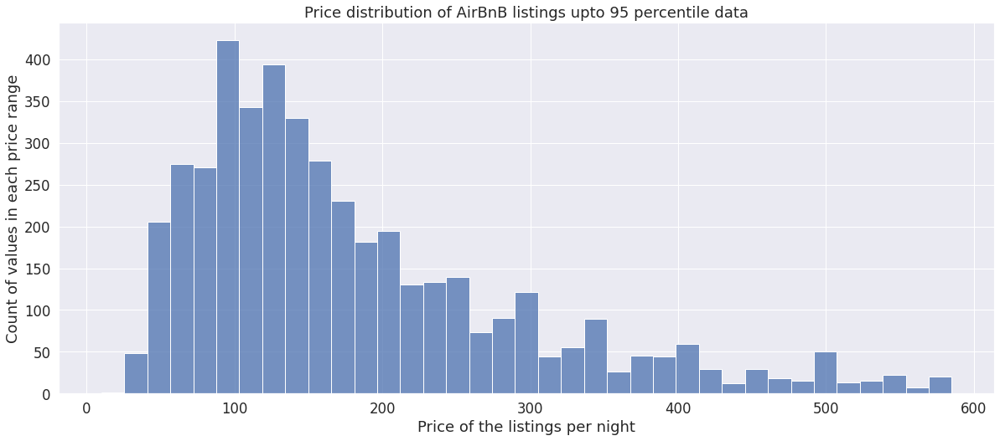

In [682]:
#Considering the 95 percentile data of price
sns.set(rc={'figure.figsize':(20,8)})
sns.set(font_scale=1.5)
sns.histplot(listing[listing["price"]<=585]["price"],kde=False)
plt.title("Price distribution of AirBnB listings upto 95 percentile data")
plt.xlabel("Price of the listings per night")
plt.ylabel("Count of values in each price range")
plt.show()

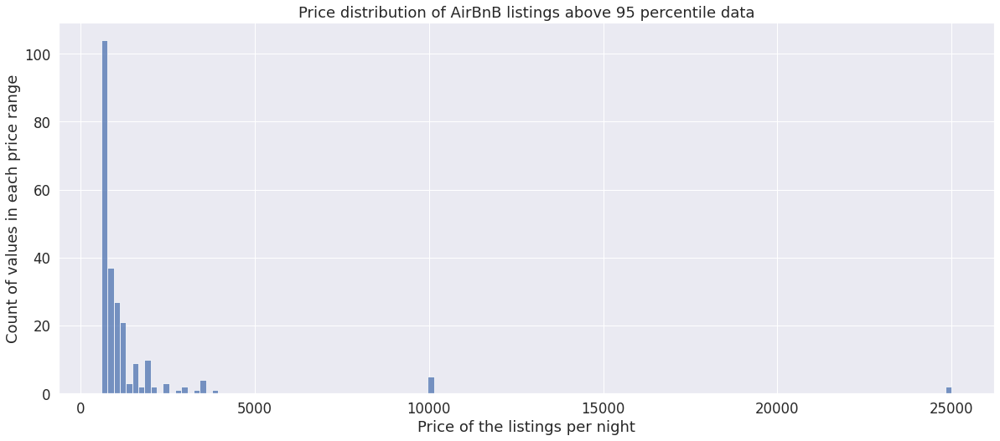

In [683]:
sns.histplot(listing[listing["price"]>585]["price"],kde=False)
plt.title("Price distribution of AirBnB listings above 95 percentile data")
plt.xlabel("Price of the listings per night")
plt.ylabel("Count of values in each price range")
plt.show()

Defining a new data frame variable data_95 with upto 95 percentile price distribution lisitngs

In [684]:
listing_data_95 = listing[listing["price"]<=np.percentile(listing["price"],95)]

In [685]:
# # Get a list of the numeric features
numeric_features = listing_data_95.select_dtypes(include='number').columns.tolist()

numeric_features

['id',
 'host_id',
 'host_is_superhost',
 'host_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'latitude',
 'longitude',
 'accommodates',
 'bedrooms',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'instant_bookable',
 'reviews_per_month',
 'host_months']

In [686]:
listing_data_95.host_response_time.unique()

array(['within a few hours', 'within an hour', 'within a day', nan,
       'a few days or more'], dtype=object)

In [687]:
listing_data_95.host_response_time.value_counts()

within an hour        2797
within a few hours     735
within a day           307
a few days or more      30
Name: host_response_time, dtype: int64

In [688]:
listing_data_95['host_response_time'].isna().sum()

587

In [689]:
# Cardinality of the nonnumeric features
cardinality = listing_data_95.select_dtypes(exclude='number').nunique()

In [690]:
cardinality

name                            4376
description                     4274
neighborhood_overview           2820
host_name                       1640
host_response_time                 4
host_response_rate                31
host_acceptance_rate              83
host_neighbourhood               178
neighbourhood_cleansed            36
neighbourhood_group_cleansed       1
property_type                     44
room_type                          4
bathrooms_text                    26
amenities                       4249
calendar_last_scraped              1
first_review                    2311
last_review                      884
dtype: int64

In [691]:
# List of all categorical features with  (2< cardinality <70)
cat_features = cardinality[(cardinality <= 70) & (cardinality > 2) ].index.tolist()

In [692]:
cat_features

['host_response_time',
 'host_response_rate',
 'neighbourhood_cleansed',
 'property_type',
 'room_type',
 'bathrooms_text']

In [693]:
#Recode host_response_time to ordinal values
# listing['host_response_time'].replace('within an hour', 1, inplace=True)
# listing['host_response_time'].replace('within a few hours', 2, inplace=True)
# listing['host_response_time'].replace('within a day', 3, inplace=True)
# listing['host_response_time'].replace('a few days or more', 4, inplace=True)
#Impute missing values using forward-fill method
listing_data_95['host_response_time'].fillna(method='ffill', inplace=True)

In [694]:
listing_data_95['host_response_time'].isna().sum()

0

In [695]:
listing_data_95.host_response_time.unique()

array(['within a few hours', 'within an hour', 'within a day',
       'a few days or more'], dtype=object)

In [696]:
listing_data_95.host_response_time.value_counts()

within an hour        3187
within a few hours     873
within a day           358
a few days or more      38
Name: host_response_time, dtype: int64

In [697]:
listing_droppedhostrrwithoutna = listing_data_95[listing_data_95['host_response_rate']!='N/A']

In [698]:
listing_droppedhostrrwithoutna.head()

,id,name,description,neighborhood_overview,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months
0,144978,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,216682,Jay,within a few hours,100%,89%,0,...,4.68,4.78,4.45,4.86,4.81,4.81,4.66,0,0.86,149.0
1,958,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,1169,Holly,within an hour,100%,98%,1,...,4.86,4.93,4.92,4.95,4.88,4.98,4.76,0,2.28,175.0
2,5858,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,8904,Philip And Tania,within a few hours,80%,71%,0,...,4.88,4.85,4.87,4.89,4.85,4.77,4.68,0,0.67,168.0
3,8142,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",21994,Aaron,within a few hours,100%,74%,0,...,4.67,4.44,4.44,4.78,4.78,4.67,4.67,0,0.09,164.0
4,8339,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,24215,Rosy,within a few hours,100%,0%,0,...,4.87,4.88,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0


In [699]:
listing_data_95.host_response_rate = listing_droppedhostrrwithoutna.host_response_rate.str[:-1].astype('float64')
print("mean response rate is:", round(listing_data_95.host_response_rate.mean(), 2))
print("median response rate is:", round(listing_data_95.host_response_rate.median(), 2))
print("the proportion of those who respond 100% of the time is: ", round((listing_data_95.host_response_rate == 100).sum()/listing_data_95.host_response_rate.count(),2))
#Convert response percentages to numbers
listing_data_95['host_response_rate'] = listing_data_95['host_response_rate'].replace('%','',regex=True).astype('float64')/100.00
#Impute missing values using forward-fill method
listing_data_95['host_response_rate'].fillna(method='ffill', inplace=True)

mean response rate is: 97.63
median response rate is: 100.0
the proportion of those who respond 100% of the time is:  0.85


In [700]:
listing_droppedhostrrwithoutna1 = listing_data_95[listing_data_95['host_acceptance_rate']!='N/A']

In [701]:
listing_droppedhostrrwithoutna1.head()

,id,name,description,neighborhood_overview,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months
0,144978,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,216682,Jay,within a few hours,1.0,89%,0,...,4.68,4.78,4.45,4.86,4.81,4.81,4.66,0,0.86,149.0
1,958,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,1169,Holly,within an hour,1.0,98%,1,...,4.86,4.93,4.92,4.95,4.88,4.98,4.76,0,2.28,175.0
2,5858,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,8904,Philip And Tania,within a few hours,0.8,71%,0,...,4.88,4.85,4.87,4.89,4.85,4.77,4.68,0,0.67,168.0
3,8142,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",21994,Aaron,within a few hours,1.0,74%,0,...,4.67,4.44,4.44,4.78,4.78,4.67,4.67,0,0.09,164.0
4,8339,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,24215,Rosy,within a few hours,1.0,0%,0,...,4.87,4.88,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0


In [702]:
listing_data_95.host_acceptance_rate = listing_droppedhostrrwithoutna1.host_acceptance_rate.str[:-1].astype('float64')
print("mean acceptance rate is:", round(listing_data_95.host_acceptance_rate.mean(), 2))
print("median acceptance rate is:", round(listing_data_95.host_acceptance_rate.median(), 2))
print("the proportion of those who have 100% of acceptance rate is: ", round((listing_data_95.host_acceptance_rate == 100).sum()/listing_data_95.host_acceptance_rate.count(),2))
#Convert acceptance percentages to numbers
listing_data_95['host_acceptance_rate'] = listing_data_95['host_acceptance_rate'].replace('%','',regex=True).astype('float64')/100.00
#Impute missing values using forward-fill method
listing_data_95['host_acceptance_rate'].fillna(method='ffill', inplace=True)

mean acceptance rate is: 89.28
median acceptance rate is: 98.0
the proportion of those who have 100% of acceptance rate is:  0.39


In [703]:
len(listing_data_95[listing_data_95['host_response_rate']=='N/A'])

0

In [704]:
len(listing_data_95[listing_data_95['host_response_rate']!='N/A'])

4456

In [705]:
len(listing_data_95[listing_data_95['host_acceptance_rate']=='N/A'])

0

In [706]:
len(listing_data_95[listing_data_95['host_acceptance_rate']!='N/A'])

4456

In [707]:
listing_data_95['host_response_rate'].value_counts()

1.00    3819
0.90     139
0.99      55
0.96      46
0.80      40
0.92      40
0.97      40
0.98      36
0.67      32
0.00      30
0.50      20
0.88      18
0.89      17
0.75      17
0.83      15
0.94      14
0.95      13
0.78      12
0.60      12
0.71       8
0.86       8
0.93       6
0.82       5
0.91       4
0.57       2
0.76       2
0.77       2
0.85       1
0.56       1
0.25       1
0.40       1
Name: host_response_rate, dtype: int64

In [708]:
listing_data_95.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4456 entries, 0 to 6788
Data columns (total 49 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id                            4456 non-null   int64         
 1   name                          4456 non-null   object        
 2   description                   4439 non-null   object        
 3   neighborhood_overview         3396 non-null   object        
 4   host_id                       4456 non-null   int64         
 5   host_name                     4456 non-null   object        
 6   host_response_time            4456 non-null   object        
 7   host_response_rate            4456 non-null   float64       
 8   host_acceptance_rate          4456 non-null   float64       
 9   host_is_superhost             4456 non-null   int64         
 10  host_neighbourhood            4208 non-null   object        
 11  host_listings_count           

In [709]:
numeric_features

['id',
 'host_id',
 'host_is_superhost',
 'host_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'latitude',
 'longitude',
 'accommodates',
 'bedrooms',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'instant_bookable',
 'reviews_per_month',
 'host_months']

In [710]:
cat_features

['host_response_time',
 'host_response_rate',
 'neighbourhood_cleansed',
 'property_type',
 'room_type',
 'bathrooms_text']

In [711]:
# 2. For numbers: Replace the nulls with 0 (fillna(0)), and impute missing values later. !!!
for col in numeric_features:
  listing_data_95[col] = listing_data_95[col].fillna(0)

# Fillna for other columns with most frequent values. Definitely with 1 (one)
cols3 = ['bathrooms_text']
for col in cols3:
  listing_data_95[col] = listing_data_95[col].fillna(listing_data_95[col].mode()[0])

In [712]:
listing_data_95.host_response_time.unique()

array(['within a few hours', 'within an hour', 'within a day',
       'a few days or more'], dtype=object)

In [713]:
listing_data_95.host_response_time.value_counts()

within an hour        3187
within a few hours     873
within a day           358
a few days or more      38
Name: host_response_time, dtype: int64

In [714]:
listing_data_95.host_response_rate.unique()

array([ 1.  ,  0.8 ,  0.5 ,  0.  ,  0.56,  0.9 ,  0.78,  0.96,  0.86,
        0.75,  0.88,  0.83,  0.92,  0.89,  0.99,  0.71,  0.67,  0.57,
        0.82,  0.95,  0.97,  0.85,  0.98,  0.94,  0.76,  0.6 ,  0.93,
        0.25,  0.91,  0.77,  0.4 ])

In [715]:
listing_data_95.host_response_rate.value_counts()

1.00    3819
0.90     139
0.99      55
0.96      46
0.80      40
0.92      40
0.97      40
0.98      36
0.67      32
0.00      30
0.50      20
0.88      18
0.89      17
0.75      17
0.83      15
0.94      14
0.95      13
0.78      12
0.60      12
0.71       8
0.86       8
0.93       6
0.82       5
0.91       4
0.57       2
0.76       2
0.77       2
0.85       1
0.56       1
0.25       1
0.40       1
Name: host_response_rate, dtype: int64

In [716]:
listing_data_95.host_acceptance_rate.unique()

array([ 0.89,  0.98,  0.71,  0.74,  0.  ,  1.  ,  0.5 ,  0.96,  0.73,
        0.95,  0.93,  0.97,  0.88,  0.78,  0.2 ,  0.58,  0.94,  0.99,
        0.59,  0.75,  0.81,  0.6 ,  0.83,  0.84,  0.82,  0.64,  0.76,
        0.86,  0.69,  0.87,  0.72,  0.77,  0.63,  0.67,  0.62,  0.92,
        0.25,  0.4 ,  0.85,  0.9 ,  0.8 ,  0.56,  0.11,  0.44,  0.39,
        0.61,  0.91,  0.38,  0.29,  0.33,  0.7 ,  0.66,  0.22,  0.54,
        0.43,  0.14,  0.31,  0.57,  0.49,  0.79,  0.65,  0.17,  0.23,
        0.35,  0.08,  0.46,  0.18,  0.55,  0.15,  0.34,  0.53,  0.07,
        0.47,  0.41,  0.26,  0.68,  0.48,  0.36,  0.52,  0.42,  0.27,
        0.32,  0.19])

In [717]:
listing_data_95.host_acceptance_rate.value_counts()

1.00    1738
0.99     407
0.98     235
0.97     221
0.96     150
        ... 
0.23       1
0.42       1
0.27       1
0.32       1
0.07       1
Name: host_acceptance_rate, Length: 83, dtype: int64

In [718]:
listing_data_95.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4456 entries, 0 to 6788
Data columns (total 49 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id                            4456 non-null   int64         
 1   name                          4456 non-null   object        
 2   description                   4439 non-null   object        
 3   neighborhood_overview         3396 non-null   object        
 4   host_id                       4456 non-null   int64         
 5   host_name                     4456 non-null   object        
 6   host_response_time            4456 non-null   object        
 7   host_response_rate            4456 non-null   float64       
 8   host_acceptance_rate          4456 non-null   float64       
 9   host_is_superhost             4456 non-null   int64         
 10  host_neighbourhood            4208 non-null   object        
 11  host_listings_count           

***Number of Guests***

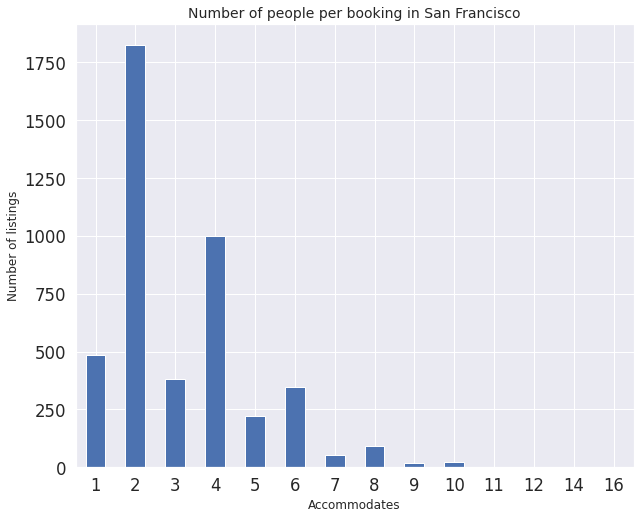

In [719]:
feq = listing_data_95['accommodates'].value_counts().sort_index()
feq.plot.bar(figsize=(10,8), width=0.5, rot=0)
plt.title('Number of people per booking in San Francisco', fontsize=14)
plt.ylabel('Number of listings', fontsize=12)
plt.xlabel('Accommodates', fontsize=12)
plt.show()

About 50% of bookings are under 2 guests per apartment, this could mean, it’s a single room apartment or a hotel. But if you want to party, it’s good to know there are options as well, which accommodate more than 10 people as well.

In [720]:
# Show the Room_type distribution

fig = px.histogram(listing_data_95, x='price', title= 'Price and Room_type Distributions', nbins=40, color='room_type', width=1000, height=400)
fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))
fig.update_layout(
    yaxis_title="Count",
    font=dict( family="Courier New, monospace", size=18))#, color="black")) # or color="RebeccaPurple"

fig.show()

In [721]:
# Bedrooms in Neighborhood distribution

fig = px.histogram(listing_data_95, x="neighbourhood_cleansed", title="Neighborhood and #Bedrooms Distributions" ,  nbins=40, color='bedrooms', width=1000, height=500).update_xaxes(categoryorder="total descending")

fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))
fig.update_layout(
    yaxis_title="Count",
    font=dict( family="Courier New, monospace", size=18))#, color="black")) # or color="RebeccaPurple"

# plt.xlabel("Neighborhood", size=20);
# plt.ylabel("Count", size=20);
fig.show();

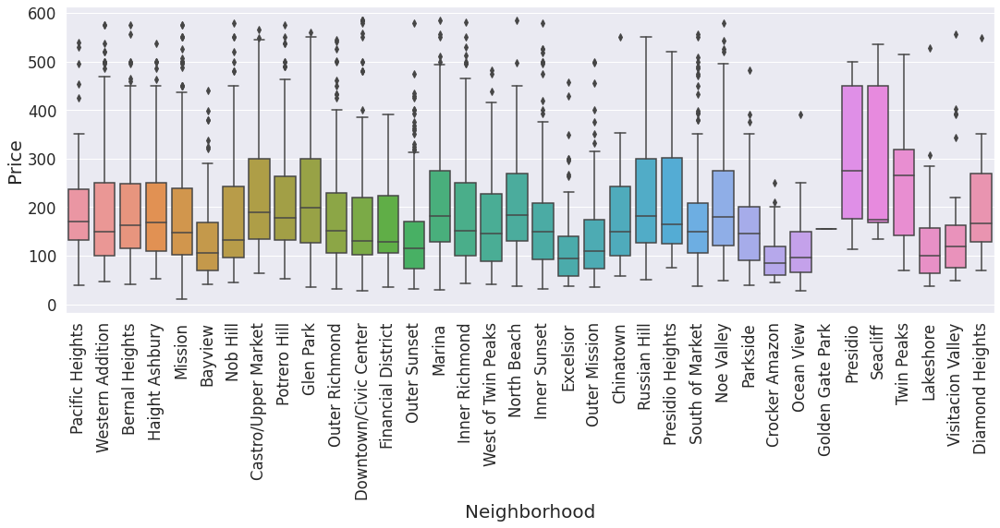

In [722]:
plt.figure(figsize=(18, 6))
chart2 = sns.boxplot(x = listing_data_95["neighbourhood_cleansed"], y = listing_data_95["price"])#, palette="Blues");
chart2.set_xticklabels(chart2.get_xticklabels(), rotation=90);
plt.xlabel("Neighborhood", size=20)
plt.ylabel("Price", size=20)
plt.show();

In [723]:
# Prices distribution across Neighborhood
fig = px.box(listing_data_95, x="neighbourhood_cleansed", y="price", title = 'Price Distribution Across Neighborhood')
fig.show()

In [724]:
# Number of people can be accommodated and price
fig = px.box(listing_data_95, x="accommodates", y="price", title = 'Price Distributions over #Accommodated Guests')

fig.show()

In [725]:
# Same graph with scatter plot

fig = px.scatter(listing_data_95, x="accommodates", y="price", width=1000, height=400)
fig.show()

!!The above figure shows that the Price is increasing as number of Accommodates is increasing.

In [726]:
# Accommodates distribution

fig = px.histogram(listing_data_95, x="accommodates",  title="#Beds in 'Accommodates' Distribution" ,  nbins=40, color='beds', width=1000, height=500) #.update_xaxes(categoryorder="total descending")

fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))

fig.show();

In [727]:
# Property-Type and Price

fig = px.box(listing_data_95, x="property_type", y="price", title = 'Price Distribution over Property types', width=1000, height=1000)

fig.show()

In [728]:
# Property-Type and Price

fig = px.scatter(listing_data_95, x="property_type", y="price", title = 'Price Distribution over Property types', width=1000, height=1000)

fig.show()

In [729]:
# Number Bedrooms and price

fig = px.box(listing_data_95, x="bedrooms", title = 'Price distributions for each #Bedrooms', y="price",width=1000, height=400)

fig.show()

In [730]:
# Number Bedrooms and price

fig = px.scatter(listing_data_95, x="bedrooms", title = 'Price distributions for each #Bedrooms', y="price",width=1000, height=400)

fig.show()

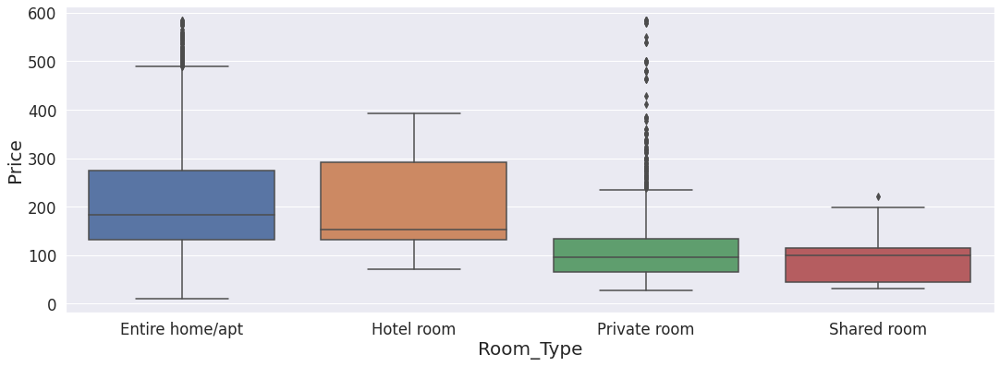

In [731]:
# Room type and Price


plt.figure(figsize=(18, 6))
chart2 = sns.boxplot(x = listing_data_95["room_type"], y = listing_data_95["price"])#, palette="Blues");
chart2.set_xticklabels(chart2.get_xticklabels(), rotation=0);
plt.xlabel("Room_Type", size=20)
plt.ylabel("Price", size=20)
plt.show()

In [732]:
# Mapping based on latitude and longitude

fig = px.scatter_mapbox(listing_data_95,  title = "San Francisco Map", lat="latitude", lon="longitude", color=listing_data_95['neighbourhood_cleansed'],  width=1000, height=700, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

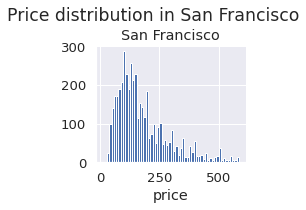

In [733]:
sns.set(font_scale=1.2)
#reference: https://stackoverflow.com/questions/29813694/how-to-add-a-title-to-seaborn-facet-plot
#Creating a Facet grid plot to compare price distibution across varios locations of California
g = sns.FacetGrid(data=listing_data_95,col="neighbourhood_group_cleansed",margin_titles=True)
g = g.map(plt.hist, "price",bins=60)

g.set_titles(col_template = '{col_name}')
plt.subplots_adjust(top=0.8)
g.fig.suptitle('Price distribution in San Francisco') 

plt.show()

In [734]:
print("The mean price in San Francisco: ")
listing_data_95.groupby("neighbourhood_group_cleansed")["price"].mean()

The mean price in San Francisco: 


neighbourhood_group_cleansed
San Francisco    180.112208
Name: price, dtype: float64

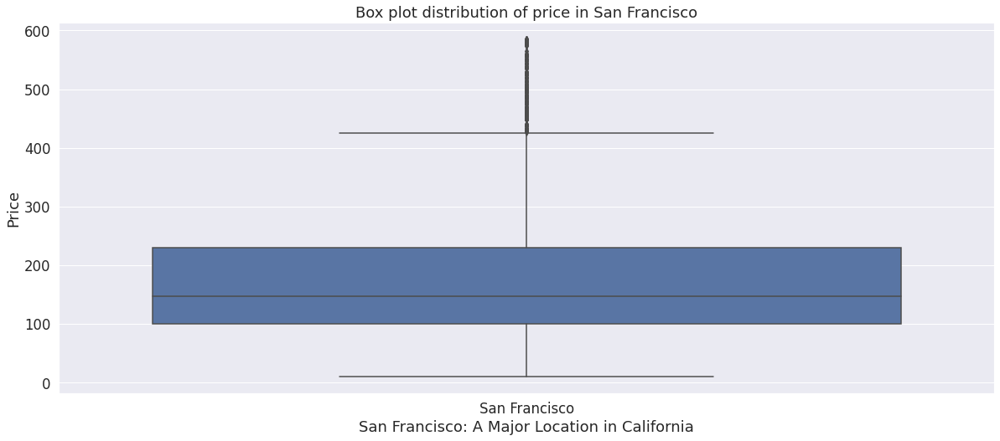

In [735]:
sns.set(font_scale=1.5)

sns.boxplot(data=listing_data_95, x= "neighbourhood_group_cleansed",y="price")
plt.title("Box plot distribution of price in San Francisco")
plt.xlabel("San Francisco: A Major Location in California")
plt.ylabel("Price")
plt.show()

In [736]:
#calculate interquartile range 
q3, q1 = np.percentile(listing_data_95['price'], [75 ,25])
iqr = q3 - q1

In [737]:
q3, q1

(230.0, 100.0)

In [738]:
iqr

130.0

**Conclusions about price distribution**

San Francisco has prices on higher side. San Francisco interquantile range is over $130 price range.

**Analysing the lisitngs percentage based on each location**

In [739]:
listings_count = pd.DataFrame(listing_data_95["neighbourhood_group_cleansed"].value_counts())
#Calculating the percentage of listings in San Francisco
listings_count["percentage"] = round((listings_count["neighbourhood_group_cleansed"]/listings_count["neighbourhood_group_cleansed"].sum())*100,2)
listings_count

,neighbourhood_group_cleansed,percentage
San Francisco,4456,100.0


**Conclusions aboout listings count**

Based on above statistics, one can conclude that San Francisco has 100% of the total listings in California.

Hence, we can infer that AirBnB customers have more options in San Francisco and possibility of finding an accommodation is high in SF than other regions in California
during busy seasons.

**Analysing the top neighbourhoods in San Francisco with maximum listings**

In [740]:
print("Top neighbourhoods in SF with maximum listings in decreasing order:")
print(" \n".join(listing_data_95[listing_data_95["neighbourhood_group_cleansed"]=="San Francisco"]["neighbourhood_cleansed"].value_counts().head(10).index))

Top neighbourhoods in SF with maximum listings in decreasing order:
Mission 
Western Addition 
South of Market 
Downtown/Civic Center 
Outer Sunset 
Bernal Heights 
Castro/Upper Market 
Haight Ashbury 
Noe Valley 
Nob Hill


**Analysing the price distribution of top 10 neighbourhoods in SF with maximum listings**

In [741]:
import seaborn as sns
import matplotlib.pyplot as plt

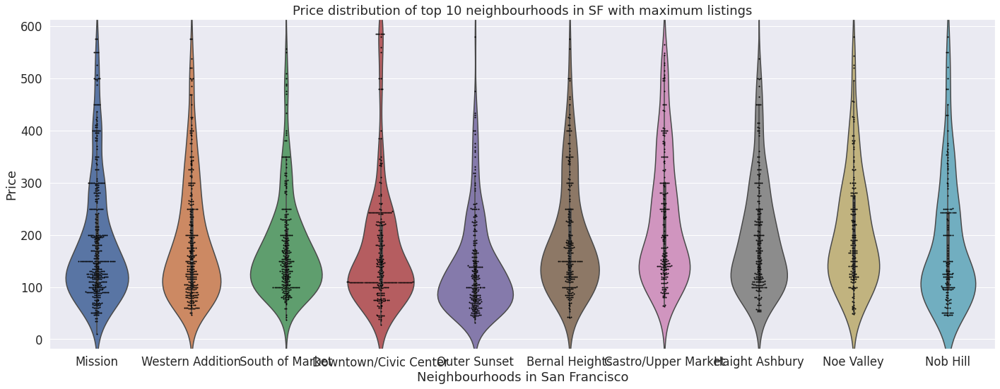

In [742]:
#Price distribution within the above listings

sns.violinplot(data=listing_data_95[listing_data_95["neighbourhood_cleansed"].isin(['Mission', 'Western Addition', 'South of Market', 
         'Downtown/Civic Center', 'Outer Sunset','Bernal Heights', 'Castro/Upper Market', 'Haight Ashbury', 'Noe Valley','Nob Hill'])], 
        x="neighbourhood_cleansed", y ="price", 
        order = ['Mission', 'Western Addition', 'South of Market', 
         'Downtown/Civic Center', 'Outer Sunset','Bernal Heights', 'Castro/Upper Market', 'Haight Ashbury', 'Noe Valley','Nob Hill'])
sns.swarmplot(data=listing_data_95[listing_data_95["neighbourhood_cleansed"].isin(['Mission', 'Western Addition', 'South of Market', 
         'Downtown/Civic Center', 'Outer Sunset','Bernal Heights', 'Castro/Upper Market', 'Haight Ashbury', 'Noe Valley','Nob Hill'])], 
        x="neighbourhood_cleansed", y ="price", 
        order = ['Mission', 'Western Addition', 'South of Market', 
         'Downtown/Civic Center', 'Outer Sunset','Bernal Heights', 'Castro/Upper Market', 'Haight Ashbury', 'Noe Valley','Nob Hill'],size=2,color="black")
plt.title("Price distribution of top 10 neighbourhoods in SF with maximum listings")
plt.xlabel("Neighbourhoods in San Francisco")
plt.ylabel("Price")
plt.tight_layout()
plt.show()

**Conclusions about the price distribution in top 10 neighbourhoods in SF with maximum listings**

1] Downtown/Civic Center, Mission, South of Market, Western addition and Outer Sunset are on higher listings side.

2] Bernal Heights, Castro/Upper Market, Haight Ashbury, Noe Valley and nob Hill are on lower listings side.

In [743]:
#Comparing the price range for top 2 maxmimum listings neighbourhoods in SF
print("Top 2 maxmimum listings neighbourhoods in SF:")

for i in listing_data_95["neighbourhood_group_cleansed"].unique():
    print("\n","==="+i+":")
    print("\t",listing_data_95[listing_data_95["neighbourhood_group_cleansed"]==i]["neighbourhood_cleansed"].value_counts().head(2).index[0])
    print("\t",listing_data_95[listing_data_95["neighbourhood_group_cleansed"]==i]["neighbourhood_cleansed"].value_counts().head(2).index[1])

Top 2 maxmimum listings neighbourhoods in SF:

 ===San Francisco:
	 Mission
	 Western Addition


**Analyzing the minimum nights data**

In [744]:
listing_data_95['minimum_nights'].unique()

array([ 30,   2,  32,   9,   1,   3,   5,   7,   4,  60,  31,  13,  45,
       183, 200,  90, 365,  15, 360, 364,  14, 113,   6,  28,  29,  10,
       180,  70,  20,  62, 120,  12, 179,  35,  75,  21,  55, 150,  93,  85])

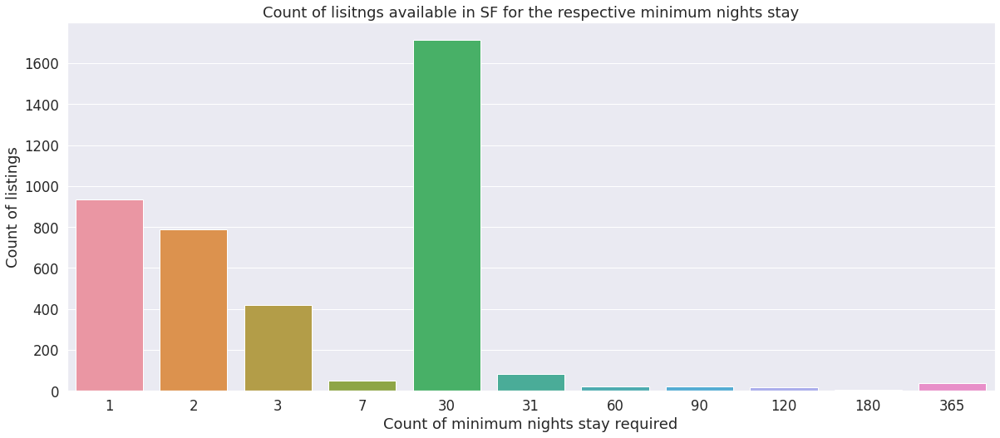

In [745]:
sns.countplot(x=listing_data_95[listing_data_95["minimum_nights"].isin([1,2,3,7,30,31,60,90,120,180,365])]["minimum_nights"])
plt.title("Count of lisitngs available in SF for the respective minimum nights stay")
plt.xlabel("Count of minimum nights stay required")
plt.ylabel("Count of listings")
plt.show()

**Conclusions about the minimum nights**

1] Most of the listings require 1 and 2 night minimum stay.

2] Also, there are a good amount of listings (approx. 1650) for a month time minimum stay in SF.

**Analyzing the minimum nights distribution in SF**

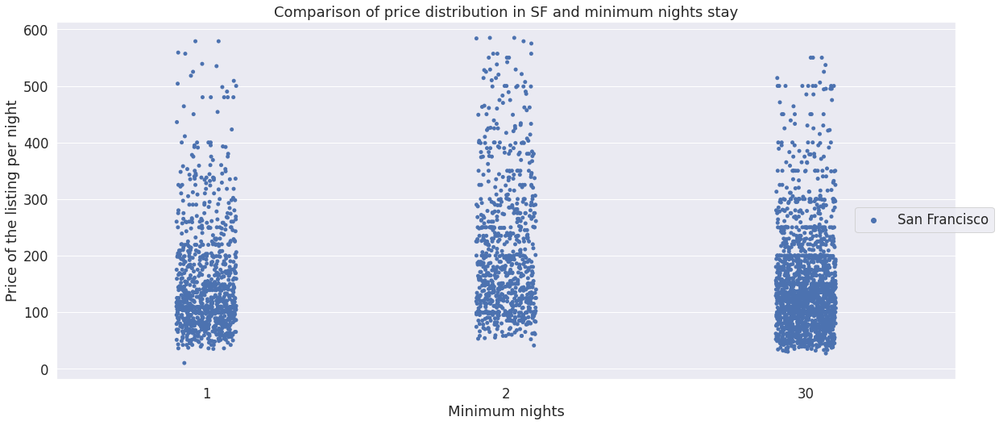

In [746]:
#Analysing the minimum nights
sns.stripplot(data=listing_data_95[(listing_data_95["minimum_nights"].isin([1,2,30]))],x="minimum_nights",y="price", hue = "neighbourhood_group_cleansed",jitter=True,dodge=True)
plt.legend(bbox_to_anchor=(1.05,0.5))
plt.title("Comparison of price distribution in SF and minimum nights stay")
plt.xlabel("Minimum nights")
plt.ylabel("Price of the listing per night")
plt.show()

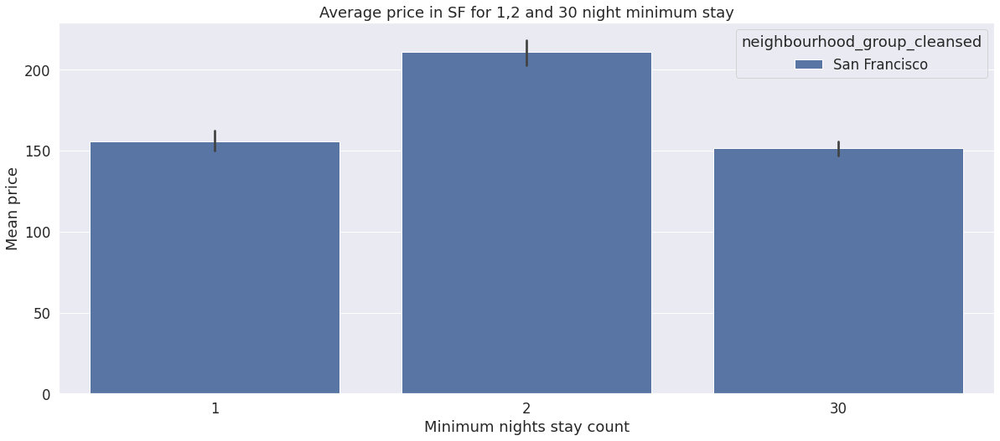

In [747]:
sns.barplot(data=listing_data_95[(listing_data_95["minimum_nights"].isin([1,2,30]))],x="minimum_nights",y="price", hue = "neighbourhood_group_cleansed")
plt.title("Average price in SF for 1,2 and 30 night minimum stay")
plt.xlabel("Minimum nights stay count")
plt.ylabel("Mean price")
plt.show()

**Conclusions about minimum nights stay in San Francisco**

1] For both 1, 2 nights: There are lot of listings in San Francisco.

2] Whereas for a long term say 30 days, SanFrancisco doesn't seem to provide too many options. San Francisco has a rule/law that guests can't stay for more than
2 weeks (14 days) in a 12 month duration. If someone exceeds this stay limit, they have to sign papers of lease / agreement. Maybe because of this rule hence.

3] Noticed there is not a significant amount of drop in price on comparing listings with 1 & 30 nights.

**Analyzing the room types count**

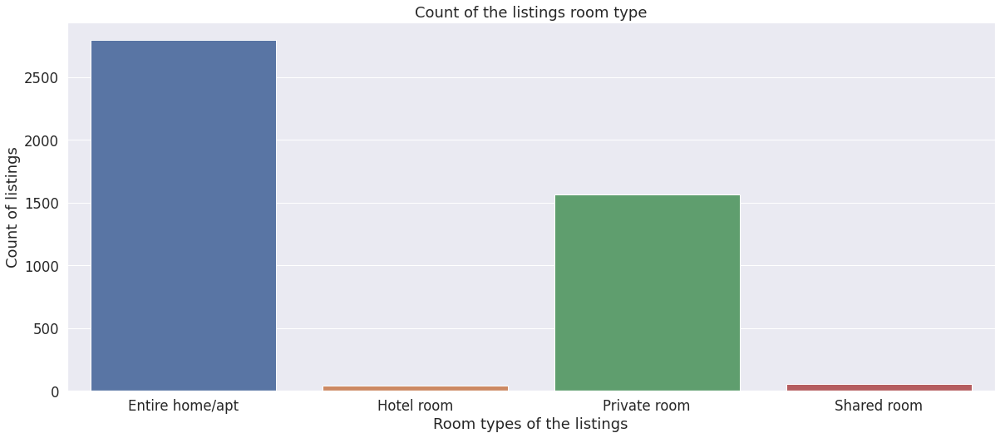

In [748]:
sns.countplot(x=listing_data_95["room_type"])
plt.title("Count of the listings room type")
plt.xlabel("Room types of the listings")
plt.ylabel("Count of listings")
plt.show()

One can notice that, majority of the listings are of Entire home and Private room type.

**Analyzing the listing count relation between minimum nights, location and type of property (room type)**

<Axes: title={'center': 'Count of lisitngs available in San Francisco and for each room type'}, xlabel='neighbourhood_group_cleansed,room_type'>

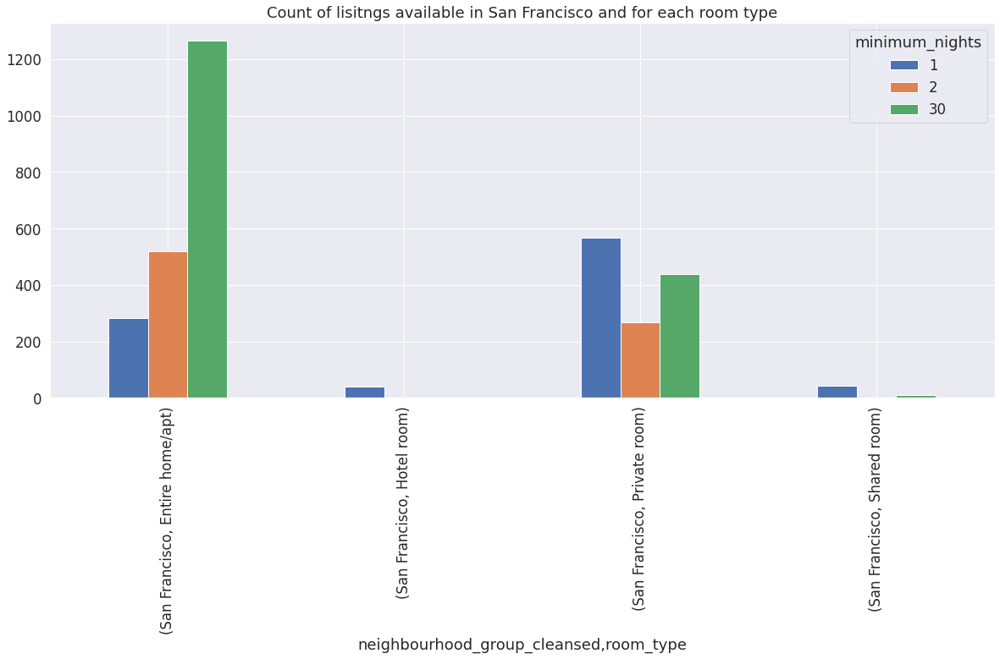

In [749]:
#Analysing the listing count relation between minimum nights, location and type of property (room type)
listing_data_95[listing_data_95["minimum_nights"].isin([1,2,30])].groupby(["neighbourhood_group_cleansed","room_type","minimum_nights"])["minimum_nights"].count().unstack().plot(kind="bar",title="Count of lisitngs available in San Francisco and for each room type")

**Conclusions**

**San Francisco:**

Entire home type is available for 30 or more days rather than 1 or 2 minimum stay days.

Private room is approximately equally available for 1,2 or 30 days minimum stay.

<Axes: title={'center': 'Mean price for each room type in San Francisco'}, xlabel='neighbourhood_group_cleansed,room_type'>

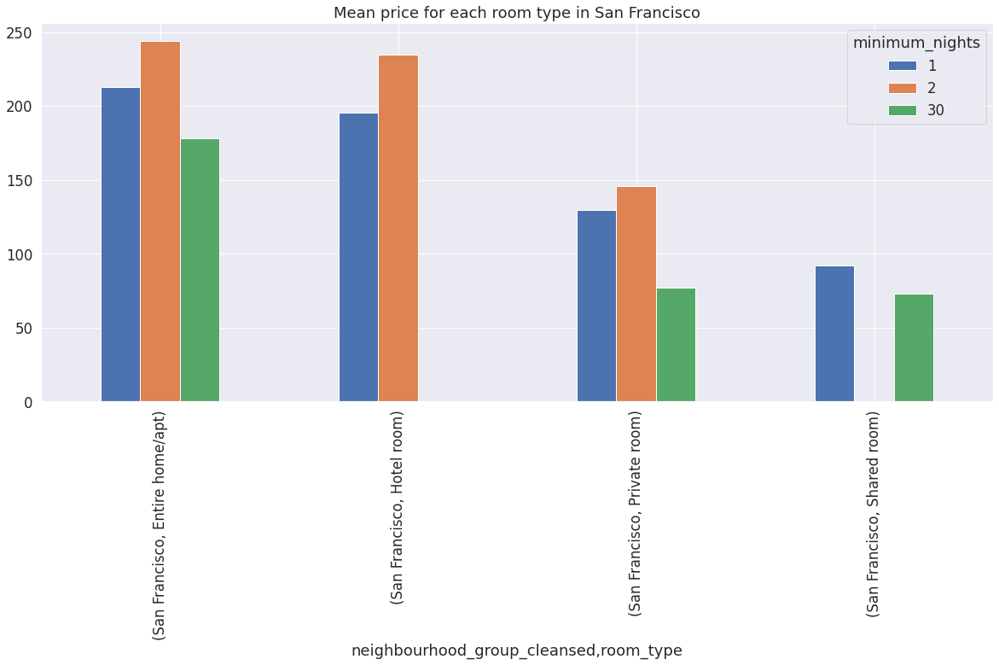

In [750]:
#Analysing the mean price in relation to minimum nights, location and type of property (room type)
listing_data_95[listing_data_95["minimum_nights"].isin([1,2,30])].groupby(["neighbourhood_group_cleansed","room_type","minimum_nights"])["price"].mean().unstack().plot(kind="bar",title="Mean price for each room type in San Francisco")

**Conclusions**

In San Francisco:

The average price dropped as the minimum stay count increases for entire home type and private room.

**Analyzing the hosts with maximum lisitngs**

In [751]:
#Analysing the hosts

listing_data_95["host_id"].value_counts().nlargest(10)

117141107    42
107434423    29
17042045     29
4430421      25
131200418    22
48005494     21
1257432      21
100238132    21
55782784     20
23719876     17
Name: host_id, dtype: int64

The top hosts of San Francisco have about 42, 29 and 29 listings

In [752]:
#Top host with most listings
print(listing_data_95[listing_data_95["host_id"]==117141107][["room_type","neighbourhood_group_cleansed"]].value_counts())
print("Mean price of the listing: ",listing_data_95[listing_data_95["host_id"]==117141107]["price"].mean())

room_type     neighbourhood_group_cleansed
Shared room   San Francisco                   25
Private room  San Francisco                   16
Hotel room    San Francisco                    1
dtype: int64
Mean price of the listing:  165.666666667


From the above data, we can conclude that the top host with maximum listings has a mean price of $165 and all their lisitngs are of either "Shared room/Private room/Hotel room" type.

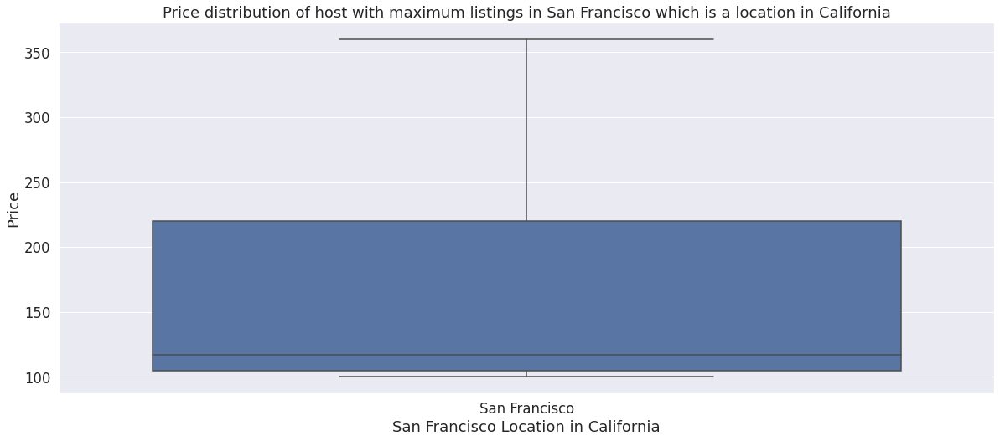

In [753]:
sns.boxplot(data = listing_data_95[listing_data_95["host_id"]==117141107],y="price",x="neighbourhood_group_cleansed")
plt.title("Price distribution of host with maximum listings in San Francisco which is a location in California")
plt.xlabel("San Francisco Location in California")
plt.ylabel("Price")
plt.show()

The host with maximum listings has his/her properties in San Francisco median price around $120-130

Entire home/apt    29
Hotel room          0
Private room        0
Shared room         0
Name: room_type, dtype: int64


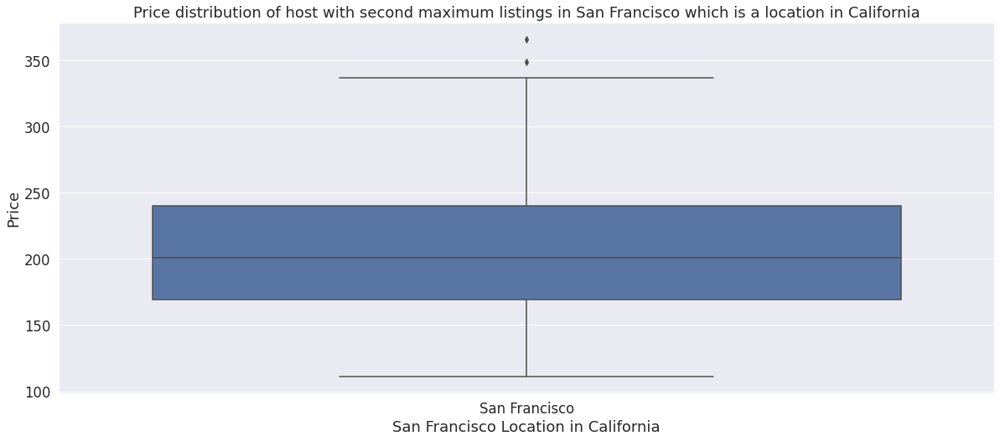

In [754]:
#Second top host
print(listing_data_95[listing_data_95["host_id"]==107434423]["room_type"].value_counts())
sns.boxplot(data = listing_data_95[listing_data_95["host_id"]==107434423],y="price",x="neighbourhood_group_cleansed")
plt.title("Price distribution of host with second maximum listings in San Francisco which is a location in California")
plt.xlabel("San Francisco Location in California")
plt.ylabel("Price")
plt.show()

The second host with maximum listings has his/her properties in San Francisco. San Francisco listings are on higher price range with median price around $200

**Analysing the reviews count**

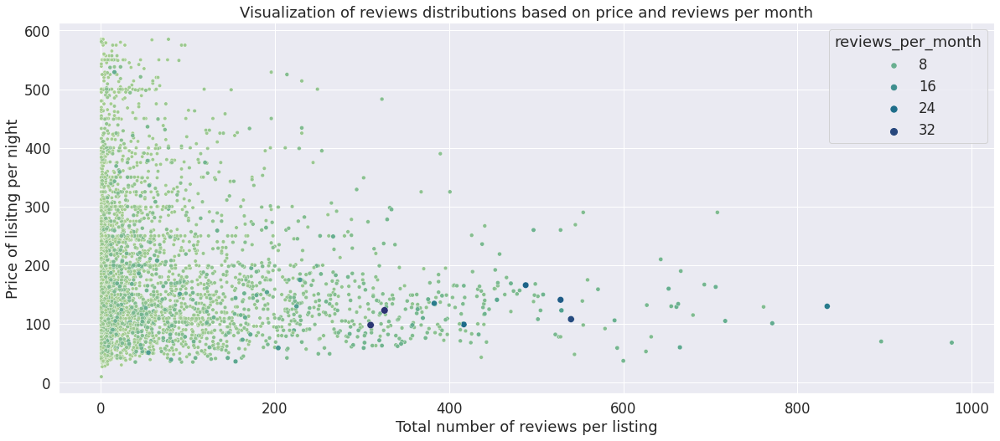

In [755]:
sns.scatterplot(data=listing_data_95, y ="price", x="number_of_reviews", hue= "reviews_per_month",size="reviews_per_month" ,palette="crest",alpha=1)
plt.title("Visualization of reviews distributions based on price and reviews per month")
plt.xlabel("Total number of reviews per listing")
plt.ylabel("Price of lisitng per night")
plt.show()

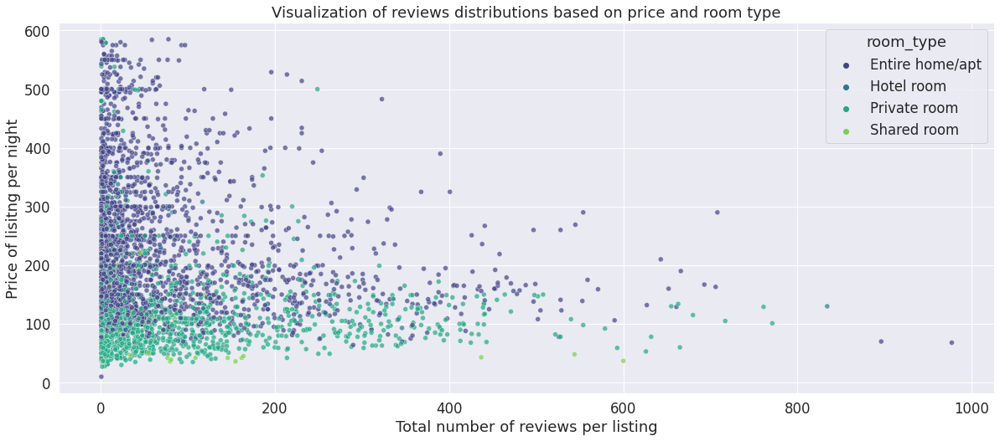

In [756]:
sns.scatterplot(data=listing_data_95,y ="price", x="number_of_reviews",  hue= "room_type" ,palette="viridis",alpha=0.7)
plt.title("Visualization of reviews distributions based on price and room type")
plt.xlabel("Total number of reviews per listing")
plt.ylabel("Price of lisitng per night")
plt.show()

**Conclusions**

1] Lower price listings have more number of reviews in comparison to higher price listings.

2] Also, noticed that the listings with maximum reviews per month, are the total reviews with price range of less than $200.

3] The listings with maximum reviews are of the type Entire home and Private room.

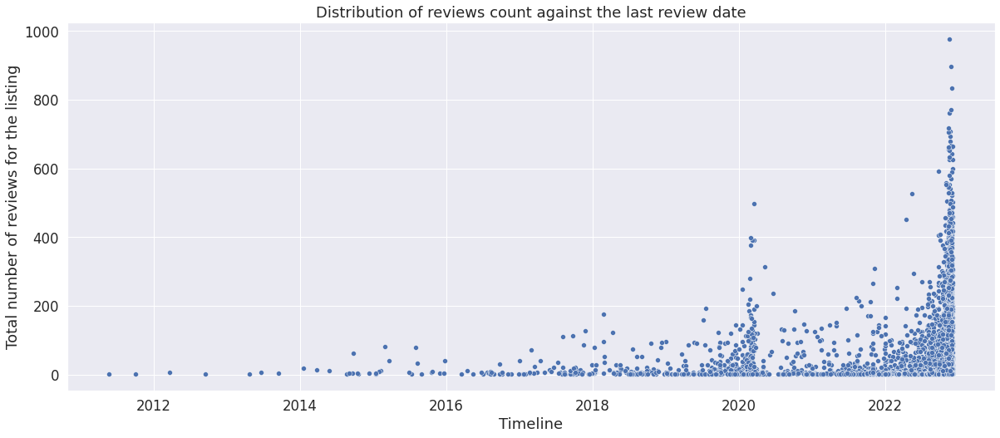

In [757]:
sns.scatterplot(x=listing_data_95["last_review"],y=listing_data_95["number_of_reviews"])
plt.title("Distribution of reviews count against the last review date")
plt.xlabel("Timeline")
plt.ylabel("Total number of reviews for the listing")
plt.show()

One can conclude that the most reviewed listings are the ones with latest reviews.

There is one listing which is last reviewed in late 2020 but has nearly 450 odd reviews.

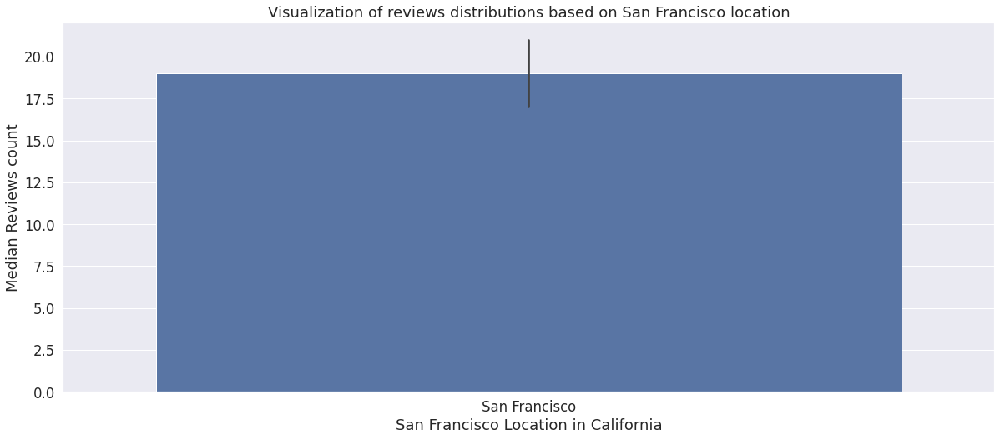

In [758]:
sns.barplot(data=listing_data_95, x= "neighbourhood_group_cleansed", y="number_of_reviews",estimator=np.median)
plt.title("Visualization of reviews distributions based on San Francisco location")
plt.xlabel("San Francisco Location in California")
plt.ylabel("Median Reviews count")
plt.show()

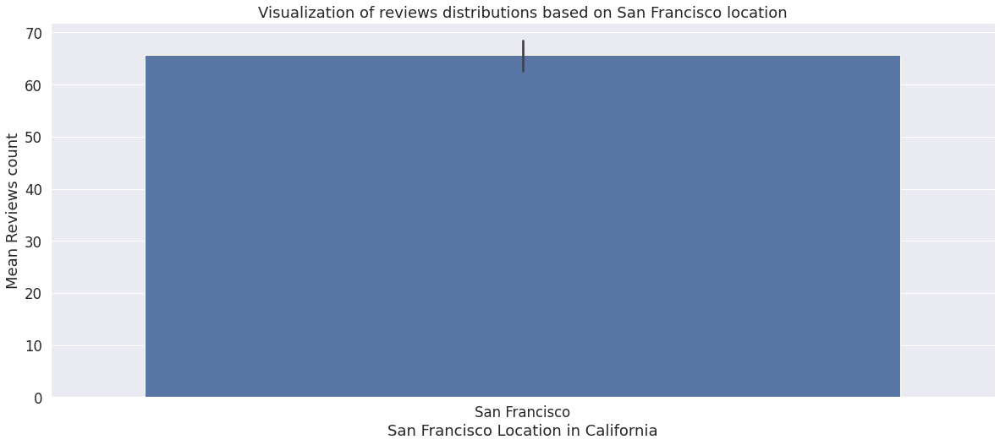

In [759]:
sns.barplot(data=listing_data_95, x= "neighbourhood_group_cleansed", y="number_of_reviews",estimator=np.mean)
plt.title("Visualization of reviews distributions based on San Francisco location")
plt.xlabel("San Francisco Location in California")
plt.ylabel("Mean Reviews count")
plt.show()

From the above two graphs, we can conclude that Mean reviews for San Francisco is approx 65.

However, on considering the median value, we see that San Francisco location has received 19 reviews.

**Analyzing the listings with maximum reviews**

In [760]:
listing_data_95[listing_data_95.id==545685]['number_of_reviews']

921    977
Name: number_of_reviews, dtype: int64

In [761]:
listing_data_95.columns

Index(['id', 'name', 'description', 'neighborhood_overview', 'host_id',
       'host_name', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_listings_count', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value',

In [762]:
print("Top 15 listings with number_of_reviews in decreasing order:")
listing_data_95[["id", "host_id", "host_name", "neighbourhood_cleansed", "number_of_reviews","reviews_per_month","room_type","price"]].sort_values("number_of_reviews",ascending=False).head(15)

Top 15 listings with number_of_reviews in decreasing order:


,id,host_id,host_name,neighbourhood_cleansed,number_of_reviews,reviews_per_month,room_type,price
921,545685,2676602,Su,Outer Richmond,977,7.69,Entire home/apt,68.0
930,585326,2676602,Su,Outer Richmond,896,7.08,Entire home/apt,70.0
3223,35642179,265029065,Grant Plaza,Financial District,834,20.75,Hotel room,130.0
6628,8356380,44046204,Cheryl,Crocker Amazon,771,9.06,Private room,101.0
5,8739,7149,Ivan & Wendy,Mission,761,4.68,Private room,129.0
6678,9051149,47224934,Elmer,Western Addition,717,8.30,Private room,105.0
23,33578,145258,Kepa,Potrero Hill,708,4.76,Entire home/apt,290.0
700,6092596,31603026,Marc,Castro/Upper Market,706,7.80,Entire home/apt,163.0
277,1738415,3273603,Donna,Western Addition,693,6.22,Entire home/apt,167.0
64,114401,580606,George,Castro/Upper Market,680,4.85,Private room,115.0


In [763]:
print("Top 15 listings with maximum reviews per month in decreasing order:")
listing_data_95[["id","host_id","host_name","neighbourhood_cleansed","number_of_reviews","reviews_per_month","room_type","price"]].sort_values(by="reviews_per_month",ascending=False).head(15)

Top 15 listings with maximum reviews per month in decreasing order:


,id,host_id,host_name,neighbourhood_cleansed,number_of_reviews,reviews_per_month,room_type,price
5496,569417447378815260,444900066,Greg,Chinatown,326,36.49,Private room,123.0
5461,561489475078914207,444900066,Greg,Chinatown,310,35.36,Private room,98.0
4831,50488642,407298390,San Francisco,Marina,540,31.46,Private room,108.0
4700,49634091,399069771,Marina Motel,Marina,528,27.89,Entire home/apt,141.0
4701,49634141,399069771,Marina Motel,Marina,488,26.14,Entire home/apt,166.0
4873,50875485,407298390,San Francisco,Marina,417,24.39,Private room,99.0
3223,35642179,265029065,Grant Plaza,Financial District,834,20.75,Hotel room,130.0
4703,49634228,399069771,Marina Motel,Marina,383,20.41,Entire home/apt,135.0
1717,19029310,6683937,Amit,South of Market,204,14.54,Private room,59.0
6006,674632552349199208,26860,Elvina,Marina,55,12.79,Shared room,51.0


**Conclusions**

1] Noticed that the listings with the highest reviews are not the same listings having maximum reviews per month. This implies that the listings with maximum ratings is due to their existence for a longer period of time in AirBnB.

2] Noticed that majority of listings with maximum reviews as well as maximum reviews per month are of the Entire home type followed by Private rooms. This is expected as the majority of listings are of these two types.

3] Most of the highly reviewed listings seem to be present in San Francisco Location as we are looking only at San Francisco Location throughout our analytics right now.

**Analyzing the corelation between price, number of reviews and reviews per month**

In [764]:
listing_data_95[["price","number_of_reviews","reviews_per_month"]].corr()

,price,number_of_reviews,reviews_per_month
price,1.000000,-0.098757,-0.076827
number_of_reviews,-0.098757,1.000000,0.599143
reviews_per_month,-0.076827,0.599143,1.000000


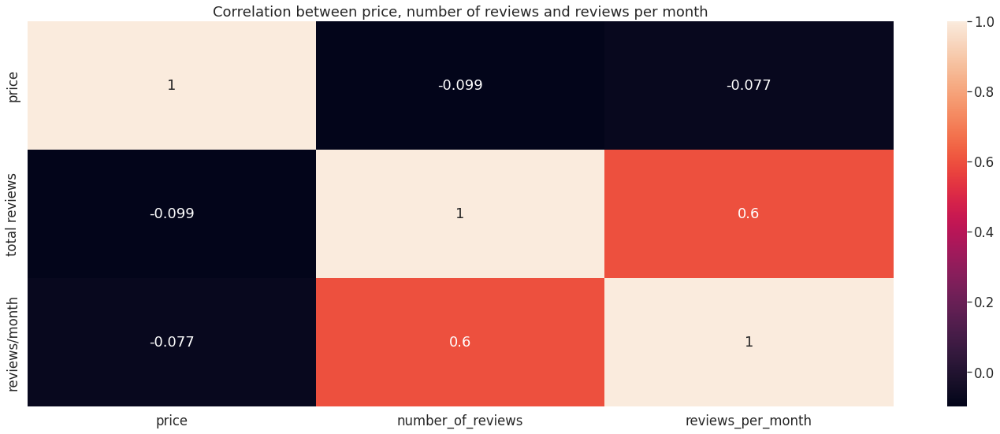

In [765]:
sns.heatmap(listing_data_95[["price","number_of_reviews","reviews_per_month"]].corr(),yticklabels=["price","total reviews", "reviews/month"],annot=True)
plt.title("Correlation between price, number of reviews and reviews per month")
plt.tight_layout()
plt.show()

**Conclusions**

1] As price increases, both number of reviews and reviews per month decreases.

2] As a listing has more reviews, its reviews per month also increases (as expected).

**Analysing the availability_30, availability_60, availability_90, availability_365 pattern**

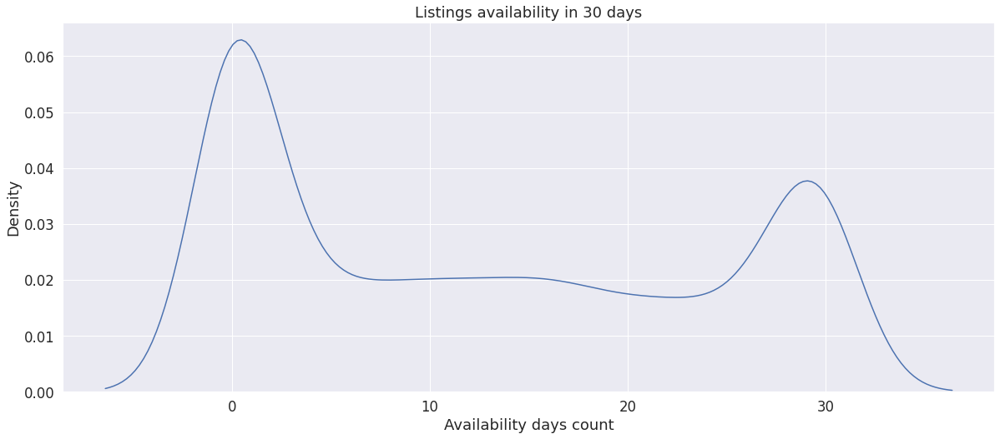

In [766]:
sns.kdeplot(listing_data_95["availability_30"])
plt.title("Listings availability in 30 days")
plt.xlabel("Availability days count")
plt.show()

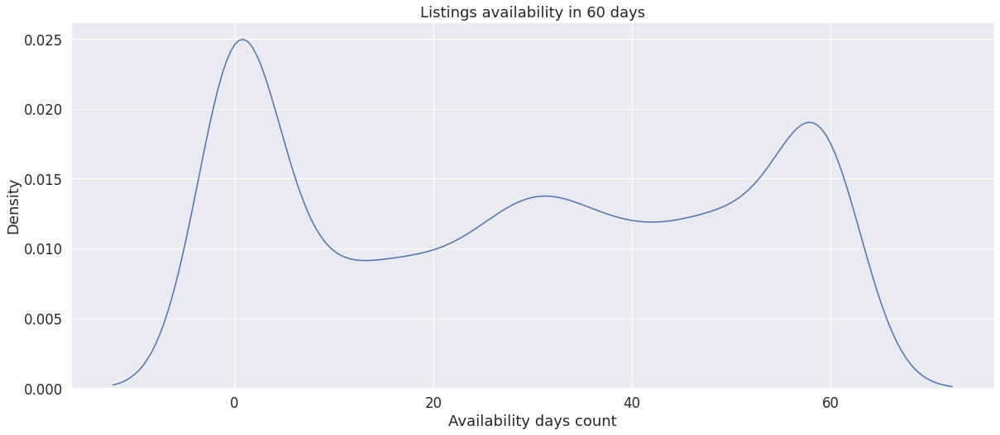

In [767]:
sns.kdeplot(listing_data_95["availability_60"])
plt.title("Listings availability in 60 days")
plt.xlabel("Availability days count")
plt.show()

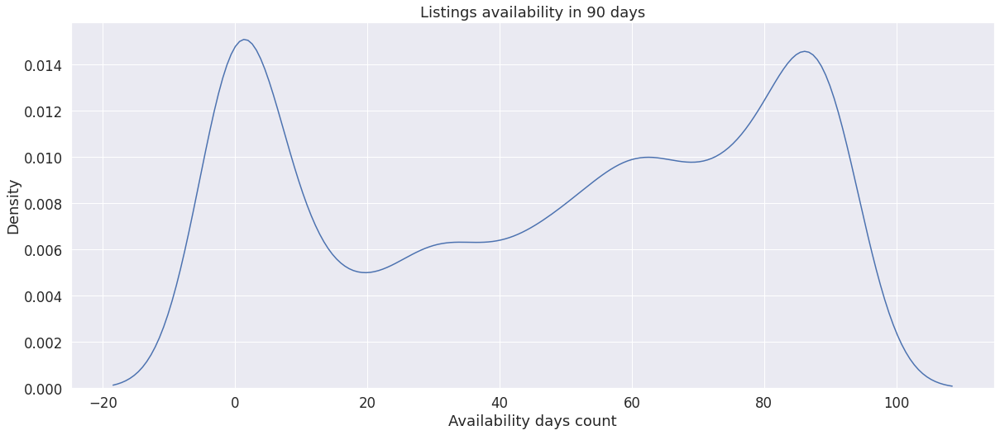

In [768]:
sns.kdeplot(listing_data_95["availability_90"])
plt.title("Listings availability in 90 days")
plt.xlabel("Availability days count")
plt.show()

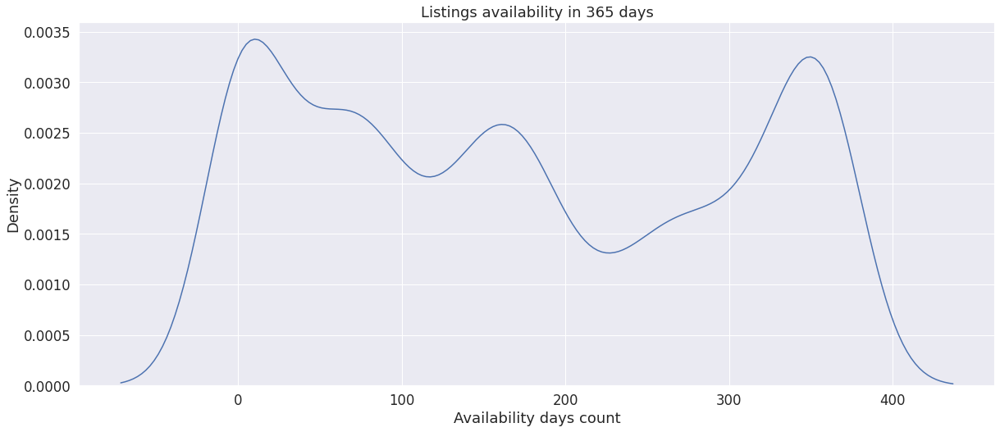

In [769]:
sns.kdeplot(listing_data_95["availability_365"])
plt.title("Listings availability in 365 days")
plt.xlabel("Availability days count")
plt.show()

One can conclude that majority of the listings are available for short term stay (less than a week)

However, we see spikes in listings available for 3 months, 6 months and one year.

In [770]:
#as we saw earlier from unique values for neighbourhood there are way too many to concentrate on;
#therefore, let's grab just top 10 neighbourhoods that have the most listings in them

#finding out top 10 neighbourhoods
listing_data_95.neighbourhood_cleansed.value_counts().head(10)

Mission                  421
Western Addition         306
South of Market          291
Downtown/Civic Center    268
Outer Sunset             250
Bernal Heights           235
Castro/Upper Market      211
Haight Ashbury           207
Noe Valley               179
Nob Hill                 163
Name: neighbourhood_cleansed, dtype: int64

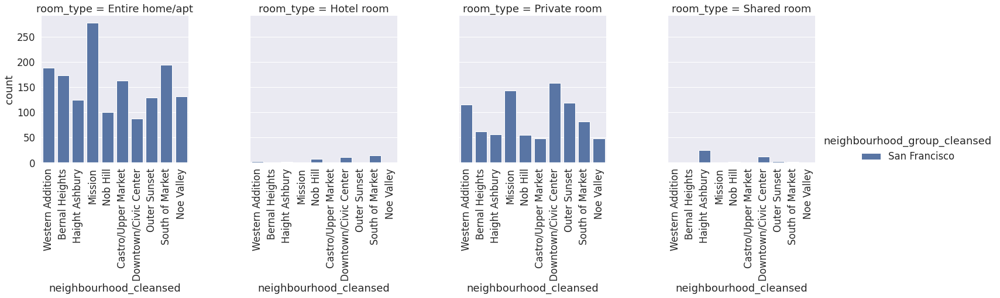

In [771]:
#let's now combine this with our boroughs and room type for a rich visualization we can make

#grabbing top 10 neighbourhoods for sub-dataframe
sub_7=listing_data_95.loc[listing_data_95['neighbourhood_cleansed'].isin(['Mission','Western Addition','South of Market','Downtown/Civic Center',
                 'Outer Sunset','Bernal Heights','Castro/Upper Market','Haight Ashbury','Noe Valley','Nob Hill'])]
#using catplot to represent multiple interesting attributes together and a count
viz_3=sns.catplot(x='neighbourhood_cleansed', hue='neighbourhood_group_cleansed', col='room_type', data=sub_7, kind='count')
viz_3.set_xticklabels(rotation=90)

Amazing, but let's breakdown on what we can see from this plot. First, we can see that our plot consists of 3 subplots - that is the power of using catplot; with such output, we can easily proceed with comparing distributions among interesting attributes. Y and X axes stay exactly the same for each subplot, Y-axis represents a count of observations and X-axis observations we want to count. However, there are 2 more important elements: column and hue; those 2 differentiate subplots. After we specify the column and determined hue we are able to observe and compare our Y and X axes among specified column as well as color-coded. So, what do we learn from this? The observation that is definitely contrasted the most is that 'Shared room' type Airbnb listing is barely available among 10 most listing-populated neighborhoods. Mission, Western Addition, Bernal Heights, South of Market & Castro/Upper Market have highest number of Entire home type room listing. Mission & Downtown/Civic Center have highest Private room type on their listings

In [772]:
pd.reset_option("all")

In [773]:
#last column we need to look at is 'number_of_reviews'

#let's grab 10 most reviewed listings in San Francisco
top_reviewed_listings=listing_data_95.nlargest(10,'number_of_reviews')[['host_id','host_name','id','price','room_type','number_of_reviews','reviews_per_month','neighbourhood_cleansed']]
top_reviewed_listings

,host_id,host_name,id,price,room_type,number_of_reviews,reviews_per_month,neighbourhood_cleansed
921,2676602,Su,545685,68.0,Entire home/apt,977,7.69,Outer Richmond
930,2676602,Su,585326,70.0,Entire home/apt,896,7.08,Outer Richmond
3223,265029065,Grant Plaza,35642179,130.0,Hotel room,834,20.75,Financial District
6628,44046204,Cheryl,8356380,101.0,Private room,771,9.06,Crocker Amazon
5,7149,Ivan & Wendy,8739,129.0,Private room,761,4.68,Mission
6678,47224934,Elmer,9051149,105.0,Private room,717,8.30,Western Addition
23,145258,Kepa,33578,290.0,Entire home/apt,708,4.76,Potrero Hill
700,31603026,Marc,6092596,163.0,Entire home/apt,706,7.80,Castro/Upper Market
277,3273603,Donna,1738415,167.0,Entire home/apt,693,6.22,Western Addition
64,580606,George,114401,115.0,Private room,680,4.85,Castro/Upper Market


In [774]:
price_avrg=top_reviewed_listings.price.mean()
print('Average price per night: {}'.format(price_avrg))

Average price per night: 133.8


There is no reason to visualize this as table format would be the most suitable output for better reading. From this table output, we can observe that top 10 most reviewed listings on Airbnb for San Francisco have price average of $133 "with most of the listings" over $100, and most of them are 'Private room/Entire home/apt' type; top reviewed listing has 977 reviews.

**Analyzing the words used in the listing name**

In [775]:
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [776]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
en_stops = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [777]:
#Analysing the listing name behavior

#removing the stop words based on nltk english stop words and also removing punctuation, digits
import string
def words(col, stopwords):
    list_of_words = []
    for x in range(len(col)):
        temp = str(col[x]).split()
        
        for y in temp:
            if (str(y) not in stopwords)and (str(y).lower() not in string.punctuation) and (str(y).lower() not in string.digits):
                list_of_words.append(str(y).lower())
    return list_of_words

list_words_listings = words(list(listing_data_95["name"]),en_stops)

In [778]:
len(list_words_listings)

25207

In [779]:
from collections import Counter

In [780]:
#Creating a data frame with the top 30 words in the listing name
popular_listing_name_words = pd.DataFrame(Counter(list_words_listings).most_common(30),columns=["words","count"])

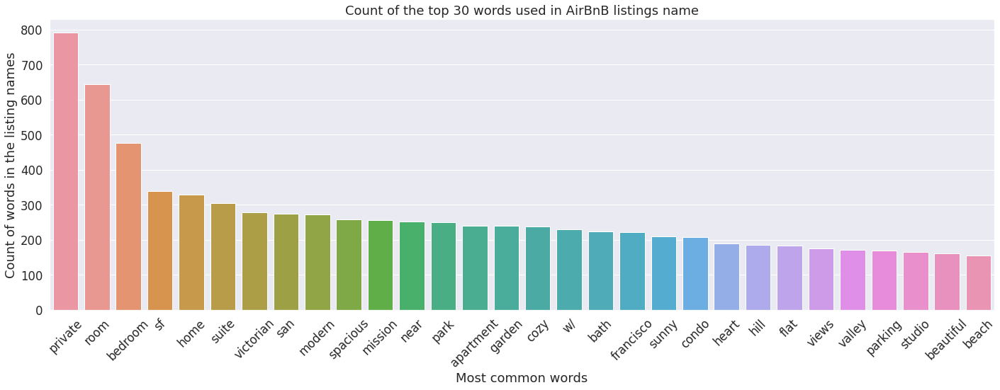

In [781]:
sns.barplot(data= popular_listing_name_words, x="words",y="count")
plt.xticks(rotation=45)
plt.title("Count of the top 30 words used in AirBnB listings name")
plt.xlabel("Most common words")
plt.ylabel("Count of words in the listing names")
plt.tight_layout()
plt.show()

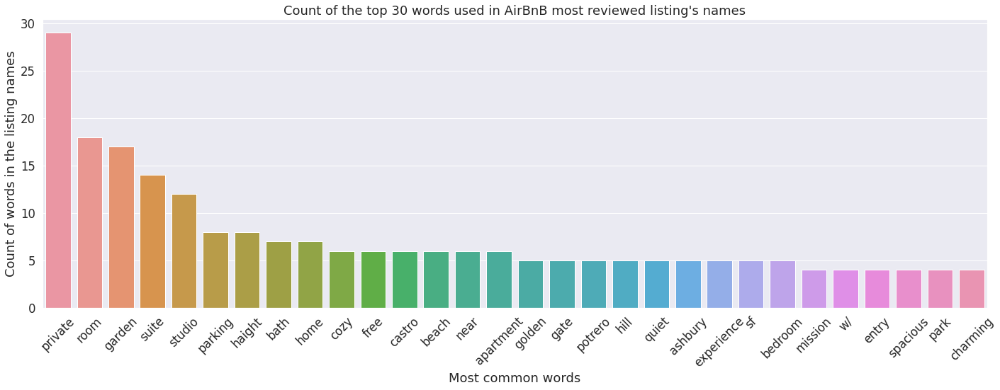

In [782]:
list_words_listings_with_max_reviews = words(list(listing_data_95.sort_values(by="number_of_reviews",ascending = False).head(100)["name"]),en_stops)
popular_listing_name_words = pd.DataFrame(Counter(list_words_listings_with_max_reviews).most_common(30),columns=["words","count"])
sns.barplot(data= popular_listing_name_words, x="words",y="count")
plt.xticks(rotation=45)
plt.title("Count of the top 30 words used in AirBnB most reviewed listing's names")
plt.xlabel("Most common words")
plt.ylabel("Count of words in the listing names")
plt.tight_layout()
plt.show()

Noticed that the most common word types that are common as well as that are most reviewed mainly contain terms like "private" as well as amenities and near by tourist highlights in their names.

**Visualizing the top 100 words used in listings name with word cloud**

In [783]:
! pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


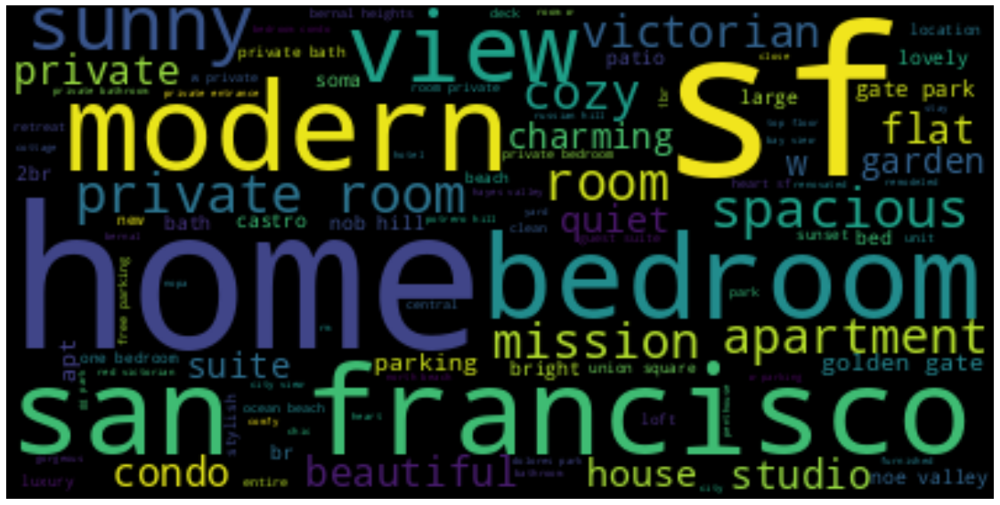

In [784]:
#Using word cloud to visualize the top 100 words used in listing names
from wordcloud import WordCloud, ImageColorGenerator
text = " ".join(str(wrd) for wrd in list_words_listings)
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=100).generate(text)
plt.figure(figsize=(20,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Noticed that the most common words used in listing names are "private", "cozy", "beautiful", "home", "room", "spacious", "studio", "view" etc.

**Summary of the project**
I used the various data cleaning, data summary and data visualization, geo spatial visualization techniques to analyze the AirBnB listings of San Francisco region and found the following summary:

1] Noticed that there are large number of listings in San Francisco.

2] Noticed that the price distribution is righ skewed with very few listings as costly as 25k per night.

3] The mean price of listings with room type as Entire home / apt or Private room seem to be higher than Hotel & Shared room in San Francisco per night and this price is around $25 'and' $16 which is greater than average price of $1 for Shared / Hotel room. So, we can conclude from our exploration that room type does affect price for the listings.

4] There are a lot of listings available for a minimum stay of 1, 2 days as well as 30 days. But, there are more listings for minimum stay options as 1/2 days compared to 30 days as law of SF is that, guests can't stay for a duration more than 2 weeks.

5] Also one can notice that, majority of the listings are of Entire home and Private room type.

6] Noticed that majority of lisitngs which are also highly reviewed listings are concentrated near the downtown and tourist regions of San Francisco. So, we can conclude that listing based on neighbourhood does affect price of the listing as well.

7] Noticed that the most common words used in listing names are "private", "cozy", "beautiful", "home", "room", "spacious", "studio", "view" etc.

In [785]:
listing_data_95.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4456 entries, 0 to 6788
Data columns (total 49 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id                            4456 non-null   int64         
 1   name                          4456 non-null   object        
 2   description                   4439 non-null   object        
 3   neighborhood_overview         3396 non-null   object        
 4   host_id                       4456 non-null   int64         
 5   host_name                     4456 non-null   object        
 6   host_response_time            4456 non-null   object        
 7   host_response_rate            4456 non-null   float64       
 8   host_acceptance_rate          4456 non-null   float64       
 9   host_is_superhost             4456 non-null   int64         
 10  host_neighbourhood            4208 non-null   object        
 11  host_listings_count           

In [786]:
listing_data_95.shape

(4456, 49)

In [787]:
listing_data_95.head()

,id,name,description,neighborhood_overview,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months
0,144978,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,216682,Jay,within a few hours,1.0,0.89,0,...,4.68,4.78,4.45,4.86,4.81,4.81,4.66,0,0.86,149.0
1,958,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,1169,Holly,within an hour,1.0,0.98,1,...,4.86,4.93,4.92,4.95,4.88,4.98,4.76,0,2.28,175.0
2,5858,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,8904,Philip And Tania,within a few hours,0.8,0.71,0,...,4.88,4.85,4.87,4.89,4.85,4.77,4.68,0,0.67,168.0
3,8142,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,"N Juda Muni, Bus and UCSF Shuttle.<br /><br />...",21994,Aaron,within a few hours,1.0,0.74,0,...,4.67,4.44,4.44,4.78,4.78,4.67,4.67,0,0.09,164.0
4,8339,Historic Alamo Square Victorian,Pls email before booking. <br />Interior featu...,NaN,24215,Rosy,within a few hours,1.0,0.00,0,...,4.87,4.88,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0


In [788]:
import seaborn as sns

In [789]:
listing_data_95.price.min()

10.0

In [790]:
listing_data_95.price.max()

585.0

**Do superhosts provide a better renting experience?**

What is the ratio of regular hosts vs superhosts? Do superhosts have higher rating in these aspects:

1. Overall: The overall experience.

2. Accuracy: How accurately did the listing page represent the space?

3. Cleanliness: Did guests feel that the space was clean and tidy?

4. Check-in: How smoothly did check-in go?

5. Communication: How well did you communicate before and during the stay? Guests often care that their host responds quickly, reliably, and frequently to their messages and questions.

6. Location: How did guests feel about the neighborhood? This may mean that there's an accurate description for proximity and access to transportation, shopping centers, city center, etc., and a description that includes special considerations, like noise, and family safety.

7. Value: Did the guest feel that the listing provided good value for the price?

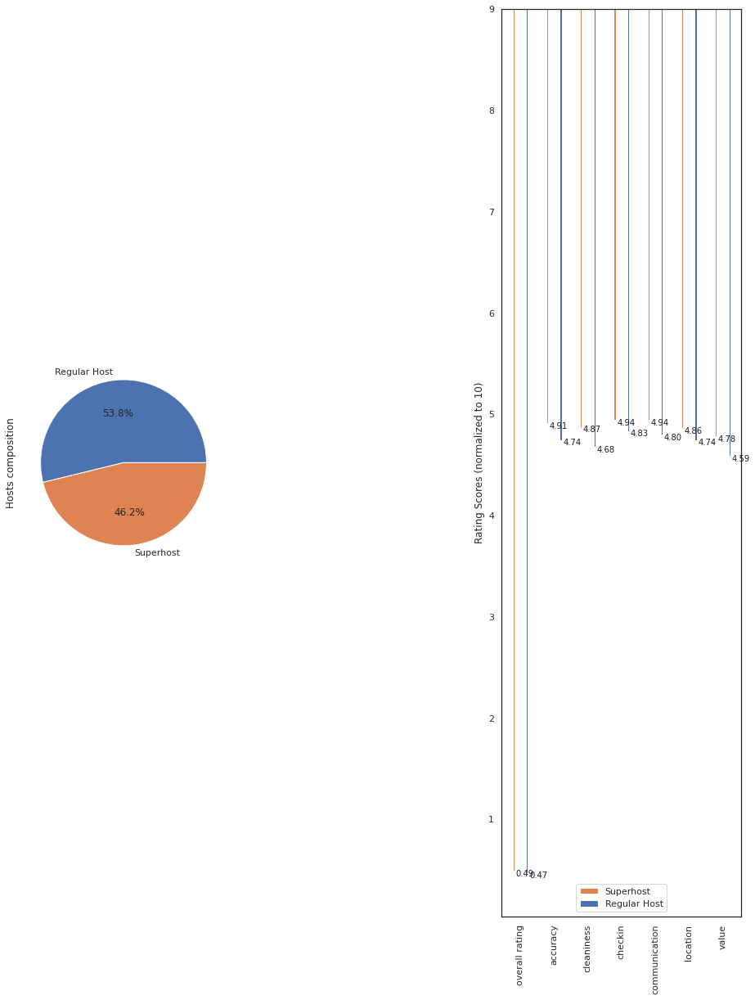

In [791]:
def display_superhost_rating_compare(df):
  ratings = ['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin',
            'review_scores_communication','review_scores_location','review_scores_value']
  super_ratings = listing_data_95[['host_is_superhost']+ratings].dropna().query('host_is_superhost == True').mean()[1:]
  super_ratings[0] /= 10
  reg_ratings = listing_data_95[['host_is_superhost']+ratings].dropna().query('host_is_superhost != True').mean()[1:]
  reg_ratings[0] /= 10

  sns.set(style = 'white')
  fig, ax = plt.subplots(1,2, figsize = (20,20),gridspec_kw={'width_ratios': [1,3]})
  df.host_is_superhost.value_counts().plot.pie(autopct = '%1.1f%%', ax = ax[0], labels = ['Regular Host','Superhost']);
  ax[0].set_ylabel('Hosts composition');
  ax[1].set_aspect(3)
  plt.bar(x = np.arange(len(ratings)) - 0.2, height = super_ratings - 9,
          width = 0.05, bottom = 9, color = sns.color_palette()[1], align='center')
  plt.bar(x = np.arange(len(ratings)) + 0.2, height = reg_ratings - 9,
          width = 0.05, bottom = 9, color = sns.color_palette()[0], align='center')
  plt.xticks(range(len(ratings)),['overall rating','accuracy','cleaniness','checkin','communication','location','value'],
             rotation = 'vertical')
  for p in ax[1].patches:
    percentage = '{:.2f}'.format(p.get_height() + 9)
    x = p.get_x()+0.09
    y = p.get_height() + 8.95
    ax[1].annotate(percentage, (x, y),color = 'k', size = 10)
  ax[1].legend(['Superhost','Regular Host'],loc = 'lower center')
  ax[1].set_ylabel('Rating Scores (normalized to 10)');

display_superhost_rating_compare(listing_data_95)

In average, superhosts have a 0.02 - 0.2 higher ratings in all aspects compared to regular hosts. In general, superhosts do provide better experience than regular hosts.

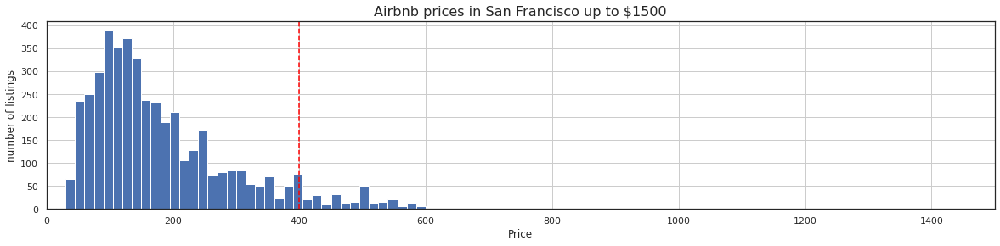

In [792]:
plt.figure(figsize=(20,4))
listing_data_95.price.hist(bins=100, range=(0,1500))
plt.margins(x=0)
plt.axvline(400, color='red', linestyle='--')
plt.xlabel('Price')
plt.ylabel('number of listings')
plt.title('Airbnb prices in San Francisco up to $1500', fontsize=16)
plt.show()

### Let's create a mapping of all the listings to visualize geographical clusters

In [793]:
# we only need latitude and longitude to determine the location
location = listing_data_95[['latitude', 'longitude']]

In [794]:
listing_data_95['room_type'].unique()

['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']
Categories (4, object): ['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']

### Red will represent Entire home / apartments
### Blue will represent private rooms
### Green will represent shared rooms
### Orange will represent hotel rooms

In [795]:
!pip install basemap-data-hires

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


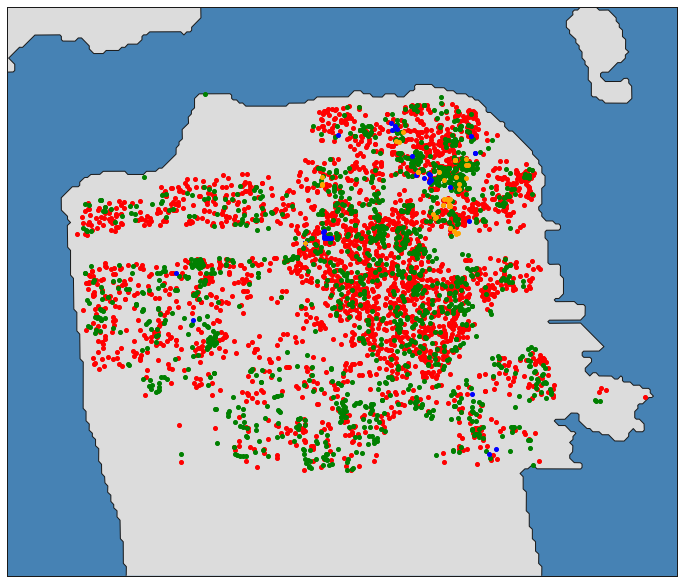

In [796]:
plt.figure(figsize=(12,12))

# the longitude and latitude limits of San Francisco
map_extent = [-122.53, 37.68, -122.35, 37.833]
themap = Basemap(llcrnrlon=map_extent[0], 
                 llcrnrlat=map_extent[1],
                 urcrnrlon=map_extent[2], 
                 urcrnrlat=map_extent[3],
                 projection='gall',
                 resolution='f', epsg=4269)

# creating outlines for the basemap
themap.drawcoastlines()
themap.drawcountries()
themap.fillcontinents(color = 'gainsboro')
themap.drawmapboundary(fill_color='steelblue')

# splitting each type of property
home = listing_data_95[(listing_data_95.room_type == 'Entire home/apt')]
private = listing_data_95[(listing_data_95.room_type == 'Private room')]
shared = listing_data_95[(listing_data_95.room_type == 'Shared room')]
hotel = listing_data_95[(listing_data_95.room_type == 'Hotel room')]

# then splitting them based on longitude and latitude
a, b = themap(home['longitude'], home['latitude'])
c, d = themap(private['longitude'], private['latitude'])
e, f = themap(shared['longitude'], shared['latitude'])
g, h = themap(hotel['longitude'], hotel['latitude'])

# plotting using different colors
themap.plot(a, b, 'o',                   
            color='Red',      
            markersize=4)
themap.plot(c, d, 'o',                   
            color='Green',       
            markersize=4)
themap.plot(e, f, 'o',                    
            color='Blue',         
            markersize=4)
themap.plot(g, h, 'o',                    
            color='Orange',         
            markersize=4)

### Let's count how many listings there are separated by neighborhoods

In [797]:
# using Counter to analyze frequency of each listing based on neighborhood
nh = Counter(listing_data_95['neighbourhood_cleansed'])

nh

Counter({'Pacific Heights': 84,
         'Western Addition': 306,
         'Bernal Heights': 235,
         'Haight Ashbury': 207,
         'Mission': 421,
         'Bayview': 134,
         'Nob Hill': 163,
         'Castro/Upper Market': 211,
         'Potrero Hill': 116,
         'Glen Park': 45,
         'Outer Richmond': 140,
         'Downtown/Civic Center': 268,
         'Financial District': 72,
         'Outer Sunset': 250,
         'Marina': 135,
         'Inner Richmond': 140,
         'West of Twin Peaks': 74,
         'North Beach': 90,
         'Inner Sunset': 106,
         'Excelsior': 141,
         'Outer Mission': 101,
         'Chinatown': 59,
         'Russian Hill': 88,
         'Presidio Heights': 22,
         'South of Market': 291,
         'Noe Valley': 179,
         'Parkside': 115,
         'Crocker Amazon': 34,
         'Ocean View': 77,
         'Golden Gate Park': 2,
         'Presidio': 6,
         'Seacliff': 5,
         'Twin Peaks': 32,
         'Lakeshor

###  Let's visualize the frequency of listings separated by neighborhood using a bar graph

<Axes: title={'center': 'SF Neighborhood Frequency'}>

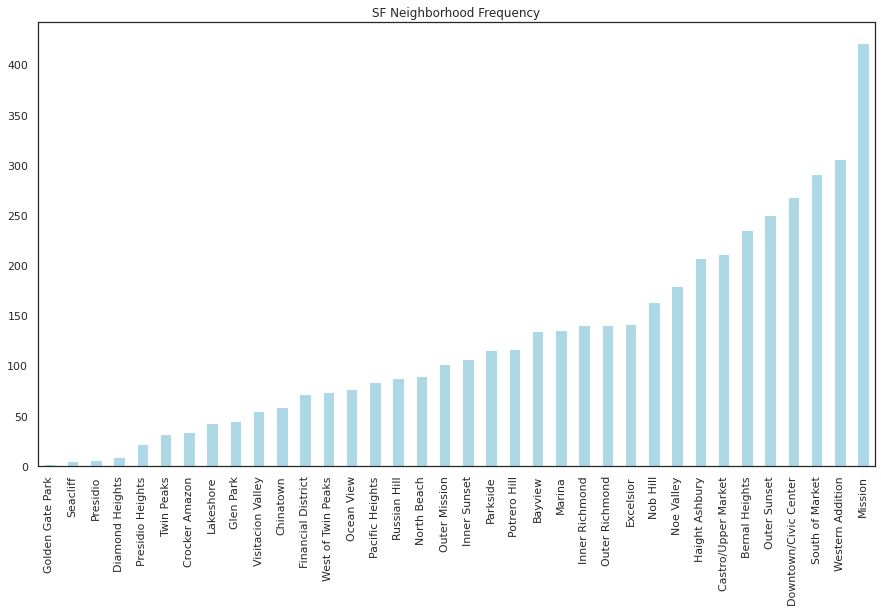

In [798]:
nh_df = pd.DataFrame.from_dict(nh, orient='index').sort_values(by=0)
nh_df.plot(kind='bar', 
           color = 'LightBlue', 
           figsize =(15,8), 
           title = 'SF Neighborhood Frequency', 
           legend = False)

It looks like Mission has the most listings, followed by Western Addition, South of Market, and Downtown/Civic Center. We will now analyze the average listing on SF, then further break it down for each neighborhood to understand the pricing breakdown.

### Let's see the average price of every listing available on SF

In [799]:
average_price = sum(listing_data_95.price) / float(len(listing_data_95.price))
average_price

180.11220825852783

### Let's see what the average prices are for each neighborhood

In [800]:
nh_df.rename(columns={0: 'number_of_listings'}, inplace=True)

In [801]:
nh_df.index.name = 'neighbourhood'

In [802]:
nh.items()

dict_items([('Pacific Heights', 84), ('Western Addition', 306), ('Bernal Heights', 235), ('Haight Ashbury', 207), ('Mission', 421), ('Bayview', 134), ('Nob Hill', 163), ('Castro/Upper Market', 211), ('Potrero Hill', 116), ('Glen Park', 45), ('Outer Richmond', 140), ('Downtown/Civic Center', 268), ('Financial District', 72), ('Outer Sunset', 250), ('Marina', 135), ('Inner Richmond', 140), ('West of Twin Peaks', 74), ('North Beach', 90), ('Inner Sunset', 106), ('Excelsior', 141), ('Outer Mission', 101), ('Chinatown', 59), ('Russian Hill', 88), ('Presidio Heights', 22), ('South of Market', 291), ('Noe Valley', 179), ('Parkside', 115), ('Crocker Amazon', 34), ('Ocean View', 77), ('Golden Gate Park', 2), ('Presidio', 6), ('Seacliff', 5), ('Twin Peaks', 32), ('Lakeshore', 43), ('Visitacion Valley', 55), ('Diamond Heights', 9)])

In [803]:
# # extracting the names
neighborhood_names = list(nh.keys())

# # 2 column table of neighborhood names and prices
nh_prices = listing_data_95[['neighbourhood_cleansed', 'price']]
nh_prices.columns = ['neighbourhood', 'price']

# # we pick out the rows which have neighborhood names with 400+ listings.
nh_prices = nh_prices[nh_prices['neighbourhood'].isin(neighborhood_names)]

# # group by neighbourhood and then aggreate the prices based on mean
nh_prices_group = nh_prices.groupby('neighbourhood')

# area1_df['avg_price'] = listing.groupby('neighbourhood_cleansed').price.mean().values
nh_prices = nh_prices_group['price'].agg(np.mean)
# nh_prices['avg_price'] = nh_prices_group.price.mean().values

# # turn dictionary's keys and values into a table for easy read
nh_prices = nh_prices.reset_index()

nh_prices['number of listings'] = nh_prices['neighbourhood'].map(nh)

In [804]:
# nh_prices.drop('price', axis=1, inplace=True)
nh_prices['avg_price'] = nh_prices_group['price'].mean().values
nh_prices = nh_prices.sort_values(by=['avg_price'], ascending=False)
nh_prices = nh_prices.sort_values(by=['number of listings'], ascending=False)
nh_prices.drop('price', axis=1, inplace=True)

In [805]:
nh_prices

,neighbourhood,number of listings,avg_price
16,Mission,421,183.524941
35,Western Addition,306,187.071895
31,South of Market,291,174.721649
6,Downtown/Civic Center,268,170.305970
23,Outer Sunset,250,139.652000
1,Bernal Heights,235,194.697872
2,Castro/Upper Market,211,227.194313
11,Haight Ashbury,207,195.623188
18,Noe Valley,179,205.318436
17,Nob Hill,163,181.871166


<Axes: title={'center': 'SF Neighborhood Frequency'}, xlabel='neighbourhood'>

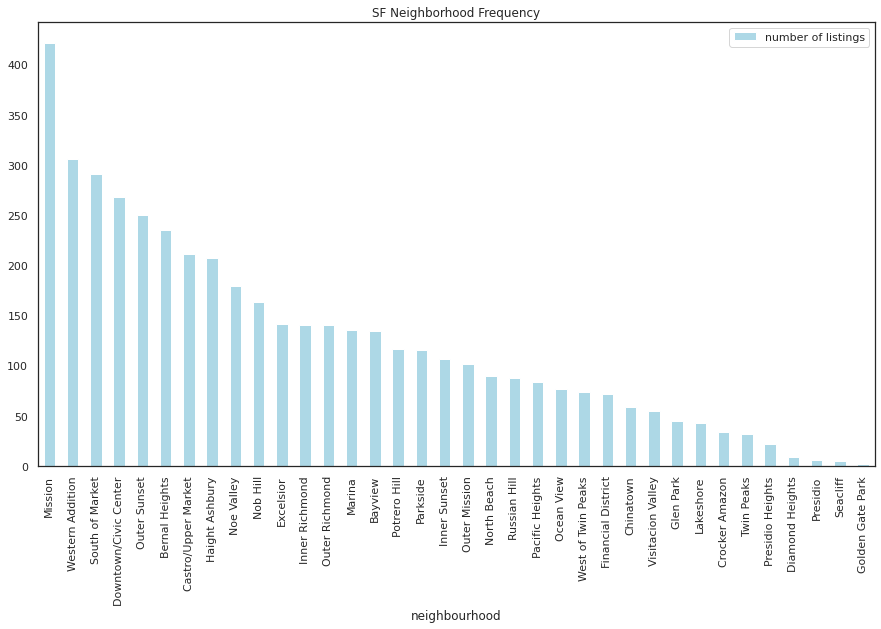

In [806]:
nh_prices.plot(
           x='neighbourhood',
           y='number of listings',
           kind='bar', 
           color = 'LightBlue', 
           figsize =(15,8), 
           title = 'SF Neighborhood Frequency', 
           legend = True)

### Let's graph each neighborhood based on prices

<Axes: title={'center': 'Average Price per Neighorhood'}, xlabel='neighbourhood'>

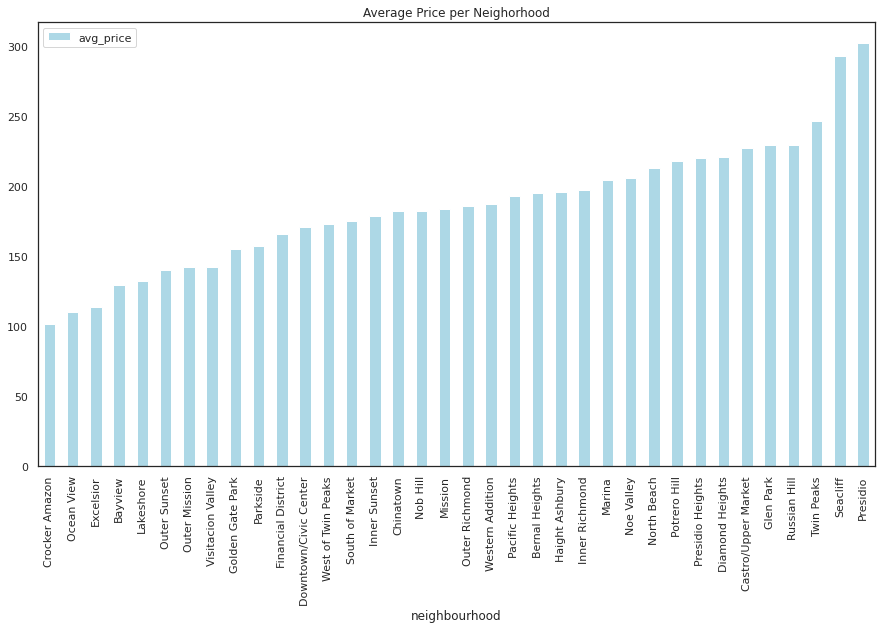

In [807]:
p = nh_prices.sort_values(by = 'avg_price')
p.plot(x = "neighbourhood",
       y = "avg_price",
       kind='bar', 
       color = 'LightBlue', 
       figsize =(15,8), 
       title = 'Average Price per Neighorhood', 
       legend = True)

By analyzing the number of listings and prices per neighborhood, we can get a clearer understanding of how accurate the average price is per neighborhood. The neighorhoods with a lot of listings (such as Mission or South of Market), we can expect a more accurate average prices. However, neighborhoods with less than 100 listings might have relatively inaccurate average prices due to presence of outliers.

Our work isn't done here just yet. Looking at the analysis we did so far, one might conclude that certain neighborhoods are more 'expensive' than others. However, we have more metadata we can explore: the property types and room types. We can analyze these 2 columns to see if differences in prices are caused based on neighborhood, or by other factors. 

First, let's dive into see the percentage breakdown of property and room types of listings.

<Axes: title={'center': 'Room Type Distribution'}, ylabel='room_type'>

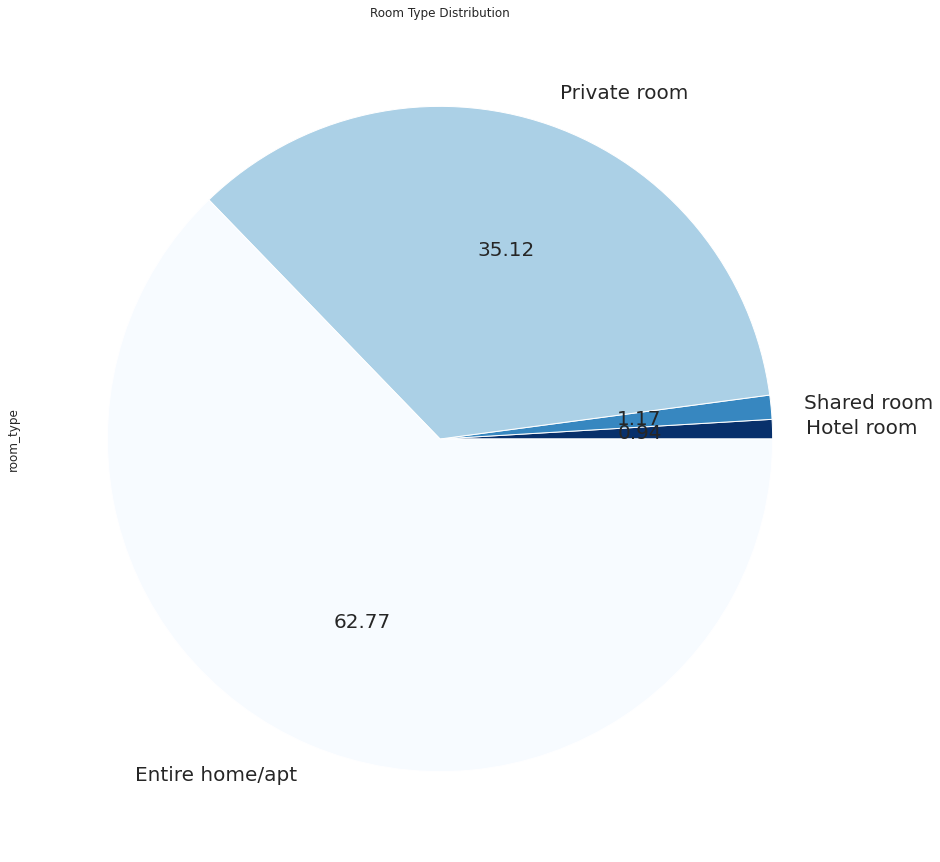

In [808]:
room = listing_data_95.room_type
r = Counter(room)

room_df = pd.DataFrame.from_dict(r, orient='index').sort_values(by=0)
room_df.columns = ['room_type']
room_df.plot.pie(y = 'room_type', 
                 colormap = 'Blues_r', 
                 figsize=(15,15), 
                 fontsize = 20, autopct = '%.2f',
                 legend = False,
                 title = 'Room Type Distribution')

<Axes: title={'center': 'Property type distribution'}>

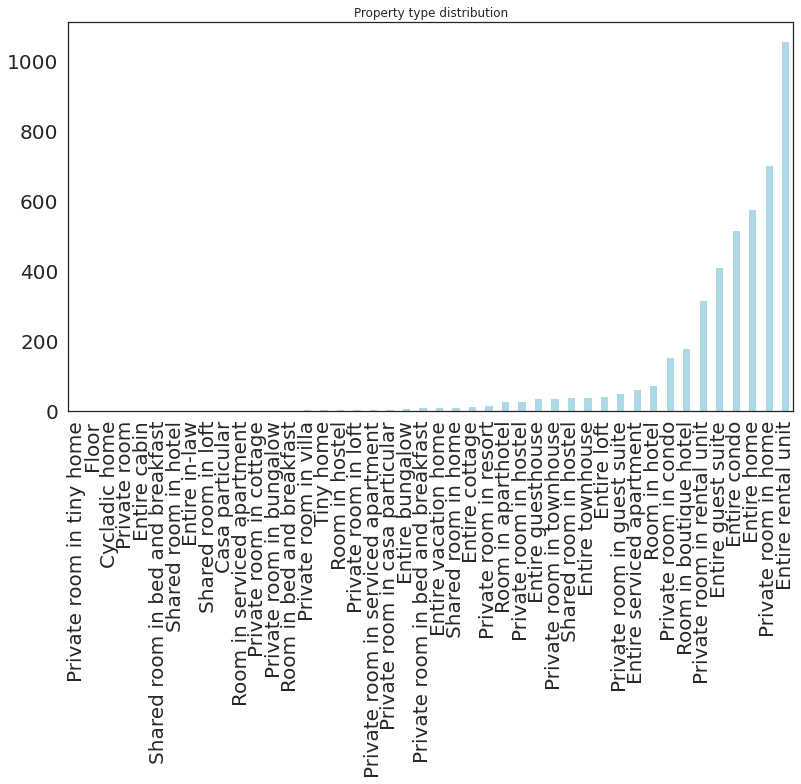

In [809]:
property = listing_data_95.property_type
p = Counter(property)

property_df = pd.DataFrame.from_dict(p, orient='index').sort_values(by=0)
property_df.columns = ['property_type']
property_df.plot.bar(y= 'property_type', 
                     color = 'LightBlue',
                     fontsize = 20,
                     legend = False,
                     figsize= (13, 7),
                     title = "Property type distribution")

It seems that people list their entire residency more than half the times, followed by private room. And not surprisingly, Entire rental unit and Private room in home take up an overwhelming majority of all listings, although we do see few instances unfamiliar residencies here and there. This tells us that we should keep our eye on the property and room types when predicting the prices of listings.

### Now let's break property and room type down by price.

In [810]:
prop_room = listing_data_95[['property_type', 'room_type', 'price']]

# first ten of the table
prop_room[0:10]

,property_type,room_type,price
0,Private room in rental unit,Private room,55.0
1,Entire serviced apartment,Entire home/apt,194.0
2,Entire rental unit,Entire home/apt,235.0
3,Private room in rental unit,Private room,56.0
4,Entire condo,Entire home/apt,575.0
5,Private room in condo,Private room,129.0
6,Private room,Private room,95.0
8,Entire condo,Entire home/apt,115.0
9,Private room in rental unit,Private room,65.0
10,Private room in rental unit,Private room,65.0


In [811]:
# Grouping by porperty and room type, and then aggregating them
# using mean of the price
prop_room_group = prop_room.groupby(['property_type', 'room_type']).mean()

# resetting the index in order to turn the lists into a readable table
p = prop_room_group.reset_index()

# pivoting the table based on the 3 factors, in order.
p = p.pivot('property_type', 'room_type', 'price')

# replacing the NaN values with 0
p.fillna(0.00, inplace=True)

p

room_type,Entire home/apt,Hotel room,Private room,Shared room
property_type,,,,
Casa particular,201.000000,0.000000,0.000000,0.000000
Cycladic home,143.000000,0.000000,0.000000,0.000000
Entire bungalow,245.166667,0.000000,0.000000,0.000000
Entire cabin,180.000000,0.000000,0.000000,0.000000
Entire condo,239.470930,0.000000,0.000000,0.000000
Entire cottage,211.500000,0.000000,0.000000,0.000000
Entire guest suite,165.595122,0.000000,0.000000,0.000000
Entire guesthouse,169.555556,0.000000,0.000000,0.000000
Entire home,278.418685,0.000000,0.000000,0.000000


This chart allows us to see all the listings' prices broken down by property type and room type. This gives us a much better understanding of the price breakdown in SF based on property and room types.

### Now that we've seen how property and room types along with neighborhood can affect the listing prices, let's investigate the summary.

In [812]:
# # gets rid of NaN values with pandas' notnull function
# summary = summary[pd.notnull(summary['name'])]
# summary
# ### Let's see what words come up the most when people describe their homes
# words = []

# # accessing each summary, then each word, and putting it into an empty list
# for detail in summary['name']:
#     if detail != 0:
#         for word in detail.split():
#             words.append(word)

# # turning the list into a counter (dictionary) for frequency, then into a pandas dataframe
# words = Counter(words)
# word_count = pd.DataFrame.from_dict(words, orient='index').sort_values(by=0)

# # renaming the column
# word_count.columns = ['name']

# # sorting it from highest to lowest
# word_count = word_count.sort_values(by=['name'], ascending=False)
# word_count
# pd.reset_option("all")
# From this, we can tell that unique words like "walk", "heart", "access", "golden gate", "restaurant", "distance", "public", "street", "block" are very commonly used words when hosts are describing their homes.

# This makes sense because people typically use Airbnb because they simply need a place to sleep. Primarily purpose of airbnb isn't to provide luxuary hotel suites, but convenient place to stay that's near the attractions for travelers and visitors. Hosts naturally understand such purpose and create their summaries bsaed on location and distance rather than the housing itself.

In [813]:
listing_data_95.columns

Index(['id', 'name', 'description', 'neighborhood_overview', 'host_id',
       'host_name', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_listings_count', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value',

In [814]:
listing_data_95[
    ["price","host_response_rate","host_acceptance_rate"]
].dtypes

price                   float64
host_response_rate      float64
host_acceptance_rate    float64
dtype: object

In [815]:
listing_data_95[
    ["price","host_response_rate","host_acceptance_rate"]
].head()

,price,host_response_rate,host_acceptance_rate
0,55.0,1.0,0.89
1,194.0,1.0,0.98
2,235.0,0.8,0.71
3,56.0,1.0,0.74
4,575.0,1.0,0.00


There is a column called “bathrooms text” which contains a couple of information: bathroom quantity and bathroom type.

In [816]:
listing_data_95[["bathrooms_text"]].head()

,bathrooms_text
0,1 bath
1,1 bath
2,1 bath
3,4 shared baths
4,1.5 baths


In [817]:
listing_data_95.bathrooms_text.isnull().sum()

0

I think it is better two have separate columns for the number of bathrooms and the type of bathroom. We can do this task by using the split function available under the str accessor.

In [818]:
listing_data_95["bathroom_qty"] = listing_data_95["bathrooms_text"].str.split(" ", expand=True)[0]
listing_data_95["bathroom_type"] = listing_data_95["bathrooms_text"].str.split(" ", expand=True)[1]

Host

Some of the features about the hosts play a key role in the price of a place. For instance, people tend to trust hosts with a verified identity more than unverified hosts.

In [819]:
listing_data_95.groupby(
    ["host_identity_verified"], 
    as_index=False
).agg(
    avg_price = ("price","mean"),
    qty = ("price","count")
)

,host_identity_verified,avg_price,qty
0,0,166.475345,507
1,1,181.863003,3949


The listings are grouped by host_identity_verified column and the average price is calculated for each group. The “1” stands for true and “0” stands for false. The listings with a verified host have much higher prices on average.

Let’s also check the host response time with a similar method. Hosts who respond quicker might have higher prices on average because no one likes waiting for too long.

In [820]:
listing_data_95.host_response_time.value_counts()

within an hour        3187
within a few hours     873
within a day           358
a few days or more      38
Name: host_response_time, dtype: int64

In [821]:
listing_data_95.groupby(
    ["host_response_time"], as_index=False
).agg(
    avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(
    by="avg_price", ascending=False
).reset_index(drop=True)

,host_response_time,avg_price,qty
0,within a day,183.946927,358
1,within a few hours,180.219931,873
2,within an hour,179.696894,3187
3,a few days or more,176.342105,38


In addition to the previous example, the results are sorted by the average prices using the sort_values function. This helps us see the relationship between response time and price more clearly.

The average price decreases with increasing response time as expected.

Size

The size or capacity of a place is a determining factor for the price. The accommodates column is an indication of how many people can stay in the place.

Let’s use a box plot to compare the price distribution for different accommodates values.

In [822]:
listing_data_95.host_response_time.unique()

array(['within a few hours', 'within an hour', 'within a day',
       'a few days or more'], dtype=object)

Taking the log of original price column

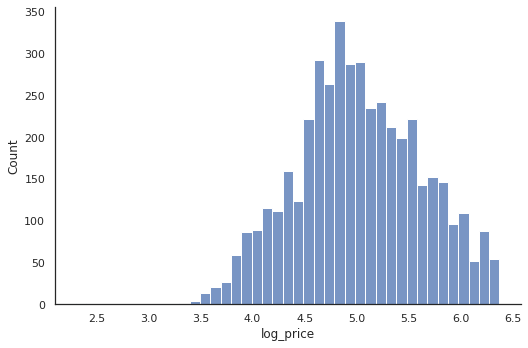

In [823]:
listing_data_95.loc[:,"log_price"] = np.log(listing_data_95.loc[:,"price"])
sns.displot(data=listing_data_95, x="log_price", kind="hist", aspect=1.5)

I had removed a few listings with 0 prices and also outliers from the data frame before taking the log. The price seems to have a log-normal distribution.

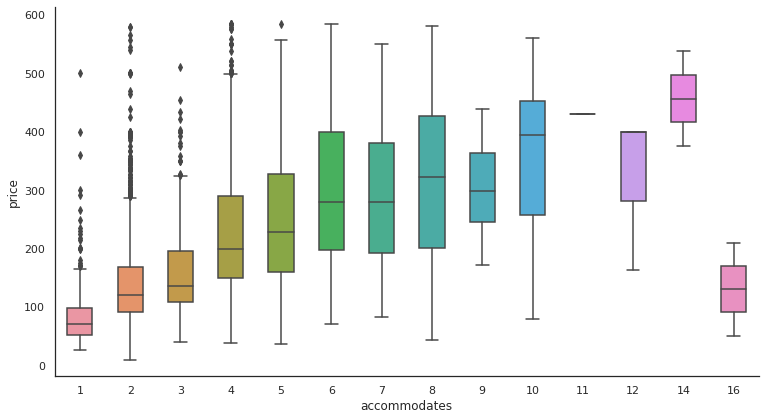

In [824]:
sns.catplot(
    data=listing_data_95, 
    x='accommodates', y='price', kind='box',
    height=6, aspect=1.8, width=0.5
)

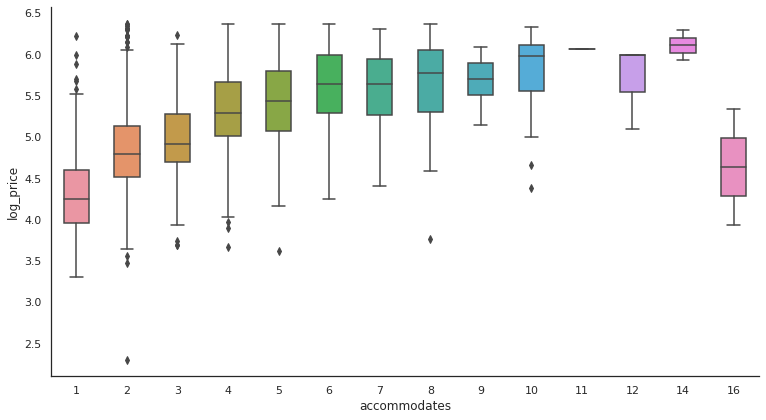

In [825]:
sns.catplot(
    data=listing_data_95, 
    x='accommodates', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)

We clearly see that the price increases with increasing accommodates value in general.

The bottom line of the box is the first quartile so 25% of values are below this line.

The line in the middle of the box indicates the median value. Half of the values are below this line.

The top line of the box is the third quartile which means 75% of values are below this line.

Half of the values are between the bottom and top line of the box so we get an overview of the distribution of values. The dots on the bottom and top indicate outliers.

**Availability**

There are several columns related to the availability of a place. For instance, the availability_30 column shows the number of available days in the next 30 days.

We can also see the number of available days in the next 60, 90, and 365 days.

Let’s check if there is a correlation between the number of available days and price.

In [826]:
listing_data_95[[ 
    'availability_30', 'availability_60', 
    'availability_90', 'availability_365',
    'price'
]].corr()

,availability_30,availability_60,availability_90,availability_365,price
availability_30,1.000000,0.895695,0.802245,0.446055,-0.133892
availability_60,0.895695,1.000000,0.957776,0.543032,-0.157915
availability_90,0.802245,0.957776,1.000000,0.596693,-0.154493
availability_365,0.446055,0.543032,0.596693,1.000000,-0.113981
price,-0.133892,-0.157915,-0.154493,-0.113981,1.000000


In [827]:
listing_data_95[[ 
    'availability_30', 'availability_60', 
    'availability_90', 'availability_365',
    'log_price'
]].corr()

,availability_30,availability_60,availability_90,availability_365,log_price
availability_30,1.000000,0.895695,0.802245,0.446055,-0.139502
availability_60,0.895695,1.000000,0.957776,0.543032,-0.164504
availability_90,0.802245,0.957776,1.000000,0.596693,-0.158444
availability_365,0.446055,0.543032,0.596693,1.000000,-0.115492
log_price,-0.139502,-0.164504,-0.158444,-0.115492,1.000000


There seems to be a small negative correlation between the number of available days and the price. We also see a high positive correlation between the number of available days in the next 30, 60, and 90 days which is actually not a surprise.

There is a column called instant_bookable which might have an impact on the price. People who need a place urgently look for places that are instantly bookable. Money is usually a second degree of concern for them.

In [828]:
listing_data_95.groupby(
    ['instant_bookable'], as_index=False
).agg(
    avg_price = ("price","mean"),
    qty = ("price","count")
)

,instant_bookable,avg_price,qty
0,0,184.089881,3360
1,1,167.917883,1096


In [829]:
listing_data_95.groupby(
    ['instant_bookable'], as_index=False
).agg(
    avg_price = ("log_price","mean"),
    qty = ("log_price","count")
)

,instant_bookable,avg_price,qty
0,0,5.029450,3360
1,1,4.961914,1096


In [830]:
listing_data_95.drop(['name', 'description', 'neighborhood_overview', 'host_neighbourhood'], axis=1, inplace=True)

In [831]:
listing_data_95.drop("log_price", axis=1, inplace=True)

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'host_id'}>,
        <Axes: title={'center': 'host_response_rate'}>,
        <Axes: title={'center': 'host_acceptance_rate'}>,
        <Axes: title={'center': 'host_is_superhost'}>,
        <Axes: title={'center': 'host_listings_count'}>],
       [<Axes: title={'center': 'host_has_profile_pic'}>,
        <Axes: title={'center': 'host_identity_verified'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'accommodates'}>,
        <Axes: title={'center': 'bedrooms'}>],
       [<Axes: title={'center': 'beds'}>,
        <Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'minimum_nights'}>,
        <Axes: title={'center': 'maximum_nights'}>,
        <Axes: title={'center': 'has_availability'}>,
        <Axes: title={'center': 'availability_30'}>],
       [<Axes: title={'center': 'availability_60'}>,
        <Axes: title={'center'

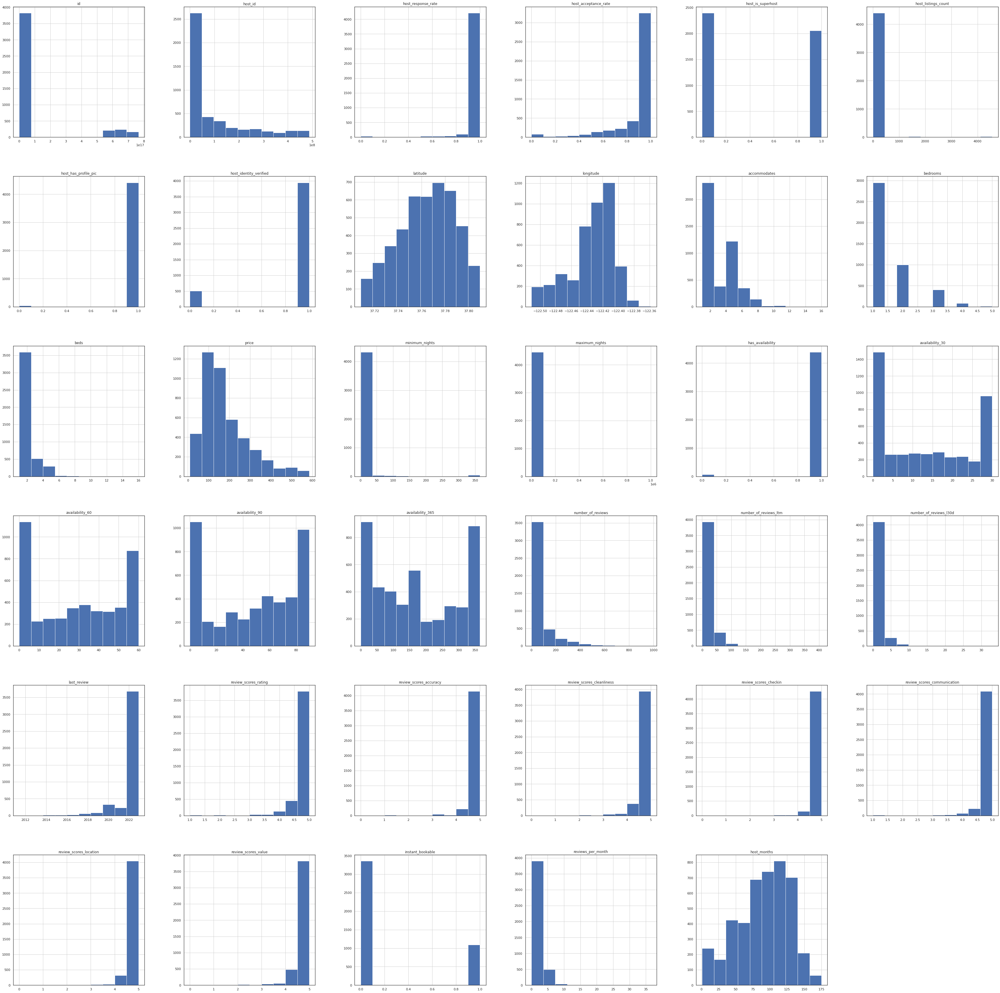

In [832]:
listing_data_95.hist(figsize=(60,60))

### the last element we have yet to analyze is the number of reviews.

We can loosely interpret number of reviews as times people have stayed in the said listing. Of course, this depends on when the listing appeared, how long it appeared for, and various other factors. But it could serve to be useful information to see correlation between price and number of reviews.

<Axes: title={'center': 'Reviews based on Price'}, xlabel='price'>

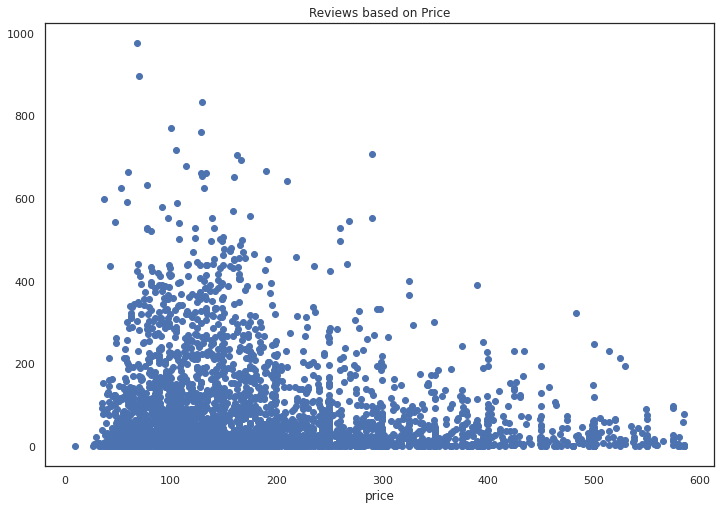

In [833]:
price_review = listing_data_95[['number_of_reviews', 'price']].sort_values(by = 'price')

price_review.plot(x = 'price', 
                  y = 'number_of_reviews', 
                  style = 'o',
                  figsize =(12,8),
                  legend = False,
                  title = 'Reviews based on Price')

The graph shows that listings with prices that range around $100 - 300 get the most reviews, probably because they are in the most reasonable price range. The number quickly declines as the price goes up.

This indicates that more people book listings that are around $100 - 300 in prices.

### Total number of reviews up to date

In [834]:
sum(listing_data_95.number_of_reviews)

292511

### Average number of reviews per listing

In [835]:
np.mean(listing_data_95.reviews_per_month)

1.4838734290843805

On which price most of the properties available?

In [836]:
most_prop_available=listing_data_95['price'].value_counts()
print(most_prop_available)

100.0    83
125.0    83
150.0    81
250.0    73
120.0    63
         ..
457.0     1
302.0     1
326.0     1
242.0     1
213.0     1
Name: price, Length: 446, dtype: int64


In [837]:
most_prop_available_data ={'Price':most_prop_available.index.to_list(),'Properties Available':most_prop_available.to_list()}

most_prop_available_df=pd.DataFrame(most_prop_available_data)
most_prop_available_df

,Price,Properties Available
0,100.0,83
1,125.0,83
2,150.0,81
3,250.0,73
4,120.0,63
...,...,...
441,457.0,1
442,302.0,1
443,326.0,1
444,242.0,1


From the above dataframe it is clear that price $100 has more properties available

What is the proportion of the bedroom values in the overall bedroom values?

In [838]:
bedroom_props=listing_data_95['bedrooms'].value_counts()
Totalbedrooms=bedroom_props.sum()

data={'Bedroom_values':bedroom_props.index.to_list(),'Proportion':bedroom_props.to_list()}

bedroom_props_df=pd.DataFrame(data)
print("Total no. of Bedrooms available : ",Totalbedrooms)
print('\n')
print("Each bedroom proportion : ")
bedroom_props_df

Total no. of Bedrooms available :  4456


Each bedroom proportion : 


,Bedroom_values,Proportion
0,1.0,2952
1,2.0,1001
2,3.0,403
3,4.0,86
4,5.0,14


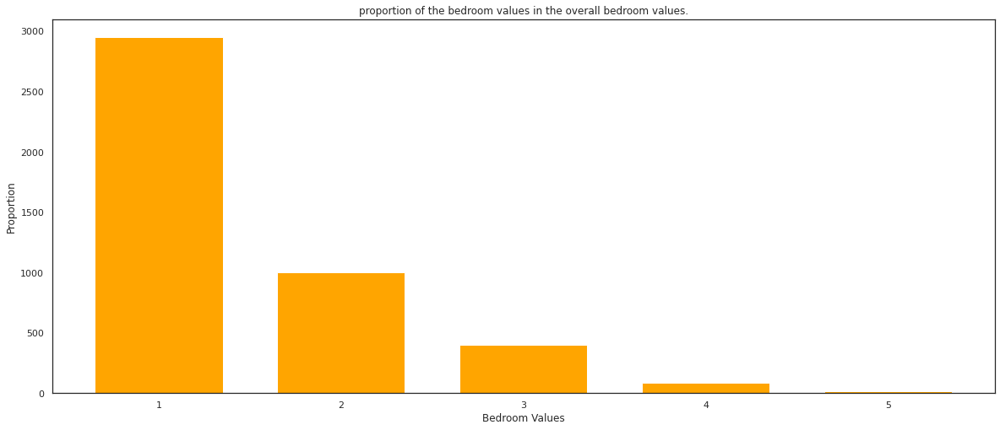

In [839]:
#visualize using bar chart
sizes=bedroom_props.to_list()
labels=bedroom_props.index.to_list()

plt.bar(labels,sizes,width=0.7
        ,color='orange')
plt.xlabel("Bedroom Values")
plt.ylabel("Proportion")
plt.title("proportion of the bedroom values in the overall bedroom values.")
plt.show()

Plot a histogram of reviews where bins are 20 and range is between 0 to 100.

Text(0.5, 1.0, 'Histogram For Reviews Column Data')

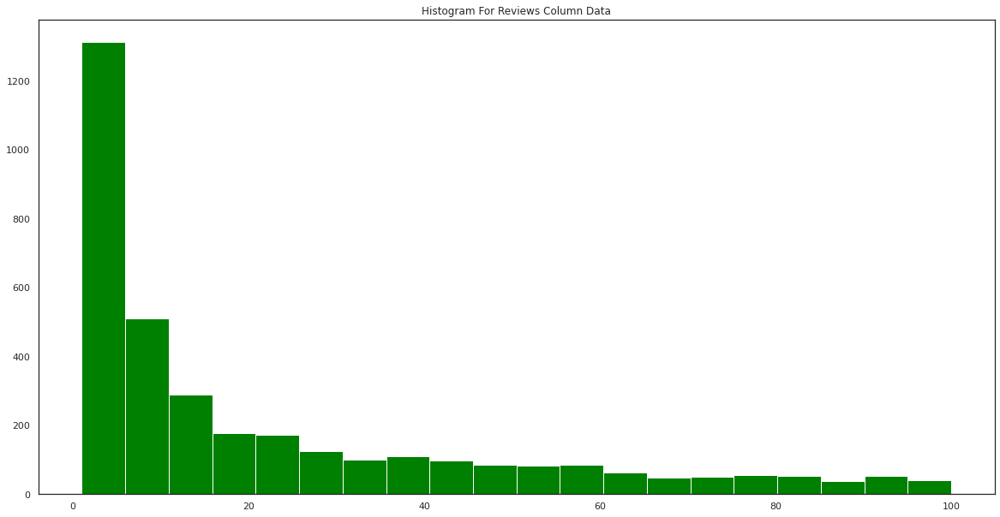

In [840]:
fig=plt.figure(figsize=[20,10])
plt.hist('number_of_reviews',bins=20,range=(1,100),data=listing_data_95,color="green")
plt.title("Histogram For Reviews Column Data")

Plot a histogram of reviews where bins are 20 and range is between 0 to 1000.

Text(0.5, 1.0, 'Histogram For Reviews Column Data')

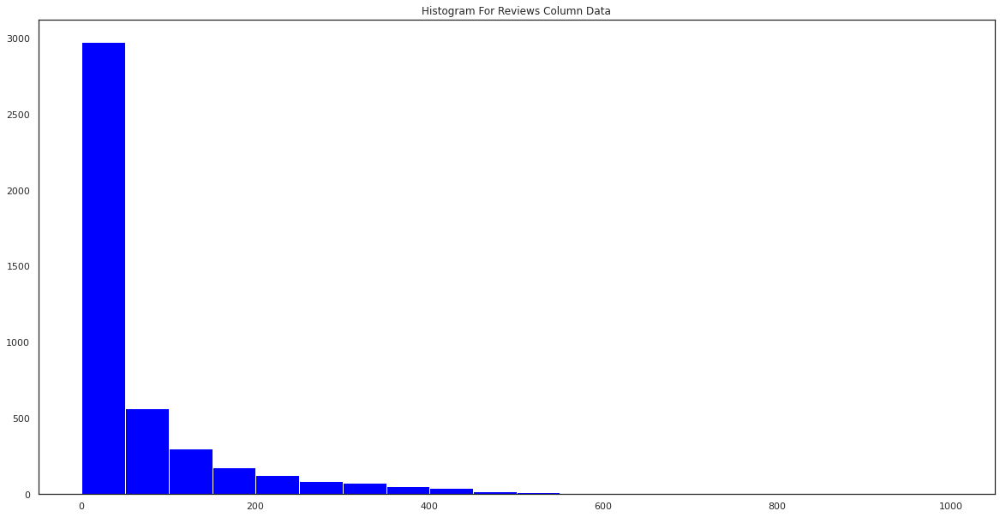

In [841]:
fig=plt.figure(figsize=[20,10])
plt.hist('number_of_reviews',bins=20,range=(1,1000),data=listing_data_95,color="blue")
plt.title("Histogram For Reviews Column Data")

Plot a histogram of accomodates where bins are 16.

Text(0.5, 1.0, 'Histogram For Accomodates Column Data')

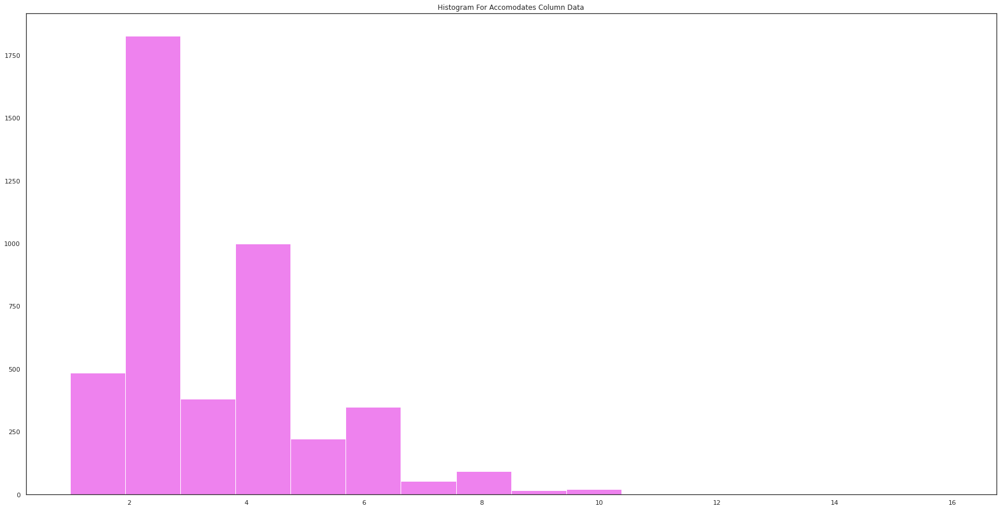

In [842]:
fig=plt.figure(figsize=[30,15])
plt.hist('accommodates',bins=16,data=listing_data_95,color="violet")
plt.title("Histogram For Accomodates Column Data")

Plot a histogram of number_of_reviews.

Text(0.5, 1.0, 'Histogram For number_of_reviews Column Data')

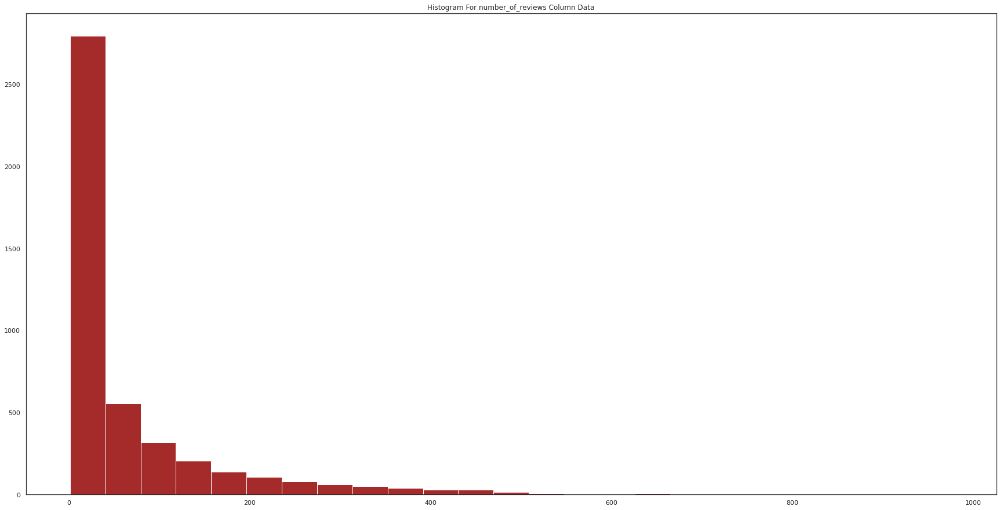

In [843]:
fig=plt.figure(figsize=[30,15])
plt.hist('number_of_reviews',bins=25,data=listing_data_95,color="brown")
plt.title("Histogram For number_of_reviews Column Data")

Plot a histogram of number_of_reviews where price is greater than equal to 100 and less than equal to 200.

In [844]:
filter_price=listing_data_95[(listing_data_95['price']>=100) & (listing_data_95['price']<=200)]
filter_price.head()

,id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months,bathroom_qty,bathroom_type
1,958,1169,Holly,within an hour,1.0,0.98,1,1,1,1,...,4.92,4.95,4.88,4.98,4.76,0,2.28,175.0,1,bath
5,8739,7149,Ivan & Wendy,within an hour,1.0,0.89,1,2,1,1,...,4.94,4.95,4.96,4.93,4.74,0,4.68,169.0,1,private
8,11490,42681,Rachael,within an hour,1.0,0.50,1,1,1,1,...,4.68,4.87,4.90,4.97,4.74,0,0.28,160.0,1,bath
12,18904,72464,Patrick,within a day,1.0,0.73,1,2,1,1,...,4.94,4.91,4.91,4.90,4.77,0,3.29,157.0,1,private
13,21334,81455,Joe,within an hour,1.0,1.00,1,1,1,1,...,4.63,4.99,4.97,4.87,4.83,1,0.81,156.0,1,bath


Text(0.5, 1.0, 'Histogram For number_of_reviews Column Data')

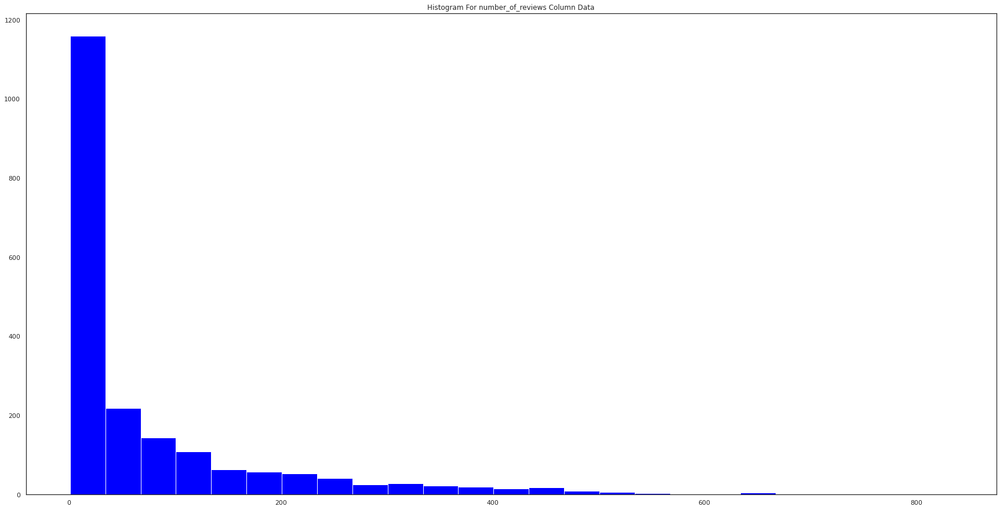

In [845]:
#plotting a histogram
fig=plt.figure(figsize=[30,15])
plt.hist('number_of_reviews',bins=25,data=filter_price,color="blue")
plt.title("Histogram For number_of_reviews Column Data")

Plot a histogram of number_of_reviews where price is less than 50.

In [846]:
filter_price=listing_data_95[(listing_data_95['price']<50)]
filter_price.head()

,id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months,bathroom_qty,bathroom_type
47,70753,329072,James & Friends,within an hour,1.0,0.99,0,3,1,1,...,4.55,4.86,4.86,4.82,4.66,1,3.03,145.0,1,shared
50,72444,329072,James & Friends,within an hour,1.0,0.99,0,3,1,1,...,4.60,4.84,4.88,4.80,4.74,1,3.82,145.0,1,shared
87,810315,1504399,"Skt, Teo",within an hour,1.0,0.98,1,3,1,1,...,4.75,4.92,4.92,5.00,4.83,0,0.29,134.0,1,shared
88,815183,4282539,Lily,within an hour,1.0,0.75,1,1,1,1,...,4.85,5.00,4.85,4.69,4.46,0,0.13,122.0,1,bath
201,1351783,7335923,Allen,within a day,1.0,0.00,0,2,1,1,...,4.70,4.93,4.95,4.55,4.75,0,0.35,115.0,1,bath


Text(0.5, 1.0, 'Histogram For number_of_reviews Column Data')

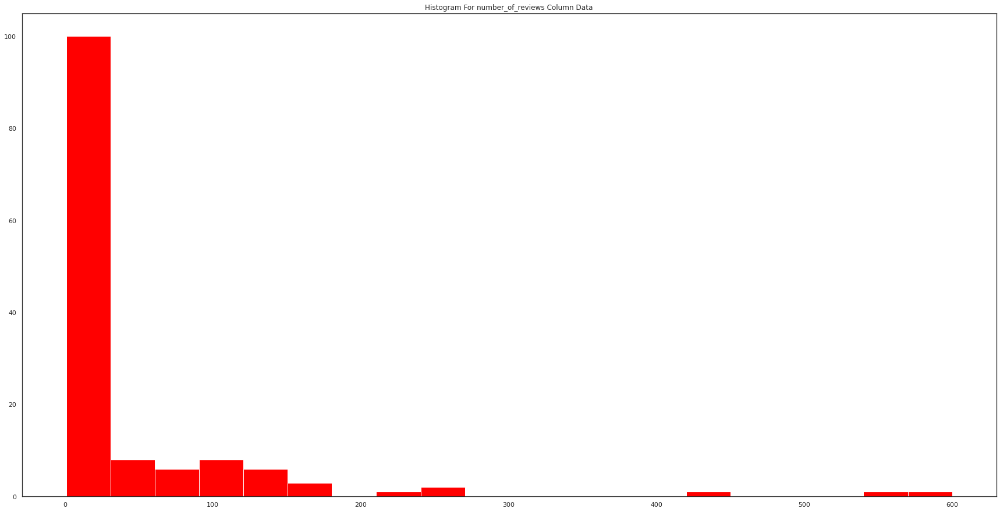

In [847]:
#plotting a histogram
fig=plt.figure(figsize=[30,15])
plt.hist('number_of_reviews',bins=20,data=filter_price,color="red")
plt.title("Histogram For number_of_reviews Column Data")

Plot a histogram of number_of_reviews where price is greater than 200.

In [848]:
filter_price=listing_data_95[(listing_data_95['price']>200)]
filter_price.head()

,id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months,bathroom_qty,bathroom_type
2,5858,8904,Philip And Tania,within a few hours,0.8,0.71,0,2,1,1,...,4.87,4.89,4.85,4.77,4.68,0,0.67,168.0,1,bath
4,8339,24215,Rosy,within a few hours,1.0,0.00,0,2,1,1,...,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0,1.5,baths
14,23611,18732,Cecilia,within an hour,1.0,1.00,0,1,1,1,...,4.93,4.96,4.95,4.77,4.83,0,1.70,165.0,1,bath
19,27028,7149,Ivan & Wendy,within an hour,1.0,0.89,1,2,1,1,...,4.88,4.81,4.92,4.88,4.58,0,0.29,169.0,1,private
23,33578,145258,Kepa,within an hour,1.0,0.97,1,2,1,0,...,4.94,4.99,4.99,4.88,4.80,0,4.76,152.0,1,bath


Text(0.5, 1.0, 'Histogram For number_of_reviews Column Data')

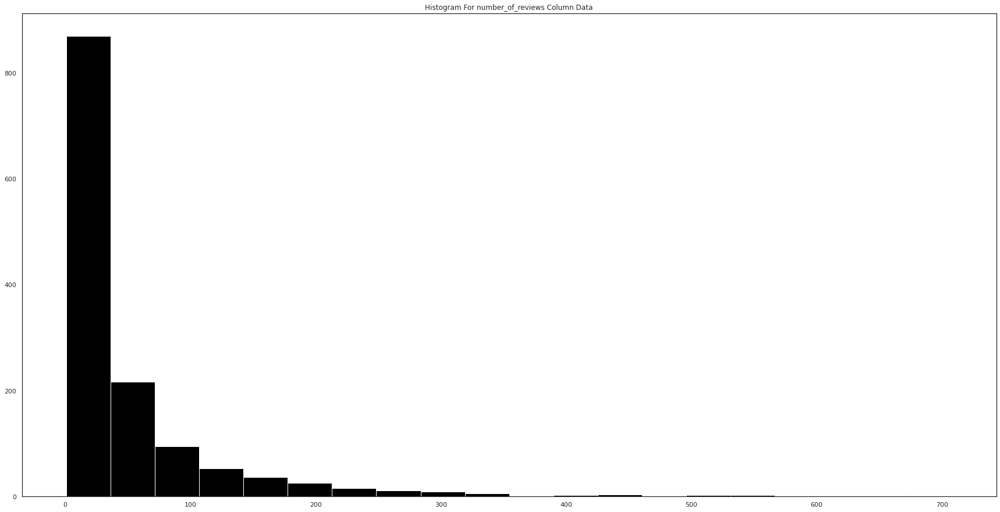

In [849]:
#plotting a histogram
fig=plt.figure(figsize=[30,15])
plt.hist('number_of_reviews',bins=20,data=filter_price,color="black")
plt.title("Histogram For number_of_reviews Column Data")

Plot a histogram of review_scores_rating where price is greater than 300.

In [850]:
# Plot a histogram of overall satisfaction where price is greater than 300
filter_price=listing_data_95[(listing_data_95['price']>300)]
filter_price.head()

,id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month,host_months,bathroom_qty,bathroom_type
4,8339,24215,Rosy,within a few hours,1.0,0.00,0,2,1,1,...,5.00,4.94,5.00,4.94,4.75,0,0.17,163.0,1.5,baths
42,60365,279544,Emilie,within an hour,1.0,0.96,1,6,1,1,...,4.93,4.91,4.91,4.86,4.78,0,1.68,147.0,2,baths
67,124011,617985,Patrick,within an hour,1.0,0.60,0,3,1,1,...,4.73,4.95,4.86,4.82,4.55,0,0.23,140.0,2.5,baths
68,128230,634277,Maria,within an hour,1.0,1.00,1,1,1,1,...,4.94,4.89,4.88,4.94,4.81,0,1.24,140.0,1,bath
75,142177,656263,Noreen,within a few hours,1.0,0.95,0,1,1,1,...,4.87,4.95,4.97,4.78,4.79,0,1.71,140.0,1,bath


Text(0.5, 1.0, 'Histogram For number_of_reviews Column Data')

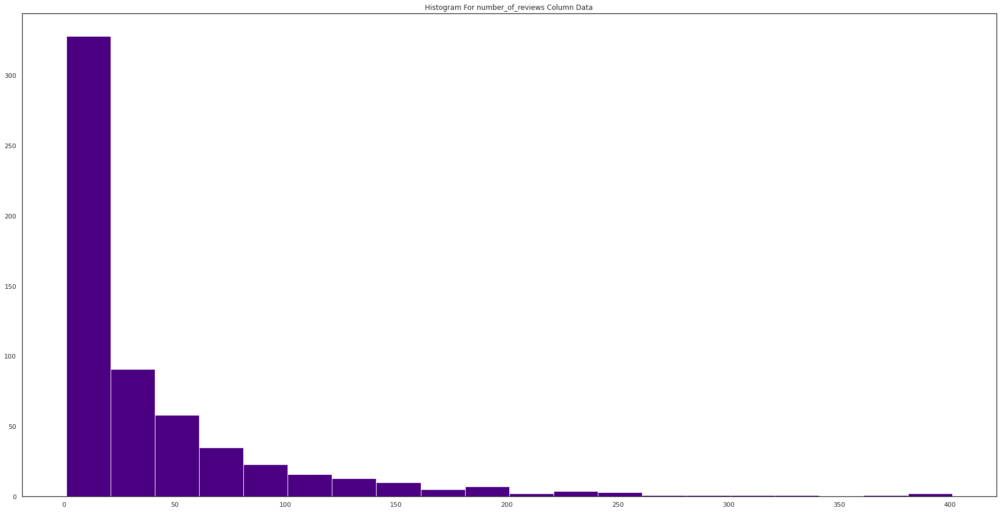

In [851]:
#plotting a histogram
fig=plt.figure(figsize=[30,15])
plt.hist('number_of_reviews',bins=20,data=filter_price,color="indigo")
plt.title("Histogram For number_of_reviews Column Data")

Is there a relationship between price and reviews?

Text(0.5, 1.0, 'Relationship between price and reviews')

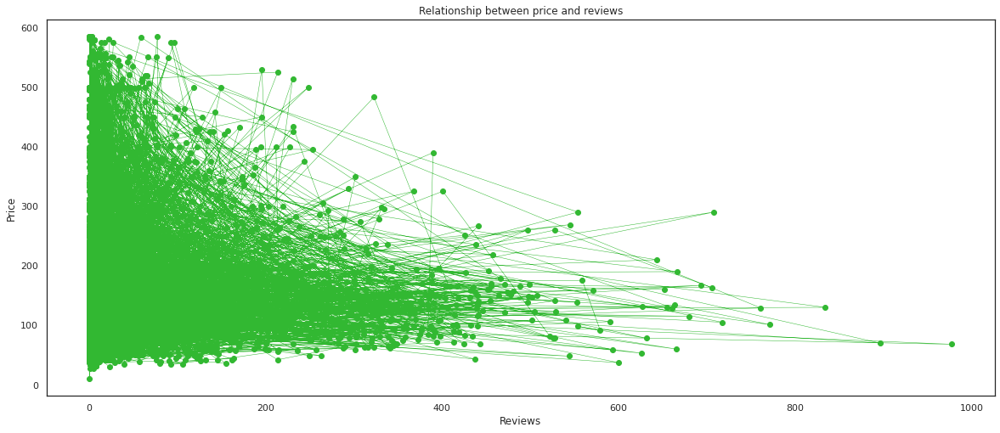

In [852]:
plt.plot(listing_data_95['number_of_reviews'],listing_data_95['price'],marker='o',c='#32b832',linewidth=0.5)
plt.xlabel("Reviews")
plt.ylabel("Price")
plt.title("Relationship between price and reviews")

In [853]:
# Finding the relationship using Pearson Correlation method
from scipy.stats import pearsonr
correlation, _ = pearsonr(listing_data_95['number_of_reviews'],listing_data_95['price'])
print('Pearsons correlation: %.3f' % correlation)

Pearsons correlation: -0.099


Inference:

1. There is a negative trend relationship between price and number of reviews.
2. If the no. of reviews increases, price will decrease.

Is there a relationship between price and accommodates?

Text(0.5, 1.0, 'Relationship between price and accommodates ')

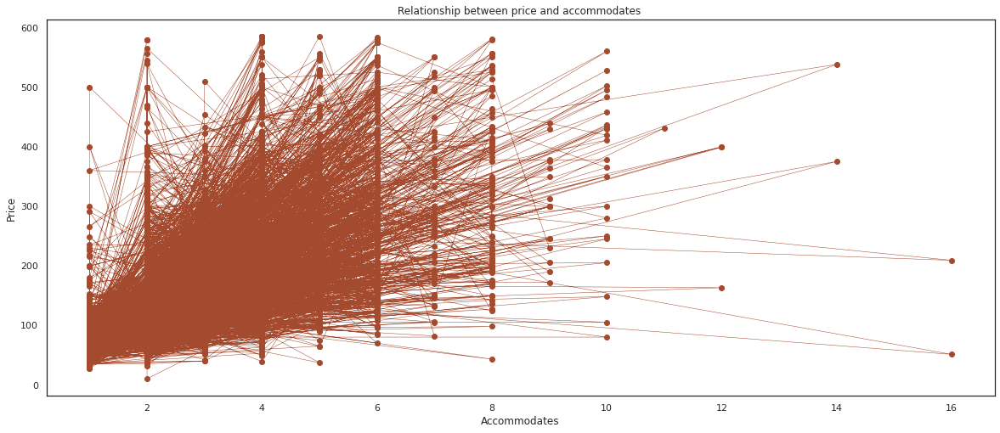

In [854]:
plt.plot(listing_data_95['accommodates'],listing_data_95['price'],marker='o',c='#a34a2f',linewidth=0.5)
plt.xlabel("Accommodates")
plt.ylabel("Price")
plt.title("Relationship between price and accommodates ")

In [855]:
# Finding the relationship using Pearson Correlation method
correlation, _ = pearsonr(listing_data_95['accommodates'],listing_data_95['price'])
print('Pearsons correlation: %.3f' % correlation)

Pearsons correlation: 0.567


Inference

1. From the above graph and correlation value , it is clear that there is a slightly positive linear trend relationship between accommodates and price.
2. If no. of accommodates increases, price will also increases

Is there a relationship between price and Bedrooms?

Text(0.5, 1.0, 'Relationship between price and Bedrooms ')

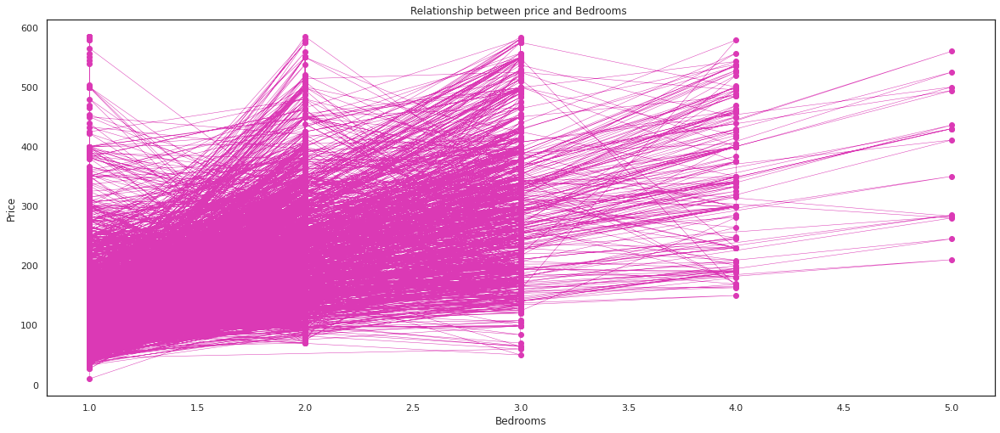

In [856]:
plt.plot(listing_data_95['bedrooms'],listing_data_95['price'],marker='o',c='#db39b5',linewidth=0.5)
plt.xlabel("Bedrooms")
plt.ylabel("Price")
plt.title("Relationship between price and Bedrooms ")

In [857]:
# Finding the relationship using Pearson Correlation method
correlation, _ = pearsonr(listing_data_95['bedrooms'],listing_data_95['price'])
print('Pearsons correlation: %.3f' % correlation)

Pearsons correlation: 0.559


Inference

1. From the above graph and correlation value , it is clear that there is no linear trend relationship between bedrooms and price.
2. The graph is uncorrelated

Questions that need answers
Having played around with the data, my curious mind has come up with the following questions that I'll try to answer using the CRISP DM

1. Which SF neighbourhoods are the earn the highest revenue?
2. Which accommodation size receives the highest number of bookings?
3. How well can we predict listing price?

**1. Which SF neighbourhoods earn the highest revenue?**

We do not have a revenue column in our dataset so I will assume that each review was a stay at a listing. This would give us an estimated number of stays at each listing, but we do not know how long each stay was. To estimate this I will use the minimum number of days. With this I can calculate the estimated revenue for each neighbourhood as illustrated below.

In [858]:
reviews_df = pd.read_csv('detailed_reviews.csv')

In [859]:
reviews_df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,958,5977,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,958,6660,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,958,11519,2009-09-27,25839,Denis,We were very pleased with the accommodations a...
3,958,16282,2009-11-05,33750,Anna,We highly recommend this accomodation and agre...
4,958,26008,2010-02-13,15416,V Jillian,Holly's place was great. It was exactly what I...


<Figure size 1440x576 with 0 Axes>

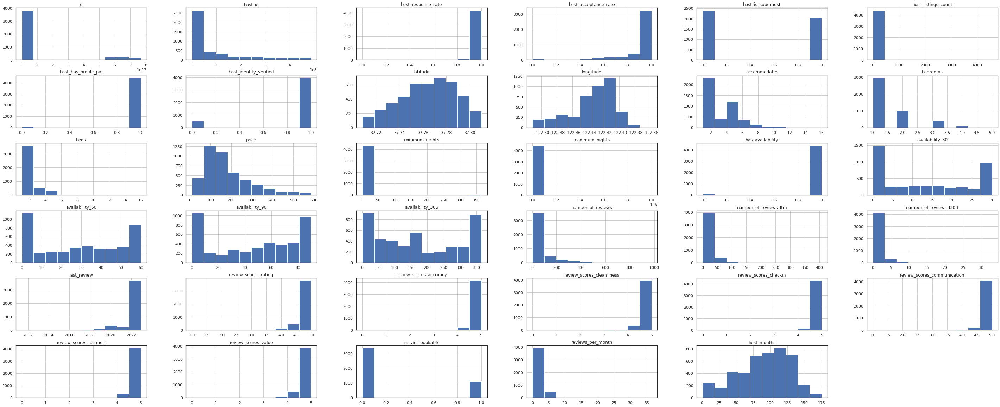

In [860]:
plt.tight_layout();
listing_data_95.hist(figsize=(50, 20));

In [861]:
listing_data_95.rename(columns={'id':'listing_id'}, inplace=True)

In [862]:
bookings_df = pd.merge(reviews_df, listing_data_95, on='listing_id')
bookings_df.shape

(292511, 52)

In [863]:
bookings_df['listing_estimated_revenue'] = bookings_df['price'] * bookings_df['minimum_nights']

In [864]:
listings_revenue_df = bookings_df[['listing_id','listing_estimated_revenue']].groupby(by='listing_id').sum()

In [865]:
listings_revenue_df.shape

(4456, 1)

In [866]:
new_listings_df = pd.merge(listing_data_95, listings_revenue_df, on='listing_id', how='right')

In [867]:
new_listings_df.shape

(4456, 48)

In [868]:
new_listings_df[['neighbourhood_cleansed','listing_estimated_revenue']].groupby(by='neighbourhood_cleansed').mean().sort_values(by='listing_estimated_revenue', ascending=False).head()

,listing_estimated_revenue
neighbourhood_cleansed,
Presidio,661447.000000
Diamond Heights,259549.333333
Noe Valley,156658.916201
Castro/Upper Market,150971.033175
Russian Hill,136540.988636


From the above, We see that the neighbourhoods with the highest possible revenue are:

Presidio

Diamond Heights

Noe Valley

Castro/Upper Market

Russian Hill

**2. Which accommodation size receives the highest number of bookings?**

In [869]:
accommodates_values = bookings_df.accommodates.value_counts()

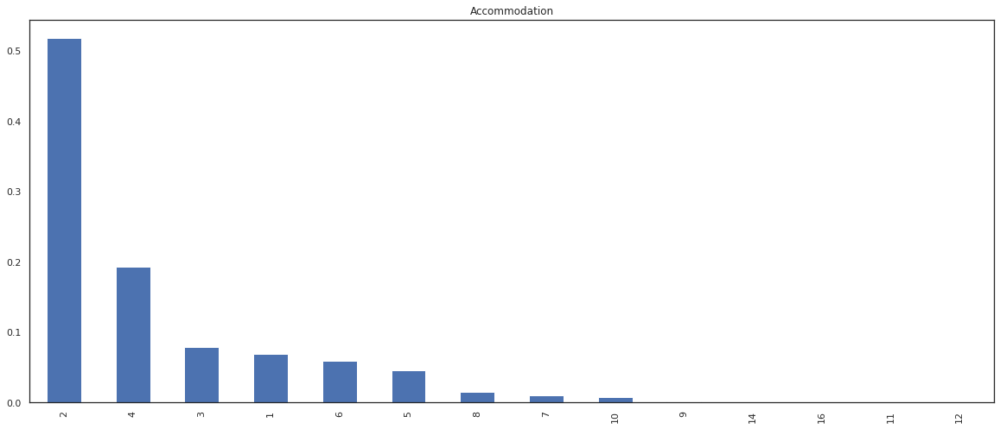

In [870]:
(accommodates_values/bookings_df.shape[0]).plot(kind="bar");
plt.title("Accommodation");

From the above analysis, we learn that properties that accommodate 2 people account for over half of the total bookings.

**3. How well can we predict listing price?**

This is the most interesting because its where we create the model.We first clean up the data by imputing values for categorical variables. We then split the data into training and test data. After this, we instantiate the linear regression model and fit our training data into the model.

In [871]:
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    Perform to obtain the correct X and y objects
    This function cleans df using the following steps to produce X and y:
    1. Select the numeric variables in the dataset
    2. Imputes the mean to fill null values for numeric variables
    3. Select the categorical variables
    4. Creates dummy columns for the categorical variables
    5. Create X as all the columns that are not the Price column
    6. Create y as the Price column
    '''
    num_vars= df.select_dtypes(include=['int','float']).copy().columns
   
    for var in num_vars:
        df[var].fillna((df[var].mean()), inplace=True)
   
    cat_vars = df.select_dtypes(include=['object']).copy().columns

    for var in cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)    
   
    X = df.drop(columns=['price'], axis=1)
    y = df['price']
    
    return X, y

**Filling in missing values**

Missing data reduces the statistical power of the analysis, which can distort the validity of the results. Since the data is numerical, we can use the mean to impute the missing values because it has the advantage of keeping the same mean and the same sample sizes. The next step uses the clean_data function defined above to fill in missing values in the data.

In [872]:
listing_data_95.rename(columns={'neighbourhood_cleansed':'neighbourhood'}, inplace=True)

In [873]:
listing_data_95.columns

Index(['listing_id', 'host_id', 'host_name', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_listings_count', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month',
       'host_months', 'bathroom_qty'

In [874]:
# Feature Engineering based on column 'Amenities'
# Does the unit provide TV, Internet, Breakfast, Kitchen, Air conditioning, Heating, Washer, Dryer

def hasAmenity(amenity):
  def hasItem(x):
    # print(x)
    if amenity in x:
      return 1
    else:
      return 0
  return hasItem

In [875]:
listing_data_95['FreeParking'] = listing_data_95['amenities'].apply(hasAmenity("Free parking"))
listing_data_95['TV'] = listing_data_95['amenities'].apply(hasAmenity("TV"))
listing_data_95['Internet'] = listing_data_95['amenities'].apply(hasAmenity("Internet"))
listing_data_95['Breakfast'] = listing_data_95['amenities'].apply(hasAmenity("Breakfast"))
listing_data_95['Kitchen'] = listing_data_95['amenities'].apply(hasAmenity("Kitchen"))
listing_data_95['Heating'] = listing_data_95['amenities'].apply(hasAmenity("Heating"))
listing_data_95['Washer'] = listing_data_95['amenities'].apply(hasAmenity("Washer"))
listing_data_95['Gym'] = listing_data_95['amenities'].apply(hasAmenity("Gym"))
listing_data_95['Essentials'] = listing_data_95['amenities'].apply(hasAmenity("Essentials"))
listing_data_95['AirCon'] = listing_data_95['amenities'].apply(hasAmenity("Air conditioning"))
listing_data_95['NonSmoking'] = listing_data_95['amenities'].apply(hasAmenity("No smoking"))
listing_data_95['Pool'] = listing_data_95['amenities'].apply(hasAmenity("Pool"))

In [876]:
listing_data_95.head(3)

,listing_id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,...,Internet,Breakfast,Kitchen,Heating,Washer,Gym,Essentials,AirCon,NonSmoking,Pool
0,144978,216682,Jay,within a few hours,1.0,0.89,0,9,1,1,...,0,0,1,0,1,0,1,0,0,0
1,958,1169,Holly,within an hour,1.0,0.98,1,1,1,1,...,0,0,1,1,0,0,1,0,0,0
2,5858,8904,Philip And Tania,within a few hours,0.8,0.71,0,2,1,1,...,0,0,1,1,1,0,1,0,0,0


In [877]:
listing_data_95[['FreeParking', 'TV',
       'Internet', 'Breakfast', 'Kitchen', 'Heating', 'Washer', 'Gym',
       'Essentials', 'AirCon', 'NonSmoking', 'Pool']]

,FreeParking,TV,Internet,Breakfast,Kitchen,Heating,Washer,Gym,Essentials,AirCon,NonSmoking,Pool
0,0,0,0,0,1,0,1,0,1,0,0,0
1,0,1,0,0,1,1,0,0,1,0,0,0
2,0,0,0,0,1,1,1,0,1,0,0,0
3,0,0,0,0,1,1,0,0,0,0,0,0
4,0,1,0,0,1,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
6784,0,1,0,0,1,0,0,0,1,0,0,0
6785,0,1,0,0,1,1,0,0,1,0,0,0
6786,0,1,0,0,1,1,1,0,1,0,0,0
6787,0,1,0,0,1,1,1,0,1,0,0,0


In [878]:
listing_data_95.select_dtypes(include='number').nunique().sort_values()
listing_data_95.select_dtypes(exclude='number').nunique().sort_values()
listing_data_95.dtypes

listing_id                               int64
host_id                                  int64
host_name                               object
host_response_time                      object
host_response_rate                     float64
host_acceptance_rate                   float64
host_is_superhost                        int64
host_listings_count                      int64
host_has_profile_pic                     int64
host_identity_verified                   int64
neighbourhood                           object
neighbourhood_group_cleansed          category
latitude                               float64
longitude                              float64
property_type                           object
room_type                             category
accommodates                             int64
bathrooms_text                          object
bedrooms                               float64
beds                                   float64
amenities                               object
price        

In [879]:
listingsnew = pd.read_csv(listings_file)
# replacing NaN values with 0
# listingsnew.fillna(0, inplace=True)

# extract the 'prices' from the table
pricenew = listingsnew['price']
pricesnew = []
for element in pricenew:
    element = float(element[1:].replace(',',''))
    pricesnew.append(element)
# # replacing the current column into a new one for future use
listingsnew['price'] = pricesnew

In [880]:
listingsnew['price'].describe()

count     6789.000000
mean       268.709088
std        944.974389
min          0.000000
25%         99.000000
50%        150.000000
75%        250.000000
max      25000.000000
Name: price, dtype: float64

In [881]:
# Check Price percentile
low = .5
high = 99.5

print('Percentile of', low,' % price is ', np.percentile(listingsnew['price'].dropna(),low, axis =0))
print('Percentile of',high,'% price is ', np.percentile(listingsnew['price'].dropna(),high, axis =0))

Percentile of 0.5  % price is  36.0
Percentile of 99.5 % price is  2959.44


In [882]:
listingsnew["bathroom_qty"] = listingsnew["bathrooms_text"].str.split(" ", expand=True)[0]
listingsnew["bathroom_type"] = listingsnew["bathrooms_text"].str.split(" ", expand=True)[1]

In [883]:
# Get a list of the numeric features
numeric_features = listingsnew.select_dtypes(include='number').columns.tolist()
print("numeric_features :: ")
print(numeric_features)

# Cardinality of the nonnumeric features
cardinality = listingsnew.select_dtypes(exclude='number').nunique()
print("cardinality :: ")
print(cardinality)

# List of all categorical features with  (2< cardinality <70)
cat_features = cardinality[(cardinality <= 70) & (cardinality > 2) ].index.tolist()
print("cat_features :: ")
print(cat_features)

# Combine the lists 
features = numeric_features + cat_features
print("features :: ")
print(features)

numeric_features :: 
['id', 'scrape_id', 'host_id', 'host_listings_count', 'host_total_listings_count', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'reviews_per_month']
cardinality :: 
listing_url            

In [884]:
def wrangle(X):
    """Wrangle train, validate, and test sets in the same way"""
    
    # Prevent SettingWithCopyWarning
    X = X.copy()

    # Customise columns: Replace white space with underscore
    X.columns = X.columns.str.replace(' ', '_')  

    # Extract any 'good' Nulls value before they're removed.

    # 1. For string: Replace the nulls with 'not_listed', and impute missing values later. !!!
    for col in cat_features:
        X[col] = X[col].fillna('not_listed')


    # 2. For numbers: Replace the nulls with 0 (fillna(0)), and impute missing values later. !!!
    for col in numeric_features:
        X[col] = X[col].fillna(0)

    # Drop duplicates
    X = X.drop(columns=['neighbourhood','neighbourhood_group_cleansed'], axis=1)

    # return the wrangled dataframe
    return X

listingsnew = wrangle(listingsnew)

In [885]:
# Rename dataframe from now on.

df = listingsnew.rename(columns={'neighbourhood_cleansed': 'neighbourhood'})
df.shape

(6789, 75)

In [886]:
df['FreeParking'] = df['amenities'].apply(hasAmenity("Free parking"))
df['TV'] = df['amenities'].apply(hasAmenity("TV"))
df['Internet'] = df['amenities'].apply(hasAmenity("Internet"))
df['Breakfast'] = df['amenities'].apply(hasAmenity("Breakfast"))
df['Kitchen'] = df['amenities'].apply(hasAmenity("Kitchen"))
df['Heating'] = df['amenities'].apply(hasAmenity("Heating"))
df['Washer'] = df['amenities'].apply(hasAmenity("Washer"))
df['Gym'] = df['amenities'].apply(hasAmenity("Gym"))
df['Essentials'] = df['amenities'].apply(hasAmenity("Essentials"))
df['AirCon'] = df['amenities'].apply(hasAmenity("Air conditioning"))
df['NonSmoking'] = df['amenities'].apply(hasAmenity("No smoking"))
df['Pool'] = df['amenities'].apply(hasAmenity("Pool"))

In [887]:
df.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,Internet,Breakfast,Kitchen,Heating,Washer,Gym,Essentials,AirCon,NonSmoking,Pool
0,144978,https://www.airbnb.com/rooms/144978,20221204162417,2022-12-04,city scrape,Prime Location - Small Basic Room,<b>The space</b><br />This is a small room in ...,NaN,https://a0.muscache.com/pictures/915742/ada9fb...,216682,...,0,0,1,0,1,0,1,0,0,0
1,958,https://www.airbnb.com/rooms/958,20221204162417,2022-12-04,city scrape,"Bright, Modern Garden Unit - 1BR/1BTH",Please check local laws re Covid before you re...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,...,0,0,1,1,0,0,1,0,0,0
2,5858,https://www.airbnb.com/rooms/5858,20221204162417,2022-12-04,city scrape,Creative Sanctuary,We live in a large Victorian house on a quiet ...,I love how our neighborhood feels quiet but is...,https://a0.muscache.com/pictures/17714/3a7aea1...,8904,...,0,0,1,1,1,0,1,0,0,0


In [888]:
df.select_dtypes(include='number').nunique().sort_values()
df.select_dtypes(exclude='number').nunique().sort_values()
# df.dtypes

last_scraped                 1
calendar_last_scraped        1
source                       2
instant_bookable             2
host_identity_verified       2
host_has_profile_pic         2
has_availability             2
host_is_superhost            2
room_type                    4
host_response_time           5
host_verifications           5
bathroom_type                6
bathroom_qty                20
bathrooms_text              33
neighbourhood               36
host_response_rate          41
property_type               51
host_acceptance_rate        86
host_location              205
host_neighbourhood         233
last_review               1036
host_name                 1963
license                   1993
host_since                2305
host_about                2392
first_review              2547
host_picture_url          3577
host_thumbnail_url        3577
host_url                  3603
neighborhood_overview     3623
amenities                 5974
description               6125
name    

In [889]:
df['price'].describe()

count     6789.000000
mean       268.709088
std        944.974389
min          0.000000
25%         99.000000
50%        150.000000
75%        250.000000
max      25000.000000
Name: price, dtype: float64

In [890]:
# Check Price percentile
low = .5
high = 99.5

print('Percentile of', low,' % price is ', np.percentile(df['price'].dropna(),low, axis =0))
print('Percentile of',high,'% price is ', np.percentile(df['price'].dropna(),high, axis =0))

Percentile of 0.5  % price is  36.0
Percentile of 99.5 % price is  2959.44


In [891]:
# Make columns cleaner

# Make sure the target is clean
df = df.dropna(subset=['price'])

####################################################################

# Limit the price: remove 0.
df =   df[(df['price'].between(20,800))]# 

# Limit with only the data with notNull >6500
df = df.dropna(thresh=6500, axis=1)
######################################################################


# Get a dataframe with all train columns except unneeded columns
df_features = df.drop(columns=['id', 'scrape_id', 'host_id', 'latitude', 'longitude'], axis=1)

# Get a list of the numeric features
numeric_features = df_features.select_dtypes(include='number').columns.tolist()

# Cardinality of the nonnumeric features
cardinality = df_features.select_dtypes(exclude='number').nunique()

# List of all categorical features with  (2< cardinality <70)
cat_features = cardinality[(cardinality <= 70) & (cardinality > 2) ].index.tolist()

# Combine the lists 
features = numeric_features + cat_features
print(features)

['host_listings_count', 'host_total_listings_count', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'reviews_per_month', 'FreeParking', 'TV', 'Internet', 'Breakfast', 'Kitchen', 'Heating', 'Washer', 'Gym', 'Essentials', 'AirCon', 'NonSmoking', 'Pool', 'host_response_t

In [892]:
train = df[features]

print(train.shape)
train.head(2)

(6598, 56)


,host_listings_count,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,...,Pool,host_response_time,host_response_rate,host_verifications,neighbourhood,property_type,room_type,bathrooms_text,bathroom_qty,bathroom_type
0,9,9,1,0.0,1.0,1.0,55.0,30,365,30.0,...,0,within a few hours,100%,"['email', 'phone']",Pacific Heights,Private room in rental unit,Private room,not_listed,not_listed,not_listed
1,1,1,3,0.0,1.0,2.0,194.0,2,30,1.0,...,0,within an hour,100%,"['email', 'phone']",Western Addition,Entire serviced apartment,Entire home/apt,1 bath,1,bath


In [893]:
!pip install chart_studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [894]:
# Import packages for cgarting

import plotly.figure_factory as ff
import numpy as np
import chart_studio
import chart_studio.plotly as py
import plotly.express as px
%matplotlib inline
import matplotlib.pyplot as plt

In [895]:
# Show the Room_type distribution

fig = px.histogram(df, x='price', title= 'Price and Room_type Distributions', nbins=40, color='room_type', width=1000, height=400)
fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))
fig.update_layout(
    yaxis_title="Count",
    font=dict( family="Courier New, monospace", size=18))#, color="black")) # or color="RebeccaPurple"

fig.show()

In [896]:
# Bedrooms in Neighborhood distribution

fig = px.histogram(df, x="neighbourhood", title="Neighborhood and #Bedrooms Distributions" ,  nbins=40, color='bedrooms', width=1000, height=500).update_xaxes(categoryorder="total descending")

fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))
fig.update_layout(
    yaxis_title="Count",
    font=dict( family="Courier New, monospace", size=18))#, color="black")) # or color="RebeccaPurple"

fig.show();

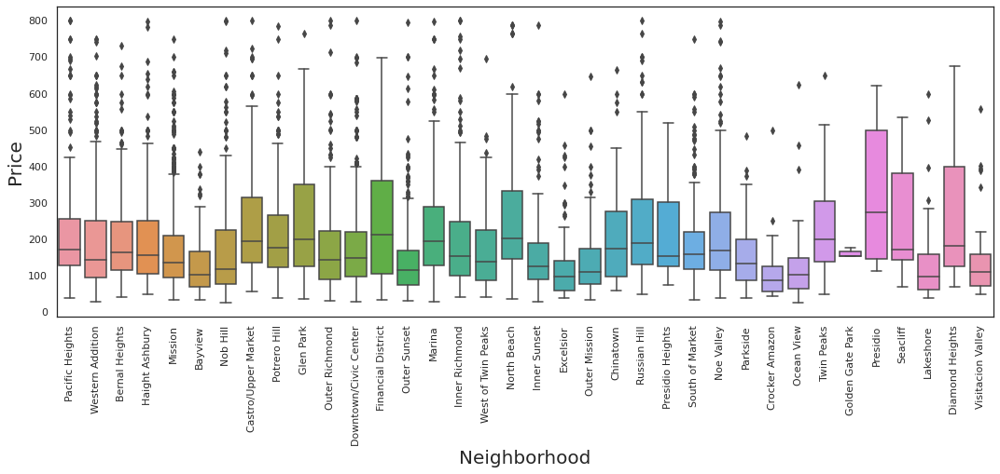

In [897]:
import seaborn as sns
import matplotlib.pyplot as plt



plt.figure(figsize=(18, 6))
chart2 = sns.boxplot(x = df["neighbourhood"], y = df["price"])#, palette="Blues");
chart2.set_xticklabels(chart2.get_xticklabels(), rotation=90);
plt.xlabel("Neighborhood", size=20)
plt.ylabel("Price", size=20)
plt.show();

In [898]:
# Pricec distribution across Neighborhood



fig = px.box(df, x="neighbourhood", y="price", title = 'Price Distribution Across Neighborhood')
fig.show()

In [899]:
# Number of people can be accommodated and price

fig = px.box(df, x="accommodates", y="price", title = 'Price Distributions over #Accommodated Guests')

fig.show()

In [900]:
# Same graph with scatter plot

fig = px.scatter(df, x="accommodates", y="price", trendline='ols', width=1000, height=400)
fig.show()

In [901]:
# Accommodates distribution

fig = px.histogram(df, x="accommodates",  title="#Beds in 'Accommodates' Distribution" ,  nbins=40, color='beds', width=1000, height=500) #.update_xaxes(categoryorder="total descending")

fig.update_layout(legend=dict( yanchor="top",  y=.95,  xanchor="right", x=.95 ))


# plt.xlabel("Neighborhood", size=20);
# plt.ylabel("Count", size=20);
fig.show();

In [902]:
# Property-Type and Price

fig = px.box(df, x="property_type", y="price", title = 'Price Distribution over Property types', width=1000, height=1000)

fig.show()

In [903]:
# Number Bedrooms and price

fig = px.box(df, x="bedrooms", title = 'Price distributions for each #Bedrooms', y="price",width=1000, height=400)

fig.show()

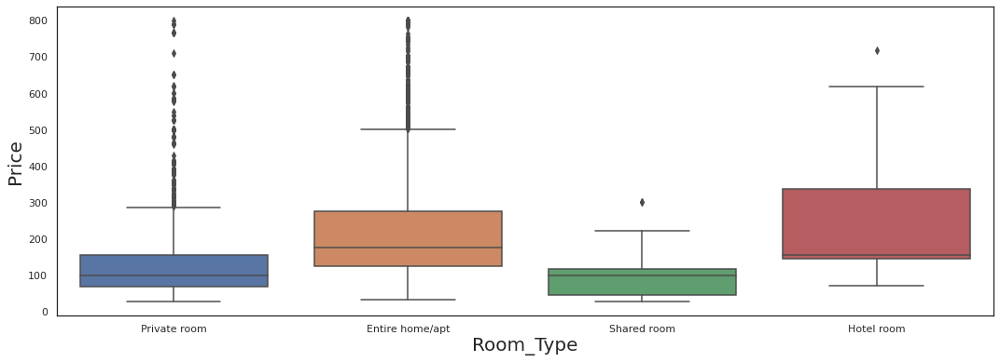

In [904]:
# Room type and Price


plt.figure(figsize=(18, 6))
chart2 = sns.boxplot(x = df["room_type"], y = df["price"])#, palette="Blues");
chart2.set_xticklabels(chart2.get_xticklabels(), rotation=0);
plt.xlabel("Room_Type", size=20)
plt.ylabel("Price", size=20)
plt.show()

In [905]:
# Mapping based on #Bedrooms

fig = px.scatter_mapbox(df,  title = "San Francisco Map", lat="latitude", lon="longitude", color=df['neighbourhood'],  width=1000, height=700, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [906]:
# Define X & y

X_train = df[features].drop(columns='price')
y_train = df['price']

In [907]:
# Split into train & test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

X_train.shape, y_train.shape,  X_test.shape, y_test.shape

((5278, 55), (5278,), (1320, 55), (1320,))

***1 - Using Linear Regression***

***1-1 Baseline***

In [908]:
y_train.describe()

count    5278.000000
mean      190.317923
std       135.453156
min        27.000000
25%        99.000000
50%       149.000000
75%       240.000000
max       800.000000
Name: price, dtype: float64

In [909]:
y_test.describe()

count    1320.000000
mean      187.015152
std       132.512971
min        30.000000
25%        95.000000
50%       149.000000
75%       230.000000
max       799.000000
Name: price, dtype: float64

***The baseline shows :***

average price = $190,

with st_deviation of 135.

This shows that the price distribution has a big spread.

In [910]:
!pip install category_encoders
!pip install --upgrade category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [911]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

# Must put Standard Scaler . later on I need to take out some features based on coef_

linreg = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
    # StandardScaler(), 
    LinearRegression()
)

# Baseline

In [912]:
# Fit the model
linreg.fit(X_train, y_train)
y_pred_lr = linreg.predict(X_test)

In [913]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
baseline = y_train.median()
baseline_error = np.sqrt(mean_squared_error(y_pred=np.ones_like(y_test) * baseline, y_true=y_test))
baseline_error

137.80978326532687

***Coefficients, intercept & metrics***

In [914]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mse_lr = np.round(mean_squared_error(y_test, y_pred_lr),3)
rmse_lr = np.round(np.sqrt(mse_lr),3)
mae_lr = np.round(mean_absolute_error(y_test, y_pred_lr),3)
r2_lr = np.round(r2_score(y_test, y_pred_lr),3)

print('MAE    :', mae_lr)
print('MSE    :', mse_lr)
print('RMSE   :', rmse_lr)
print('R^2 =  :', r2_lr)

MAE    : 67.981
MSE    : 9354.049
RMSE   : 96.716
R^2 =  : 0.467


In [915]:
# Test
# mean_absolute_error(y_test, y_pred_lr) == mean_absolute_error(y_test, linreg.predict(X_test))

In [916]:
lrcoef = linreg.named_steps['linearregression'].coef_
lrcoef

array([ -8.15191461e-02,   4.30208563e-02,   2.39242473e+01,
        -1.56166742e-09,   2.30279212e+01,  -4.86226412e+00,
        -1.17205782e+00,   1.05688876e-04,   3.10268317e-01,
        -3.83661005e-01,  -2.09853435e-07,  -2.17557839e-06,
         1.04256810e+00,   2.40552178e-06,  -5.18696197e-13,
         1.50591498e-01,  -1.48551105e-01,   1.98143049e-01,
        -6.51366211e-02,  -2.31944615e-02,  -7.72591811e-02,
        -2.36456296e-01,   2.86001261e+01,   5.13290823e+00,
         1.88055005e+01,  -2.57769770e+01,  -1.56098149e+01,
         1.13249886e+01,  -2.27578501e+01,   1.28819426e+01,
        -1.33565267e+01,  -1.26689896e+01,  -1.05539141e+01,
        -2.67234194e+00,  -1.48934035e+00,   2.70033884e+01,
         3.55271368e-15,   1.50225737e+01,  -1.25117960e+00,
         5.04451996e+00,  -6.65286485e+00,   3.31134562e+01,
        -1.62573578e+01,   2.94815184e+01,   0.00000000e+00,
         1.10212355e+01,   7.68366760e-01,   3.71039052e-01,
        -8.95546051e+00,

In [917]:
pd.Series(lrcoef, X_train.columns).sort_values(ascending=False).head(20)

Gym                               33.113456
AirCon                            29.481518
review_scores_rating              28.600126
TV                                27.003388
accommodates                      23.924247
bedrooms                          23.027921
bathroom_type                     21.761745
review_scores_cleanliness         18.805501
Breakfast                         15.022574
calculated_host_listings_count    12.881943
review_scores_location            11.324989
Pool                              11.021236
review_scores_accuracy             5.132908
Heating                            5.044520
bathroom_qty                       2.535636
minimum_nights_avg_ntm             1.042568
host_response_time                 0.768367
host_response_rate                 0.371039
minimum_minimum_nights             0.310268
neighbourhood                      0.275186
dtype: float64

In [918]:
# Charting the top-20 coefficients:

df_linreg = pd.Series(lrcoef, X_train.columns, name = 'coef').sort_values(ascending=False).head(20).to_frame()
df_linreg["features"] = df_linreg.index
df_linreg = df_linreg.reset_index().drop(columns = 'index')
df_linreg

,coef,features
0,33.113456,Gym
1,29.481518,AirCon
2,28.600126,review_scores_rating
3,27.003388,TV
4,23.924247,accommodates
5,23.027921,bedrooms
6,21.761745,bathroom_type
7,18.805501,review_scores_cleanliness
8,15.022574,Breakfast
9,12.881943,calculated_host_listings_count


In [919]:
import plotly.graph_objects as go

fig = go.Figure(go.Bar(
            y = df_linreg['coef'],
            x = df_linreg['features'],
            orientation='v')
            )

# fig.update_layout(xaxis={'categoryorder':'category ascending'},  title = 'Linear Regression Coefficients')
fig.update_layout(xaxis={'categoryorder':'max descending'},  title = 'Top-20 Linear Regression Coefficients', width=1000, height=400)


fig.show()

In [920]:
pd.Series(lrcoef, X_train.columns).sort_values(ascending=False).head()

Gym                     33.113456
AirCon                  29.481518
review_scores_rating    28.600126
TV                      27.003388
accommodates            23.924247
dtype: float64

In [921]:
linreg.named_steps['linearregression'].intercept_

# linreg.named_steps['linearregression']

111.92287983217793

***2 - Using RandomForestRegressor***

In [922]:
from sklearn.ensemble import RandomForestRegressor

rfr1 = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='median'), 
    RandomForestRegressor(n_estimators=5, max_features=10, random_state=42)
)

In [923]:
rfr1.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['host_response_time',
                                      'host_response_rate',
                                      'host_verifications', 'neighbourhood',
                                      'property_type', 'room_type',
                                      'bathrooms_text', 'bathroom_qty',
                                      'bathroom_type'],
                                mapping=[{'col': 'host_response_time',
                                          'data_type': dtype('O'),
                                          'mapping': within an hour        1
not_listed            2
within a few hours    3
within a day          4
a few days or more    5
NaN...
3.5           10
0             11
6             12
4.5           13
Half-bath     14
Private       15
not_listed    16
5.5           17
Shared        18
8             19
NaN           -2
dtype: int64},
                                         {'col': 'bathroom_type',
                                          'data_type': dtype('O'),
                                          'mapping': bath          1
shared        2
private       3
baths         4
not_listed    5
half-bath     6
NaN          -2
dtype: int64}])),
                ('simpleimputer', SimpleImputer(strategy='median')),
                ('randomforestregressor',
                 RandomForestRegressor(max_features=10, n_estimators=5,
                                       random_state=42))])

In [924]:
y_pred_rfr1 = rfr1.predict(X_test)

In [925]:
from sklearn.metrics import mean_absolute_error

mse_rfr1 = np.round(mean_squared_error(y_test, y_pred_rfr1),3)
rmse_rfr1 = np.round(np.sqrt(mse_rfr1),3)
mae_rfr1 = np.round(mean_absolute_error(y_test, y_pred_rfr1),3)
r2_rfr1 = np.round(r2_score(y_test, y_pred_rfr1),3)

print('MAE   :', mae_rfr1)
print('MSE   :', mse_rfr1)
print('RMSE  :', rmse_rfr1)
print('R^2 = :', r2_rfr1)

MAE   : 56.439
MSE   : 7699.007
RMSE  : 87.744
R^2 = : 0.561


In [926]:
rfr_important = rfr1.named_steps['randomforestregressor'].feature_importances_  # feature_importances_ is called attributes

rfr_important

array([ 0.02314157,  0.0297974 ,  0.06861643,  0.        ,  0.05179518,
        0.0502763 ,  0.02422192,  0.01542114,  0.02511042,  0.03300009,
        0.01263137,  0.01187249,  0.02413447,  0.01090917,  0.        ,
        0.01161778,  0.02058669,  0.01876878,  0.02136011,  0.02902988,
        0.02815782,  0.0059259 ,  0.01846594,  0.01157419,  0.01495875,
        0.00739128,  0.0092223 ,  0.01441018,  0.01069203,  0.01927622,
        0.00849312,  0.03533089,  0.00152599,  0.03466918,  0.00386389,
        0.00263071,  0.        ,  0.00310517,  0.00350293,  0.00323494,
        0.00475366,  0.00524133,  0.00471595,  0.01158711,  0.        ,
        0.00108348,  0.00980555,  0.00827878,  0.00542114,  0.01923357,
        0.01564731,  0.0317372 ,  0.02798114,  0.05151766,  0.08427353])

In [927]:
fi_rfr = pd.Series(rfr_important, X_train.columns).sort_values(ascending=False).head(20)

fi_rfr

bathroom_type                                   0.084274
accommodates                                    0.068616
bedrooms                                        0.051795
bathroom_qty                                    0.051518
beds                                            0.050276
calculated_host_listings_count_private_rooms    0.035331
reviews_per_month                               0.034669
maximum_minimum_nights                          0.033000
room_type                                       0.031737
host_total_listings_count                       0.029797
number_of_reviews                               0.029030
number_of_reviews_ltm                           0.028158
bathrooms_text                                  0.027981
minimum_minimum_nights                          0.025110
minimum_nights                                  0.024222
minimum_nights_avg_ntm                          0.024134
host_listings_count                             0.023142
availability_365               

In [928]:
# Convert Series into Dataframes
dfi = pd.Series(fi_rfr, name='importance').to_frame()
dfi['features'] = dfi.index

In [929]:
dfi = dfi.reset_index().drop(columns='index')
dfi

,importance,features
0,0.084274,bathroom_type
1,0.068616,accommodates
2,0.051795,bedrooms
3,0.051518,bathroom_qty
4,0.050276,beds
5,0.035331,calculated_host_listings_count_private_rooms
6,0.034669,reviews_per_month
7,0.033000,maximum_minimum_nights
8,0.031737,room_type
9,0.029797,host_total_listings_count


In [930]:
import plotly.graph_objects as go

colors = ['grey',] * 40
colors[8] = 'red'
colors[12] = 'red'
colors[15] = 'red'

fig = go.Figure(go.Bar(
            y=dfi['importance'],
            x=dfi['features'],
            orientation='v',
            marker_color=colors)
            )

fig.update_layout(xaxis={'categoryorder':'max descending'},  title = 'Top-20 Features that Predict the Price', width=1000, height=400)
fig.show()

In [931]:
rfr1.named_steps['randomforestregressor'].estimators_

[DecisionTreeRegressor(max_features=10, random_state=1608637542),
 DecisionTreeRegressor(max_features=10, random_state=1273642419),
 DecisionTreeRegressor(max_features=10, random_state=1935803228),
 DecisionTreeRegressor(max_features=10, random_state=787846414),
 DecisionTreeRegressor(max_features=10, random_state=996406378)]

In [932]:
rfr1.named_steps['randomforestregressor'].base_estimator_

DecisionTreeRegressor()

In [933]:
# Visualisation y_pred & y_test
drfr = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred_rfr1})
drfr

,y_test,y_pred
2155,149.0,201.0
5485,229.0,199.2
2298,285.0,286.2
3316,50.0,56.6
5473,60.0,72.6
...,...,...
4487,136.0,78.2
3899,57.0,59.2
3160,150.0,123.2
6153,79.0,164.6


Let's see the price error distribution.
We see that the most error is on the lowest price.

In [934]:
# Error calculation:

drfr['error'] = abs(drfr['y_test'] - drfr['y_pred'])
# drfr['error']

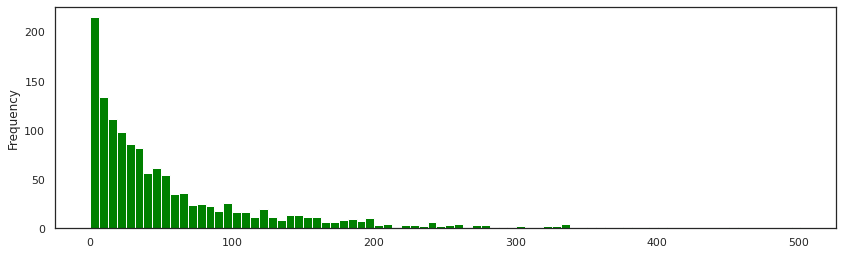

In [935]:
# Error distribution plot
drfr['error'].plot(kind='hist', color='green', bins=80, figsize=(14,4));

In [936]:
drfr[drfr['error']<10]

,y_test,y_pred,error
2298,285.0,286.2,1.2
3316,50.0,56.6,6.6
3442,95.0,88.8,6.2
550,199.0,198.0,1.0
1611,110.0,117.6,7.6
...,...,...,...
5203,117.0,116.0,1.0
5183,95.0,95.8,0.8
3798,177.0,178.8,1.8
425,180.0,189.4,9.4


***RandomForest Regressor to find the best parameters:***

In [937]:
from scipy.stats import randint, uniform
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.pipeline import make_pipeline
import category_encoders as ce
from category_encoders import OneHotEncoder, OrdinalEncoder

pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(), 
    RandomForestRegressor(random_state=42)
)

param_distributions = {
    # 'targetencoder__min_samples_leaf': randint(1, 1000),     # sometimes this doesnt work - weird!!
    'simpleimputer__strategy': ['mean', 'median'], 
    'randomforestregressor__n_estimators': randint(50, 500), 
    'randomforestregressor__max_depth': [4, 7, 10, 15], 
    'randomforestregressor__max_features': uniform(0, 1), 
}


search = RandomizedSearchCV(
    pipeline, 
    param_distributions=param_distributions, 
    n_iter=10, 
    cv=3, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1
)

In [938]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('ordinalencoder',
                                              OrdinalEncoder()),
                                             ('simpleimputer', SimpleImputer()),
                                             ('randomforestregressor',
                                              RandomForestRegressor(random_state=42))]),
                   n_jobs=-1,
                   param_distributions={'randomforestregressor__max_depth': [4,
                                                                             7,
                                                                             10,
                                                                             15],
                                        'randomforestregressor__max_features': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7fb9c0cec310>,
                                        'randomforestregressor__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fb9bfc60370>,
                                        'simpleimputer__strategy': ['mean',
                                                                    'median']},
                   return_train_score=True, scoring='neg_mean_absolute_error',
                   verbose=10)

In [939]:
pipeline.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'ordinalencoder', 'simpleimputer', 'randomforestregressor', 'ordinalencoder__cols', 'ordinalencoder__drop_invariant', 'ordinalencoder__handle_missing', 'ordinalencoder__handle_unknown', 'ordinalencoder__mapping', 'ordinalencoder__return_df', 'ordinalencoder__verbose', 'simpleimputer__add_indicator', 'simpleimputer__copy', 'simpleimputer__fill_value', 'simpleimputer__keep_empty_features', 'simpleimputer__missing_values', 'simpleimputer__strategy', 'simpleimputer__verbose', 'randomforestregressor__bootstrap', 'randomforestregressor__ccp_alpha', 'randomforestregressor__criterion', 'randomforestregressor__max_depth', 'randomforestregressor__max_features', 'randomforestregressor__max_leaf_nodes', 'randomforestregressor__max_samples', 'randomforestregressor__min_impurity_decrease', 'randomforestregressor__min_samples_leaf', 'randomforestregressor__min_samples_split', 'randomforestregressor__min_weight_fraction_leaf', 'randomforestregressor__n_estimato

In [940]:
y_pred_rfr2 = search.predict(X_test)

In [941]:
print('Best hyperparameters', search.best_params_)
print('Cross-validation MAE', -search.best_score_)
model = search.best_estimator_

Best hyperparameters {'randomforestregressor__max_depth': 15, 'randomforestregressor__max_features': 0.29874097175225411, 'randomforestregressor__n_estimators': 158, 'simpleimputer__strategy': 'median'}
Cross-validation MAE 51.703247702


In [942]:
# Best Accuracy for n_iter = 

mse_rfr2 = np.round(mean_squared_error(y_test, y_pred_rfr2),3)
rmse_rfr2 = np.round(np.sqrt(mse_rfr2),3)
mae_rfr2 = np.round(mean_absolute_error(y_test, y_pred_rfr2),3)
r2_rfr2 = np.round(r2_score(y_test, y_pred_rfr2),3)

print('MAE   :', mae_rfr2)
print('MSE   :', mse_rfr2)
print('RMSE  :', rmse_rfr2)
print('R^2 = :', r2_rfr2)

MAE   : 49.013
MSE   : 5856.53
RMSE  : 76.528
R^2 = : 0.666


***Try again RandomForestRegressor with another method, increase n_iter***

In [943]:
from scipy.stats import randint, uniform

pipeline3 = make_pipeline(
    ce.TargetEncoder(), 
    SimpleImputer(), 
    RandomForestRegressor(random_state=42)
)

param_distributions = {
    'targetencoder__min_samples_leaf': randint(1, 1000),     
    'simpleimputer__strategy': ['mean', 'median'], 
    'randomforestregressor__n_estimators': randint(50, 500), 
    'randomforestregressor__max_depth': [3, 5, 7, 10], 
    'randomforestregressor__max_features': uniform(0, 1), 
}

search3 = RandomizedSearchCV(
    pipeline3, 
    param_distributions=param_distributions, 
    n_iter=40, 
    cv=3, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1
)

search3.fit(X_train, y_train);

Fitting 3 folds for each of 40 candidates, totalling 120 fits


In [944]:
y_pred_rfr3 = search3.predict(X_test)

In [945]:
print('Best hyperparameters', search3.best_params_)
print('Cross-validation MAE', -search3.best_score_)

Best hyperparameters {'randomforestregressor__max_depth': 10, 'randomforestregressor__max_features': 0.51793587942643926, 'randomforestregressor__n_estimators': 404, 'simpleimputer__strategy': 'mean', 'targetencoder__min_samples_leaf': 189}
Cross-validation MAE 52.1764803697


In [946]:
mse_rfr3 = np.round(mean_squared_error(y_test, y_pred_rfr3),3)
rmse_rfr3 = np.round(np.sqrt(mse_rfr3),3)
mae_rfr3 = np.round(mean_absolute_error(y_test, y_pred_rfr3),3)
r2_rfr3 = np.round(r2_score(y_test, y_pred_rfr3),3)

print('MAE   :', mae_rfr3)
print('MSE   :', mse_rfr3)
print('RMSE  :', rmse_rfr3)
print('R^2 = :', r2_rfr3)

MAE   : 49.358
MSE   : 5828.859
RMSE  : 76.347
R^2 = : 0.668


In [947]:
pd.DataFrame(search3.cv_results_).sort_values(by='rank_test_score').T

,38,11,31,18,23,36,8,37,5,13,...,4,26,6,39,17,14,29,30,28,12
mean_fit_time,8.329892,4.608339,6.890224,4.444494,13.185036,3.237147,2.478388,12.030304,1.604227,13.712822,...,5.802183,0.894261,2.030366,2.823521,2.644742,0.711094,1.885264,0.865553,1.747036,0.858248
std_fit_time,0.623282,0.208866,0.259779,0.376569,0.095081,0.36376,0.012711,0.159017,0.309113,0.024611,...,0.261605,0.032744,0.155412,0.252141,0.008505,0.103903,0.273963,0.131404,0.058867,0.094432
mean_score_time,0.141138,0.134543,0.231183,0.109819,0.181418,0.130826,0.118686,0.226922,0.068047,0.170617,...,0.152717,0.05225,0.100308,0.081796,0.092927,0.053682,0.058152,0.082377,0.18639,0.101205
std_score_time,0.026577,0.009145,0.010602,0.001453,0.005305,0.007117,0.000282,0.079491,0.005146,0.007227,...,0.028692,0.001816,0.009608,0.003207,0.004209,0.007845,0.002768,0.031323,0.036978,0.030392
param_randomforestregressor__max_depth,10,10,10,10,10,10,10,10,10,10,...,3,3,3,3,3,3,3,3,5,5
param_randomforestregressor__max_features,0.517936,0.341448,0.325078,0.54995,0.884926,0.203371,0.212788,0.782697,0.495226,0.958042,...,0.747406,0.326879,0.345376,0.638816,0.542595,0.431363,0.77166,0.132747,0.043664,0.03377
param_randomforestregressor__n_estimators,404,265,487,170,405,285,255,376,56,384,...,345,142,347,309,360,75,151,147,465,184
param_simpleimputer__strategy,mean,median,mean,median,median,mean,mean,median,mean,median,...,median,median,mean,mean,mean,mean,median,median,mean,median
param_targetencoder__min_samples_leaf,189,302,785,708,627,635,943,828,306,679,...,52,83,656,267,852,951,371,113,804,325
params,"{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...","{'randomforestregressor__max_depth': 10, 'rand...",...,"{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 3, 'rando...","{'randomforestregressor__max_depth': 5, 'rando...","{'randomforestregressor__max_depth': 5, 'rando..."


In [948]:
pipeline3 = search3.best_estimator_
pipeline3

Pipeline(steps=[('targetencoder',
                 TargetEncoder(cols=['host_response_time', 'host_response_rate',
                                     'host_verifications', 'neighbourhood',
                                     'property_type', 'room_type',
                                     'bathrooms_text', 'bathroom_qty',
                                     'bathroom_type'],
                               min_samples_leaf=189)),
                ('simpleimputer', SimpleImputer()),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=10,
                                       max_features=0.51793587942643926,
                                       n_estimators=404, random_state=42))])

In [949]:
rfr1.named_steps['randomforestregressor'].estimators_

[DecisionTreeRegressor(max_features=10, random_state=1608637542),
 DecisionTreeRegressor(max_features=10, random_state=1273642419),
 DecisionTreeRegressor(max_features=10, random_state=1935803228),
 DecisionTreeRegressor(max_features=10, random_state=787846414),
 DecisionTreeRegressor(max_features=10, random_state=996406378)]

***3a - Using XGBRegressor with pipeline***

In [950]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

from matplotlib import pyplot
from xgboost import plot_importance

In [951]:
# XGBRegressor?

In [952]:
xgbreg1 = make_pipeline(
    ce.OrdinalEncoder(),
    XGBRegressor(n_estimators=10, random_state=42, n_jobs=2, max_depth=4,  learning_rate=0.1)
)

xgbreg1.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['host_response_time',
                                      'host_response_rate',
                                      'host_verifications', 'neighbourhood',
                                      'property_type', 'room_type',
                                      'bathrooms_text', 'bathroom_qty',
                                      'bathroom_type'],
                                mapping=[{'col': 'host_response_time',
                                          'data_type': dtype('O'),
                                          'mapping': within an hour        1
not_listed            2
within a few hours    3
within a day          4
a few days or more    5
NaN...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=4, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=10,
                              n_jobs=2, num_parallel_tree=None, predictor=None,
                              random_state=42, ...))])

In [953]:
# Make predictions on the test set
from sklearn.metrics import r2_score

y_pred_xg1 = xgbreg1.predict(X_test)

In [954]:
mse_xg1 = np.round(mean_squared_error(y_test, y_pred_xg1),3)
rmse_xg1 = np.round(np.sqrt(mse_xg1),3)
mae_xg1 = np.round(mean_absolute_error(y_test, y_pred_xg1),3)
r2_xg1 = np.round(r2_score(y_test, y_pred_xg1),3)

print('MAE   :', mae_xg1)
print('MSE   :', mse_xg1)
print('RMSE  :', rmse_xg1)
print('R^2 = :', r2_xg1)

MAE   : 73.581
MSE   : 13746.861
RMSE  : 117.247
R^2 = : 0.217


3b. Using XGBoostRegressor with Data Matrix (MAE & RMSE only)

https://www.datacamp.com/community/tutorials/xgboost-in-python

Only for MAE & RMSE

In [955]:
# This X_train_encoded value will be used for feature importance

encoder = ce.OrdinalEncoder()
imputer = SimpleImputer()
scaler = StandardScaler()

X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

In [956]:
X_train_encoded
# X_train_encoded.isnull().sum()
# X_train_imputed

,host_listings_count,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,...,Pool,host_response_time,host_response_rate,host_verifications,neighbourhood,property_type,room_type,bathrooms_text,bathroom_qty,bathroom_type
608,2,3,6,0.0,2.0,3.0,2,1125,2.0,2.0,...,0,1,1,1,1,1,1,1,1,1
3235,15,15,1,0.0,1.0,1.0,1,90,1.0,1.0,...,0,1,1,2,2,2,2,2,2,2
5647,3,3,1,0.0,1.0,1.0,30,90,30.0,30.0,...,1,2,2,2,2,3,3,3,1,3
4028,23,26,4,0.0,2.0,3.0,30,365,30.0,30.0,...,0,1,3,2,3,4,1,1,1,1
3216,12,12,2,0.0,1.0,1.0,1,1125,1.0,1.0,...,0,1,1,2,4,5,2,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3888,7,7,2,0.0,1.0,1.0,1,28,1.0,1.0,...,0,1,1,2,4,2,3,1,1,1
5337,4559,4960,2,0.0,1.0,1.0,31,1125,360.0,360.0,...,1,1,4,1,2,4,1,1,1,1
5372,1,1,5,0.0,2.0,4.0,30,60,30.0,30.0,...,0,1,1,2,14,4,1,1,1,1
5540,118,136,2,0.0,1.0,1.0,2,6,2.0,2.0,...,0,3,4,2,4,4,1,1,1,1


In [957]:
# convert the dataset into an optimized data structure called Dmatrix

data_dmatrix = xgb.DMatrix(data = X_train_encoded,label=y_train) ## this is called d_train, not d_test

dtest = xgb.DMatrix(X_test_encoded, label=y_test)

In [958]:
X_test_encoded.shape

(1320, 55)

In [959]:
X_train_encoded.shape, y_train.shape

((5278, 55), (5278,))

In [960]:
# K-fold X-validation. 


k=5
params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 10, 'alpha': 10}

# This cv_results contains train and test RMSE metrics for each boosting round

cv_results_mae = xgb.cv(dtrain=data_dmatrix, params=params, nfold=k,
                    num_boost_round=50,early_stopping_rounds=10,metrics="mae", as_pandas=True, seed=123)

cv_results_rmse = xgb.cv(dtrain=data_dmatrix, params=params, nfold=k,
                    num_boost_round=50,early_stopping_rounds=10,metrics='rmse'  , as_pandas=True, seed=123)      

# cv_results_rmse = xgb.cv(dtrain=data_dmatrix, params=params, nfold=k,
#                     num_boost_round=50,early_stopping_rounds=10,metrics='error'  , as_pandas=True, seed=123)      


# We can also use - metric=list() -  meaning:  use all possible metrics
cv_results_list = xgb.cv(dtrain=data_dmatrix, params=params, nfold=k,
                    num_boost_round=50,early_stopping_rounds=10,metrics=list()  , as_pandas=True, seed=123)

In [961]:
# cv_results_mae.tail()
# cv_results_rmse.tail()
cv_results_list.tail()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
45,23.694424,0.909677,79.794840,2.249112
46,23.116004,0.857967,79.694802,2.268826
47,22.544030,0.826654,79.629342,2.250960
48,22.005008,0.841092,79.559502,2.245979
49,21.521377,0.800594,79.497809,2.233508


In [962]:
# Final RMSE: get the lowest train-RMSE value

print(cv_results_mae.tail(1))
print()
print(cv_results_rmse.tail(1))

    train-mae-mean  train-mae-std  test-mae-mean  test-mae-std
49       13.861972        0.42889      49.171981      1.627804

    train-rmse-mean  train-rmse-std  test-rmse-mean  test-rmse-std
49        21.521377        0.800594       79.497809       2.233508


***3c. Using XGBoostRegressor without pipeline***

In [963]:
xg2 = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 20, alpha = 10, n_estimators = 70)

In [964]:
xg2.fit(X_train_encoded,y_train)

[20:18:16] WARNING: ../src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.3, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=20, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=70, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', ...)

In [965]:
y_pred_xg2 = xg2.predict(X_test_encoded)

In [966]:
mse_xg2 = np.round(mean_squared_error(y_test, y_pred_xg2),3)
rmse_xg2 = np.round(np.sqrt(mse_xg2),3)
mae_xg2 = np.round(mean_absolute_error(y_test, y_pred_xg2),3)
r2_xg2 =  np.round(r2_score(y_test, y_pred_xg2),3)

print('MAE   :', mae_xg2)
print('MSE   :', mse_xg2)
print('RMSE  :', rmse_xg2)
print('R^2 = :', r2_xg2)

MAE   : 48.675
MSE   : 6063.422
RMSE  : 77.868
R^2 = : 0.654


***Visualize Boosting Trees and Feature Importance with XGB***

In [967]:
xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

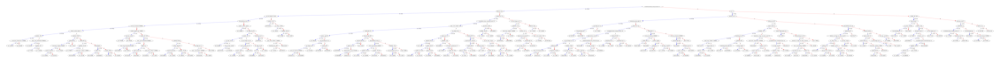

<Figure size 3600x3600 with 0 Axes>

In [968]:
# Plot the 1st tree

xgb.plot_tree(xg_reg,num_trees=1)
# plt.rcParams['figure.figsize'] = [70, 70]
plt.figure(figsize=(50,50));
plt.show()

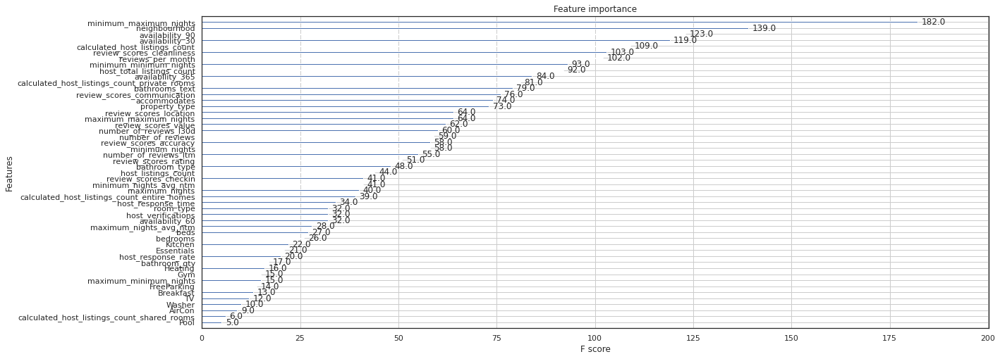

In [969]:
# XGBoost has a plot_importance() function . easy.

xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [5, 10]
plt.show();

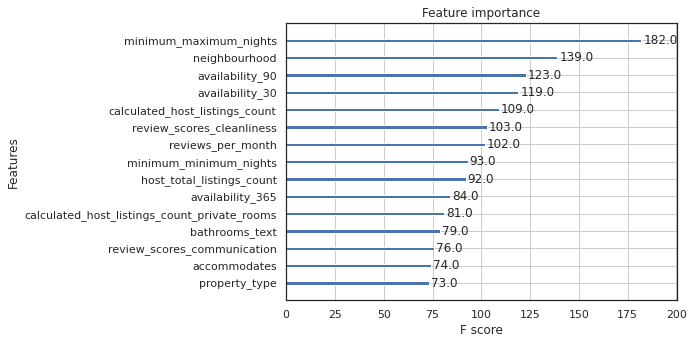

In [970]:
# XGBoost has a plot_importance() function . easy.

ax3 = xgb.plot_importance(xg_reg, max_num_features=15)
fig = ax3.figure
fig.set_size_inches(7,5);

***Trying to get XGB Hyper Parameter***

https://machinelearningmastery.com/data-preparation-gradient-boosting-xgboost-python/

In [971]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder


# encoder = LabelEncoder()
encoder = OrdinalEncoder()

X_train_xg4 = encoder.fit_transform(X_train)
X_test_xg4 = encoder.fit_transform(X_test)
# y_test_xg4 = encoder.fit_transform(y_test)

xgb4 = XGBRegressor()


param_distributions = {
        'max_depth': (3, 4, 5, 6, 7, 8, 9, 10, 11, 12),
        'min_child_weight': np.arange(0.0001, 0.5, 0.001),
        'gamma': np.arange(0.0,40.0,0.005),
        'learning_rate': np.arange(0.0005,0.3,0.0005),
        'subsample': np.arange(0.01,1.0,0.01),
        'colsample_bylevel': np.round(np.arange(0.1,1.0,0.01)),
        'colsample_bytree': np.arange(0.1,1.0,0.01),
}

search4 = RandomizedSearchCV(
    xgb4, 
    param_distributions=param_distributions, 
    n_iter=50, 
    cv=3, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1
)

In [972]:
xgb4.fit(X_train_xg4, y_train) ## without optim

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [973]:
search4.fit(X_train_xg4, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
        0.37,  0.38,  0.39,  0.4 ,  0.41,  0.42,  0.43,  0.44,  0.45,
        0.46,  0.47,  0.48,  0.49,  0.5 ,  0.51,  0.52,  0.53,  0.54,
        0.55,  0.56,  0.57,  0.58,  0.59,  0.6 ,  0.61,  0.62,  0.63,
        0.64,  0.65,  0.66,  0.67,  0.68,  0.69,  0.7 ,  0.71,  0.72,
        0.73,  0.74,  0.75,  0.76,  0.77,  0.78,  0.79,  0.8 ,  0.81,
        0.82,  0.83,  0.84,  0.85,  0.86,  0.87,  0.88,  0.89,  0.9 ,
        0.91,  0.92,  0.93,  0.94,  0.95,  0.96,  0.97,  0.98,  0.99])},
                   return_train_score=True, scoring='neg_mean_absolute_error',
                   verbose=10)

In [974]:
y_pred_xg4 = search4.predict(X_test_xg4)

In [975]:
optim_result = search4.fit(X_train_xg4, y_train)

# summarize results
print("Best: %f using %s" % (optim_result.best_score_, optim_result.best_params_))
means = optim_result.cv_results_[ 'mean_test_score' ]
stds = optim_result.cv_results_[ 'std_test_score' ]
params = optim_result.cv_results_[ 'params' ]

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best: -49.358711 using {'subsample': 0.93000000000000005, 'min_child_weight': 0.22509999999999999, 'max_depth': 6, 'learning_rate': 0.088000000000000009, 'gamma': 23.550000000000001, 'colsample_bytree': 0.90999999999999959, 'colsample_bylevel': 1.0}


In [976]:
params

[{'subsample': 0.16,
  'min_child_weight': 0.083100000000000007,
  'max_depth': 3,
  'learning_rate': 0.19700000000000001,
  'gamma': 24.365000000000002,
  'colsample_bytree': 0.48999999999999977,
  'colsample_bylevel': 0.0},
 {'subsample': 0.37,
  'min_child_weight': 0.058100000000000006,
  'max_depth': 7,
  'learning_rate': 0.158,
  'gamma': 26.490000000000002,
  'colsample_bytree': 0.62999999999999967,
  'colsample_bylevel': 1.0},
 {'subsample': 0.75,
  'min_child_weight': 0.43209999999999998,
  'max_depth': 11,
  'learning_rate': 0.0545,
  'gamma': 24.655000000000001,
  'colsample_bytree': 0.34999999999999987,
  'colsample_bylevel': 0.0},
 {'subsample': 0.68000000000000005,
  'min_child_weight': 0.1731,
  'max_depth': 7,
  'learning_rate': 0.18149999999999999,
  'gamma': 16.48,
  'colsample_bytree': 0.66999999999999971,
  'colsample_bylevel': 1.0},
 {'subsample': 0.52000000000000002,
  'min_child_weight': 0.49409999999999998,
  'max_depth': 4,
  'learning_rate': 0.218,
  'gamma': 1

In [977]:
means

array([ -62.22253782,  -53.58971924,  -57.58836632,  -51.83273245,
        -53.05307269,  -57.9318022 ,  -65.20507457,  -52.32912664,
        -62.4803694 , -150.20778721,  -52.98913505,  -69.801302  ,
        -54.5011085 ,  -54.95140232,  -58.20617594,  -80.23262169,
        -51.03827683,  -69.65178678,  -57.19617551,  -54.03213762,
        -49.7018412 ,  -54.22282932,  -54.39814669,  -58.54484389,
        -73.99298824,  -55.29411337, -210.78950214,  -51.91268556,
        -53.54215882,  -56.03146846,  -53.3790249 ,  -55.09125717,
        -62.83962585,  -50.77619151,  -49.69880731,  -62.39612764,
        -68.66542463,  -58.83623764,  -53.41844676,  -60.19769562,
        -74.0764037 ,  -55.26042751, -171.96737062,  -62.07569621,
        -55.89636415,  -62.39327794,  -49.35871104,  -67.08060966,
        -51.46366463,  -60.08943881])

In [978]:
# Merics

mse_xg4 = np.round(mean_squared_error(y_test, y_pred_xg4),3)
rmse_xg4 = np.round(np.sqrt(mse_xg4),3)
mae_xg4 = np.round(mean_absolute_error(y_test, y_pred_xg4),3)
r2_xg4 =  np.round(r2_score(y_test, y_pred_xg4),3)

print('MAE   :', mae_xg4)
print('MSE   :', mse_xg4)
print('RMSE  :', rmse_xg4)
print('R^2 = :', r2_xg4)

MAE   : 65.859
MSE   : 8874.972
RMSE  : 94.207
R^2 = : 0.494


In [979]:
# Compare with the TRAINING metric

print('Training MAE:', mean_absolute_error(y_train, search4.predict(X_train_xg4)))

Training MAE: 30.4154478054


In [980]:
# XGB feature_importances_
# https://machinelearningmastery.com/feature-importance-and-feature-selection-with-xgboost-in-python/

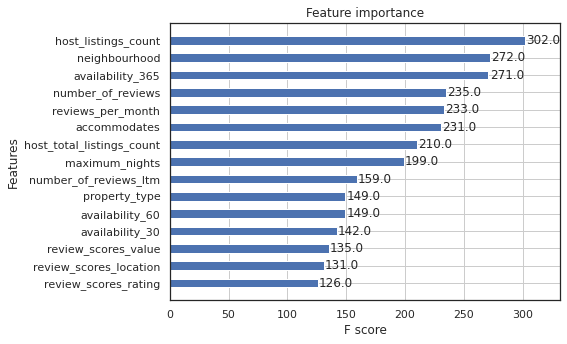

In [981]:
# PLOTTING, can be done in many ways:

# plot_importance(xgb4, max_num_features=15, height=0.5)#, xlim=(0,10), ylim=(0,10))
# # fig.set_size_inches(4,2);
# pyplot.show()

# or

ax4 = plot_importance(xgb4, max_num_features=15, height=0.5)#, 
fig  = ax4.figure
fig.set_size_inches(7,5);

# or 

# ax4 = xgb.plot_importance(xgb4, max_num_features=15)
# fig = ax4.figure
# fig.set_size_inches(7,5);

In [982]:
# search4.feature_importances_

***Which model is the best?***

The best ML model in this dataset is: lowest MAE and biggest R2

In [983]:
# Create dataframe out of all metrics

Model = ['LinearRegression', 'RFRegression_1', 'RFRegression_2', 'RFRegression_3', 'XGB_1',  'XGB_2' , 'XGB_3']
MAE = [mae_lr, mae_rfr1, mae_rfr2, mae_rfr3, mae_xg1, mae_xg2, mae_xg4]
MSE = [mse_lr, mse_rfr1, mse_rfr2, mse_rfr3, mse_xg1, mse_xg2, mse_xg4]
RMSE = [rmse_lr, rmse_rfr1, rmse_rfr2, rmse_rfr3, rmse_xg1, rmse_xg2, rmse_xg4]
R2 = [r2_lr, r2_rfr1, r2_rfr2, r2_rfr3, r2_xg1, r2_xg2, r2_xg4]
Parameter = ['static', 'static', 'static', 'optimized', 'static', 'static', 'opimized' ]

cols = {'Model':Model, 'MAE':MAE ,  'MSE': MSE,  'RMSE': RMSE, 'R2': R2, 'Parameter': Parameter}

metric1 = pd.DataFrame(cols)
# metric1 = pd.DataFrame(cols, index = ['LinearRegression', 'RFRegression', 'RFRegression_best', 'XGB'])

metric1

,Model,MAE,MSE,RMSE,R2,Parameter
0,LinearRegression,67.981,9354.049,96.716,0.467,static
1,RFRegression_1,56.439,7699.007,87.744,0.561,static
2,RFRegression_2,49.013,5856.530,76.528,0.666,static
3,RFRegression_3,49.358,5828.859,76.347,0.668,optimized
4,XGB_1,73.581,13746.861,117.247,0.217,static
5,XGB_2,48.675,6063.422,77.868,0.654,static
6,XGB_3,65.859,8874.972,94.207,0.494,opimized


In [984]:
Best_model = metric1.tail(5)
Best_model

,Model,MAE,MSE,RMSE,R2,Parameter
2,RFRegression_2,49.013,5856.530,76.528,0.666,static
3,RFRegression_3,49.358,5828.859,76.347,0.668,optimized
4,XGB_1,73.581,13746.861,117.247,0.217,static
5,XGB_2,48.675,6063.422,77.868,0.654,static
6,XGB_3,65.859,8874.972,94.207,0.494,opimized


In [985]:
metric1[metric1['MAE']<48.9]

,Model,MAE,MSE,RMSE,R2,Parameter
5,XGB_2,48.675,6063.422,77.868,0.654,static


***PDP-Plot***

In [986]:
plt.rcParams['figure.dpi'] = 72

In [987]:
!pip install -U setuptools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [988]:
!pip install pip==21.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [989]:
!pip install PDPbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.1.1-cp39-cp39-linux_x86_64.whl
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.3
    Uninstalling matplotlib-3.6.3:
      Successfully uninstalled matplotlib-3.6.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.10.1 requires matplotlib>=3.5.0, but you have matplotlib 3.1.1 which is incompatible.
pandas-profiling 3.2.0 requires matplotlib>=3.2.0, but you have matplotlib 3.1.1 which is incompatible.
mizani 0.8.1 requires matplotlib>=3.5.0, but you have matplotlib 3.1.1 which is incompatible.
arviz 0.15.1 requires matplotlib>=3.2, but you have matplotlib 3.1.1 which is incompatible.


In [990]:
# import matplotlib
# print(matplotlib.__version__)

In [991]:
!pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.7.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.1.1
    Uninstalling matplotlib-3.1.1:
      Successfully uninstalled matplotlib-3.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pdpbox 0.2.1 requires matplotlib==3.1.1, but you have matplotlib 3.7.1 which is incompatible.
basemap 1.3.6 requires matplotlib<3.7,>=1.5; python_version >= "3.5", but you have matplotlib 3.7.1 which is incompatible.


In [992]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature_xgbr = 'accommodates'

isolated = pdp_isolate(
    model=xgbreg1,
    dataset=X_test,
    model_features=X_test.columns,
    feature=feature_xgbr
)

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <Axes: >, 'pdp_ax': <Axes: xlabel='accommodates'>})

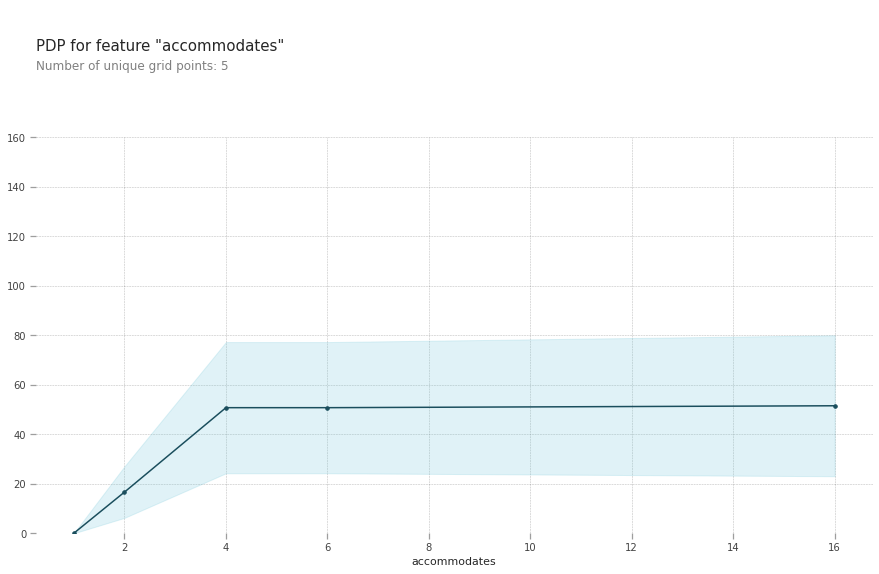

In [993]:
pdp_plot(isolated, feature_name=feature_xgbr)

***PDP-Plot with 2 features***

In [994]:
from pdpbox.pdp import pdp_interact, pdp_interact_plot

features2a = ['bedrooms', 'accommodates']

interaction = pdp_interact(
    model=xgbreg1,
    dataset=X_test,
    model_features=X_test.columns,
    features=features2a
)

AttributeError: ignored

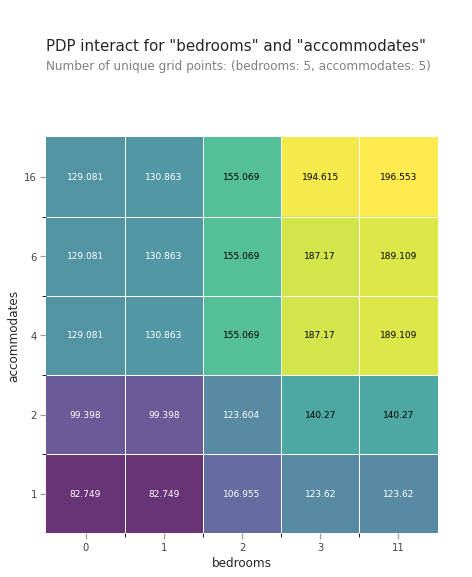

In [995]:
pdp_interact_plot(interaction, plot_type='grid', feature_names=features2a);

Shapley Value

In [996]:
# Let's limit the features into:

# feature_sh = ['host_listings_count',
#               'number_of_reviews',
#               'host_total_listings_count'
# , 'availability_365', 'maximum_nights', 
# 'availability_30', 'availability_60', 
# 'review_scores_rating', 
# 'reviews_per_month', 'accommodates',  
# 'bedrooms', 'beds']

feature_sh = ['accommodates', 'host_listings_count', 'number_of_reviews', 'maximum_nights', 'review_scores_rating', 
              'bedrooms', 'beds', 'reviews_per_month']

In [997]:
# Define X & y

X_train = df[feature_sh]
y_train = df['price']

In [998]:
# Split into train & test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

X_train.shape, y_train.shape,  X_test.shape, y_test.shape

((5278, 8), (5278,), (1320, 8), (1320,))

In [999]:
# I want to compare between xgbreg1 & xgbreg2.  Pipeline and non-pipeline

xgbreg1 = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    XGBRegressor(n_estimators=100, random_state=42, n_jobs=2, max_depth=4,  learning_rate=0.1)
)

xgbreg1.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder', OrdinalEncoder(cols=[], mapping=[])),
                ('simpleimputer', SimpleImputer()),
                ('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=4, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=2, num_parallel_tree=None, predictor=None,
                              random_state=42, ...))])

In [1000]:
# encoder = ce.OrdinalEncoder()
# X_train_encoded = encoder.fit_transform(X_train)
# X_test_encoded = encoder.transform(X_test)

xgbreg2 = XGBRegressor(n_estimators=100, 
                       random_state=42, 
                       n_jobs=2, 
                       max_depth=4,  
                       learning_rate=0.1)

xgbreg2.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=2, num_parallel_tree=None, predictor=None,
             random_state=42, ...)

In [1001]:
X_train.isnull().sum()

accommodates            0
host_listings_count     0
number_of_reviews       0
maximum_nights          0
review_scores_rating    0
bedrooms                0
beds                    0
reviews_per_month       0
dtype: int64

In [1002]:
# Show particular features 

row = X_test.iloc[[1]]
row

,accommodates,host_listings_count,number_of_reviews,maximum_nights,review_scores_rating,bedrooms,beds,reviews_per_month
5485,2,1,0,60,0.0,1.0,1.0,0.0


In [1003]:
# What was the actual rent for this airbnb?
y_test.iloc[[1]]

5485    229.0
Name: price, dtype: float64

In [1004]:
# What does the model predict for this airbnb?
xgbreg2.predict(row)

array([ 162.16695], dtype=float32)

In [1005]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1006]:
import shap 

explainer = shap.TreeExplainer(xgbreg2)
shap_values = explainer.shap_values(row)

# load JS visualization code to notebook
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value,
    shap_values=shap_values,
    features=row
)

***Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue***

***Using the predict function***

In [1007]:
def predict(Accommodates, Host_Listings_Count, Number_Of_Reviews, Maximum_Nights, Review_Scores_Rating, Bedrooms, Beds, Reviews_per_Month):

    # Make dataframe from the inputs
    dshap = pd.DataFrame(
        data=[[Accommodates, Host_Listings_Count, Number_Of_Reviews, Maximum_Nights, Review_Scores_Rating, Bedrooms, Beds, Reviews_per_Month]], 
        columns=['accommodates', 'host_listings_count', 'number_of_reviews', 'maximum_nights', 'review_scores_rating', 
              'bedrooms', 'beds', 'reviews_per_month']
    )

    # Get the model's prediction
    pred = xgbreg2.predict(dshap)[0]

    # Calculate shap values
    explainer = shap.TreeExplainer(xgbreg2)
    shap_values = explainer.shap_values(dshap)

    # Get series with shap values, feature names, & feature values
    feature_names = dshap.columns
    feature_values = dshap.values[0]
    shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))

    # Print results
    result = f'${pred:,.0f} estimated rent for this SF_airbnb. \n\n'
    #result += f'Starting from baseline of ${explainer.expected_value:,.0f} \n'
    result += shaps.to_string()
    print(result)


    # Show shapley values force plot
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values, 
        features=dshap
    )

In [1008]:
row

,accommodates,host_listings_count,number_of_reviews,maximum_nights,review_scores_rating,bedrooms,beds,reviews_per_month
5485,2,1,0,60,0.0,1.0,1.0,0.0


In [1009]:
listing_data_95.reviews_per_month.max()

36.490000000000002

In [1010]:
# features: Accommodates, Host_Listings_Count, Number_Of_Reviews, Maximum_Nights, Review_Scores_Rating, Bedrooms, Beds, Reviews_per_Month
predict(2, 1, 300, 50, 4.5, 2.0, 2.0, 36.49)

$130 estimated rent for this SF_airbnb. 

(accommodates, 2.0)           -20.599365
(host_listings_count, 1.0)      5.113671
(number_of_reviews, 300.0)      2.035045
(maximum_nights, 50.0)         -0.770046
(review_scores_rating, 4.5)   -32.169952
(bedrooms, 2.0)                26.384684
(beds, 2.0)                     1.418889
(reviews_per_month, 36.49)    -42.086887


In [1011]:
# features: Accommodates, Host_Listings_Count, Number_Of_Reviews, Maximum_Nights, Review_Scores_Rating, Bedrooms, Beds, Reviews_per_Month
predict(2, 1, 300, 14, 6.5, 1.0, 1.0, 36.49)

$152 estimated rent for this SF_airbnb. 

(accommodates, 2.0)           -21.155603
(host_listings_count, 1.0)      9.256778
(number_of_reviews, 300.0)      1.892383
(maximum_nights, 14.0)         13.471253
(review_scores_rating, 6.5)    27.866648
(bedrooms, 1.0)               -23.380276
(beds, 1.0)                    -0.671651
(reviews_per_month, 36.49)    -45.821915


***Attachment***

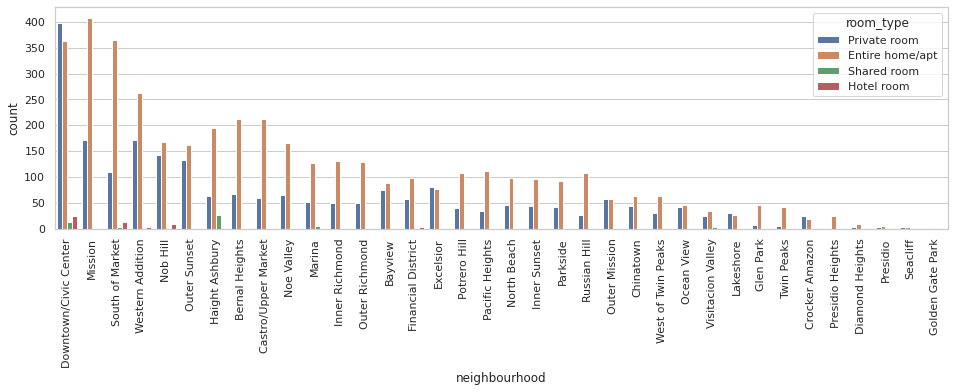

In [1012]:
# Neighborhood & Room type

from seaborn import countplot

sns.set_style('whitegrid', {'axes.linewidth': 0.5}) # only: white, dark, whitegrid, darkgrid, ticks
plt.figure(figsize=(16,4))

chart = sns.countplot(x ='neighbourhood',  data = df, hue='room_type', order= df['neighbourhood'].value_counts().index)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90);

In [1013]:
filtered_df = listing_data_95[[ "host_is_superhost","host_listings_count", "neighbourhood", "property_type","room_type", "accommodates", "bedrooms", 
               "beds", "price", "number_of_reviews", "review_scores_rating", 
               "reviews_per_month"]]
room_type = pd.get_dummies(filtered_df.room_type).astype(int)
filtered_df = filtered_df.drop(['room_type'], axis = 1)
filtered_df = pd.concat((filtered_df, room_type, room_type), axis = 1)
filtered_df
X, y = clean_data(filtered_df)

In [1014]:
from sklearn.model_selection import train_test_split

In [1015]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state=42)

In [1016]:
X_train.head()

,host_is_superhost,host_listings_count,accommodates,bedrooms,beds,number_of_reviews,review_scores_rating,reviews_per_month,Entire home/apt,Hotel room,...,property_type_Room in boutique hotel,property_type_Room in hostel,property_type_Room in hotel,property_type_Room in serviced apartment,property_type_Shared room in bed and breakfast,property_type_Shared room in home,property_type_Shared room in hostel,property_type_Shared room in hotel,property_type_Shared room in loft,property_type_Tiny home
1952,0,2,3,1.0,1.0,167,4.81,3.00,0,0,...,0,0,0,0,0,0,0,0,0,0
4715,1,2,2,1.0,1.0,113,4.90,6.92,0,0,...,0,0,0,0,0,0,0,0,0,0
6418,0,1,7,3.0,4.0,1,5.00,1.00,1,0,...,0,0,0,0,0,0,0,0,0,0
3010,0,49,1,1.0,1.0,132,4.53,2.99,0,0,...,0,0,0,0,0,0,0,0,0,0
5645,0,1,1,1.0,1.0,10,5.00,2.17,0,0,...,0,0,0,0,0,0,0,0,0,0


In [1017]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

In [1018]:
from sklearn.metrics.pairwise import normalize
lm_model = LinearRegression() # Instantiate
lm_model.fit(X_train, y_train) #Fit

LinearRegression()

In [1019]:
#Predict and score the model
y_train_preds = lm_model.predict(X_train)
print("The r-squared score for the model on the training data was {} on {} values. The RMSE was {}".format(r2_score(y_train, y_train_preds), len(y_train), mean_squared_error(y_train, y_train_preds)))
y_test_preds = lm_model.predict(X_test) 
print("The r-squared score for the model on the test data was {} on {} values.  The RMSE was {}".format(r2_score(y_test, y_test_preds), len(y_test), mean_squared_error(y_test, y_test_preds)))

The r-squared score for the model on the training data was 0.5160087554989568 on 3119 values. The RMSE was 6146.1470703108835
The r-squared score for the model on the test data was 0.5044524273499816 on 1337 values.  The RMSE was 6414.029952790538


**Visualize the model and its performance**

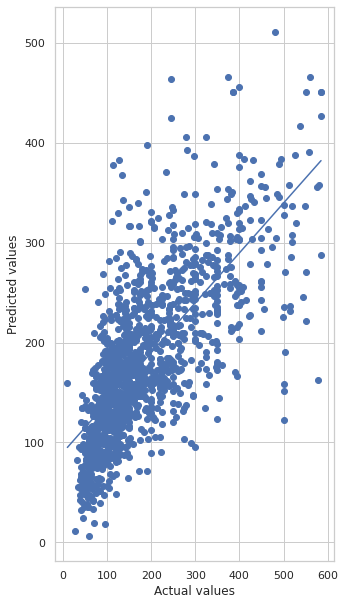

In [1020]:
plt.scatter(y_test, y_test_preds)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, y_test_preds, 1))(np.unique(y_test)))

To better visualise the data, I created a chart that shows the actual values against the predicted values on the same planes.

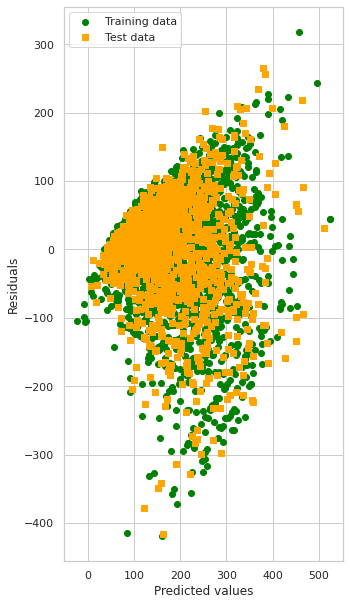

In [1021]:
plt.scatter(y_train_preds,  y_train_preds - y_train,
            c='green', marker='o', label='Training data')
plt.scatter(y_test_preds,  y_test_preds - y_test,
            c='orange', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.show()

As illustrated in the above diagrams, the prediction model is not too far from the actual results.

In [1022]:
y_test

1859    199.0
2721     88.0
724      99.0
1178    100.0
976     225.0
        ...  
3236     66.0
2019    200.0
3322     73.0
3455    240.0
2971    144.0
Name: price, Length: 1337, dtype: float64

In [1023]:
y_test_preds

array([ 156.61047193,  206.30996083,  117.37520383, ...,  112.4736006 ,
        183.4105281 ,  213.46237838])

In [1024]:
listing_data_95.columns

Index(['listing_id', 'host_id', 'host_name', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_listings_count', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month',
       'host_months', 'bathroom_qty'

In [1025]:
listing_data_95[['review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']]

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,4.68,4.78,4.45,4.86,4.81,4.81,4.66
1,4.86,4.93,4.92,4.95,4.88,4.98,4.76
2,4.88,4.85,4.87,4.89,4.85,4.77,4.68
3,4.67,4.44,4.44,4.78,4.78,4.67,4.67
4,4.87,4.88,5.00,4.94,5.00,4.94,4.75
...,...,...,...,...,...,...,...
6784,4.95,4.97,4.98,4.98,4.98,4.84,4.84
6785,4.57,4.42,4.85,4.84,4.71,4.87,4.19
6786,4.91,4.94,4.97,4.96,4.97,4.90,4.77
6787,4.91,4.91,4.91,4.97,4.98,4.75,4.86


In [1026]:
## Determining the quartile ranges of the 'price' variable 

listing.price.quantile([0.25,0.5,0.75])

0.25    100.0
0.50    150.0
0.75    250.0
Name: price, dtype: float64

# Now that we've analyzed multiple aspects of the data set, let's combine all the import features we found and utilize scikit learn to predict prices

In [1027]:
listing_data_95.to_csv('cleaned_detailed_listings.csv',index=False)

***What are the locations that people rent Airbnb?***

First I would like to have a visual inspection of how the data looks on the map

***Some map visualizations***

The density of all locations is plotted as a heatmap.

In [1028]:
def display_listing_heatmap(df):
    '''
    Use folium library to generate and display an interactive heatmap of the Airbnb listings.

    INPUT: Airbnb listing pandas DataFrame containing latitude and longitude
    OUTPUT: None
    '''
    import folium
    from folium.plugins import HeatMap
    m=folium.Map([37.76,-122.44,],zoom_start=13)
    HeatMap(df[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
    display(m)
display_listing_heatmap(listing_data_95)

The prices are plotted on the map as colored dots.

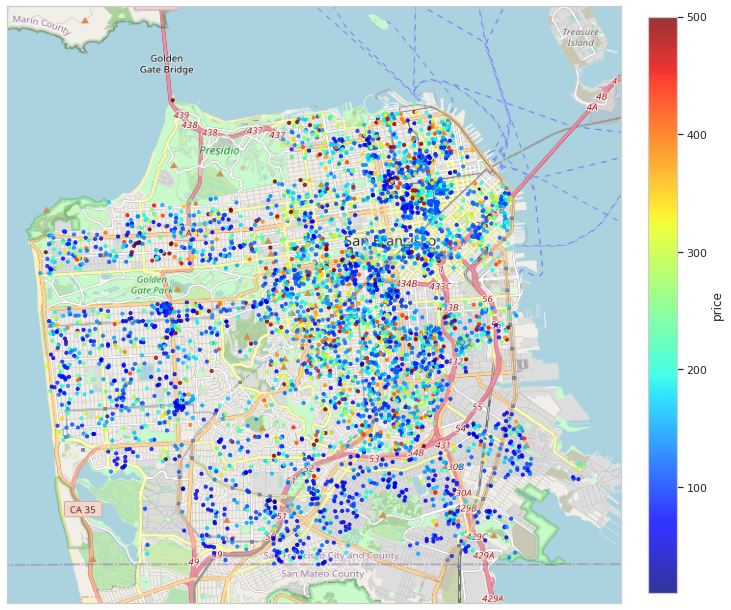

In [1029]:
def display_price_on_map(df):
    '''
    Show listing price as colored dots on map.
    
    INPUT: Airbnb listing pandas DataFrame containing 'longitude', 'latitude', and 'price' columns.
    OUTPUT: None
    Dependence: Needs the map image of SF, longitude range (-122.52,-122.3594) and latitude range(37.7,37.83),
                Can be generated by OpenStreet API.

    '''
    BBox = [-122.52,-122.3594,37.7,37.83]
    north_CA_map = plt.imread('SF_map.png')
    fig, ax = plt.subplots(figsize = (12,12))
    xbins = np.arange(BBox[0],BBox[1]+0.001, 0.001)
    ybins = np.arange(BBox[2],BBox[3]+0.001, 0.001)

    #ax.hist2d('longitude', 'latitude', bins = [xbins,ybins], data = df, cmap = 'winter', cmin = 2)
    im = ax.scatter(df.longitude, df.latitude, zorder=1, alpha= 0.8, c = df.price, cmap = plt.get_cmap('jet'), 
                    s=10 ,vmax = 500)
    fig.colorbar(im, ax = ax, fraction = 0.043, pad = 0.04, label = 'price')
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])

    ax.imshow(north_CA_map, zorder=0, extent = BBox, aspect= 1.2)
    plt.xticks([])
    plt.yticks([]);
display_price_on_map(listing_data_95)

We can see that the higher priced listings are mostly in the central areas and houses very close to the coast.

***How does neighborhood affect pricing?***

Which neighbourhoods have the highest number of hosts and what is the price distribution of each neighborhood?

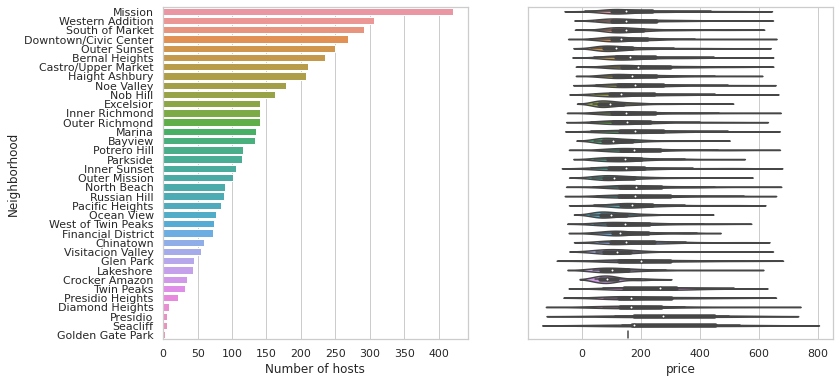

In [1030]:
def display_neighbour(df):
    '''
    Displays a bar plot showing the five neighbourhood with highest listing counts, 
    and the violin plot of the price distribution within the neighbourhood
    
    INPUT: Airbnb listing pandas DataFrame with columns 'neighbourhood_cleansed', 'price'.
    OUTPUT: None
    '''
    sns.set(style = 'whitegrid')
    neighbour_list = df.neighbourhood.value_counts()[0:36]
    neighbour_count = np.array(neighbour_list)
    neighbour_list = np.array(neighbour_list.index)
    fig, ax = plt.subplots(1,2,figsize = (12,6))

    sns.barplot(x = neighbour_count, y = neighbour_list, ax = ax[0])
    df_sub = df.query('neighbourhood in @neighbour_list and price < 600')

    sns.violinplot(data = df_sub, y='neighbourhood', x ='price',order = neighbour_list, ax = ax[1]);
    #plt.xticks(rotation = 20)
    ax[0].set_ylabel('Neighborhood')
    ax[0].set_xlabel('Number of hosts')
    ax[1].set_ylabel('')
    ax[1].set_yticks([]);
display_neighbour(listing_data_95)

The following plot shows the locations in these neighbourhoods on the map.

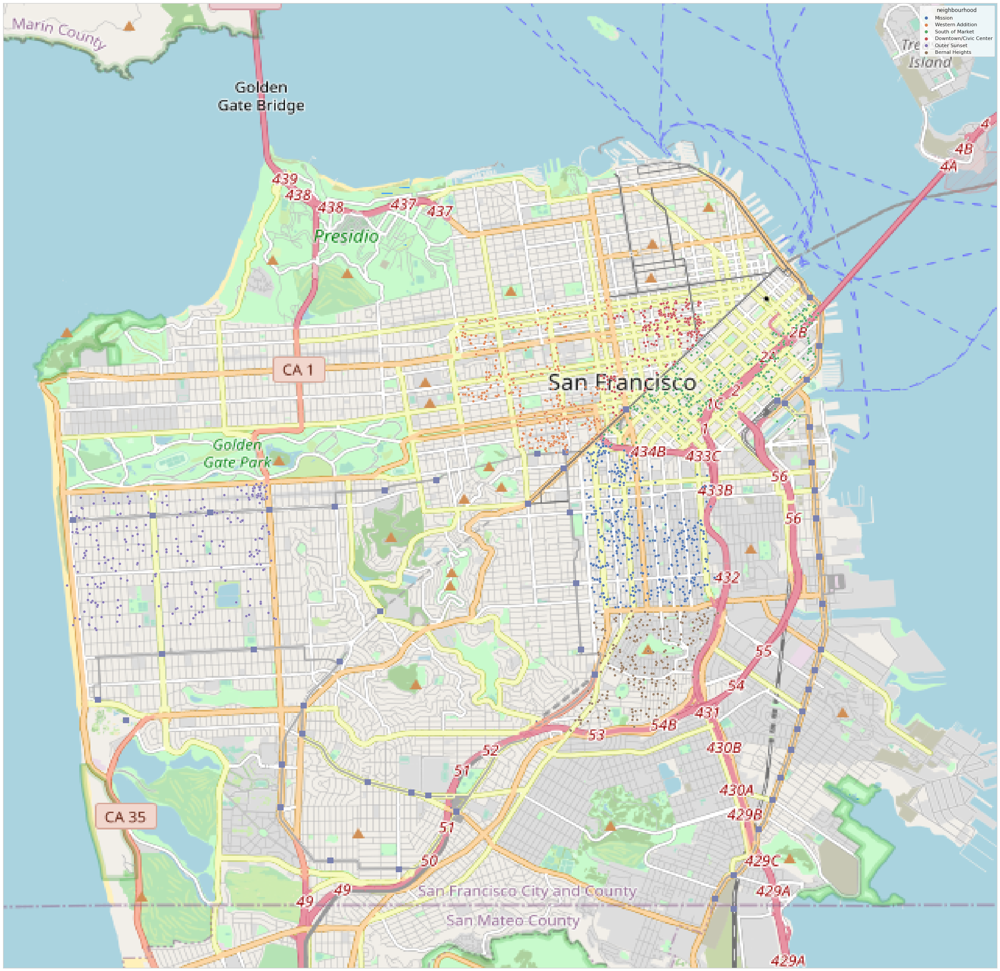

In [1031]:
def display_neighbour_on_map(df):
    '''
    Display the five neighbourhoods with highest listing counts and the corresponding listings on the map.
    
    INPUT: airbnb listing pandas DataFrame with columns 'longitude', 'latitude', and 'neighbourhood_cleansed'.
    OUTPUT: None
    Dependence: Needs the map image of SF, longitude range (-122.52,-122.3594) and latitude range(37.7,37.83),
                Can be generated by OpenStreet API.
    '''
    BBox = [-122.52,-122.3594,37.7,37.83]
    north_CA_map = plt.imread('SF_map.png')
    fig, ax = plt.subplots(figsize = (40,40))
    neighbour_list = df.neighbourhood.value_counts()[0:6]
    neighbour_count = np.array(neighbour_list)
    neighbour_list = np.array(neighbour_list.index)
    df_sub = df.query('neighbourhood in @neighbour_list and price < 600')
    sns.scatterplot(data = df_sub, x = 'longitude', y = 'latitude', hue = 'neighbourhood',
                    hue_order = neighbour_list,alpha = 0.9,ax = ax)
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])

    ax.imshow(north_CA_map, zorder=0, extent = BBox, aspect= 1.2)
    # (ax.legend()).texts[0].set_text('Neighbourhood')
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks([])
    plt.yticks([]);

display_neighbour_on_map(listing_data_95)

Most of the listings are in the central and north-east coastal areas. Also, Downtown/Civic Center area have the lowest average price, but there is a clear separation of a group of higher prices around 200-270, and another group of lower prices around 100-150.

In [1032]:
data = listing_data_95[['price',
           'property_type',
           'neighbourhood',
           'host_is_superhost',
           'host_listings_count',
           'reviews_per_month',
           'number_of_reviews',
           'room_type',
           'accommodates',
           'bedrooms',
           'beds',
           'review_scores_rating',
           'instant_bookable',
           'amenities']]

In [1033]:
data.columns

Index(['price', 'property_type', 'neighbourhood', 'host_is_superhost',
       'host_listings_count', 'reviews_per_month', 'number_of_reviews',
       'room_type', 'accommodates', 'bedrooms', 'beds', 'review_scores_rating',
       'instant_bookable', 'amenities'],
      dtype='object')

In [1034]:
# instant bookable is little bit more complicated.
# we use pandas get_dummies function to convert the categorical variable into indicator variables

instant_booking = pd.get_dummies(data.instant_bookable, prefix="instant_bookable").astype(int)
room_type = pd.get_dummies(data.room_type).astype(int)
property_type = pd.get_dummies(data.property_type).astype(int)
neighbourhood = pd.get_dummies(data.neighbourhood).astype(int)
instant_booking

,instant_bookable_0,instant_bookable_1
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0
...,...,...
6784,0,1
6785,1,0
6786,0,1
6787,1,0


In [1035]:
# ib has 2 columns, so we can just drop one of them.
instant_booking = instant_booking.drop('instant_bookable_0', axis = 1)

In [1036]:
# we drop the original columns and replace them with indicator columns
data = data.drop(['instant_bookable', 'room_type', 'property_type', 'neighbourhood'], axis = 1)
data = pd.concat((data, instant_booking, room_type, property_type, neighbourhood), axis = 1)

In [1037]:
# splitting the amenities list to draw out how many amenities each listing has

amenities_list = []

for element in data.amenities:
    element = element[1:]
    element = element[:-1]
    x = element.split()
    amenities_list.append(len(x))

data.amenities = amenities_list

In [1038]:
data

,price,host_is_superhost,host_listings_count,reviews_per_month,number_of_reviews,accommodates,bedrooms,beds,review_scores_rating,amenities,...,Potrero Hill,Presidio,Presidio Heights,Russian Hill,Seacliff,South of Market,Twin Peaks,Visitacion Valley,West of Twin Peaks,Western Addition
0,55.0,0,9,0.86,120,1,1.0,1.0,4.68,41,...,0,0,0,0,0,0,0,0,0,0
1,194.0,1,1,2.28,371,3,1.0,2.0,4.86,144,...,0,0,0,0,0,0,0,0,0,1
2,235.0,0,2,0.67,111,4,2.0,2.0,4.88,27,...,0,0,0,0,0,0,0,0,0,0
3,56.0,0,12,0.09,9,1,1.0,1.0,4.67,53,...,0,0,0,0,0,0,0,0,0,0
4,575.0,0,2,0.17,28,4,2.0,2.0,4.87,67,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6784,175.0,1,1,2.48,318,2,1.0,1.0,4.95,124,...,0,0,0,0,0,0,0,0,0,0
6785,399.0,0,1,0.57,63,12,4.0,4.0,4.57,129,...,0,0,0,1,0,0,0,0,0,0
6786,125.0,0,2,2.42,308,2,1.0,1.0,4.91,82,...,0,0,0,0,0,0,0,0,0,0
6787,70.0,1,1,1.98,129,6,3.0,4.0,4.91,138,...,0,0,0,0,0,0,0,0,0,0


## Now that we converted all the varibles to numerical values, let's make our training and testing data sets.

Using scikit learn's train_test_split function, we can cross-validate the data set by partitioning it into training and testing data sets.

In [1039]:
listing_data_95.price.describe()

count    4456.000000
mean      180.112208
std       113.049393
min        10.000000
25%       100.000000
50%       147.000000
75%       230.000000
max       585.000000
Name: price, dtype: float64

In [1040]:
# Some of the prices over 500 are extremely high, and may intercept with fitting
# dropping these data gets rids of 5% of the total data
print('amount of data original: ' + str(len(data)))
data = data.query('price <= 500')
data = data[data['number_of_reviews'] > 10] ###
print('amount of data after removing few properties: ' + str(len(data)))

amount of data original: 4456
amount of data after removing few properties: 2587


In [1041]:
data = pd.get_dummies(data)
data.head()

,price,host_is_superhost,host_listings_count,reviews_per_month,number_of_reviews,accommodates,bedrooms,beds,review_scores_rating,amenities,...,Potrero Hill,Presidio,Presidio Heights,Russian Hill,Seacliff,South of Market,Twin Peaks,Visitacion Valley,West of Twin Peaks,Western Addition
0,55.0,0,9,0.86,120,1,1.0,1.0,4.68,41,...,0,0,0,0,0,0,0,0,0,0
1,194.0,1,1,2.28,371,3,1.0,2.0,4.86,144,...,0,0,0,0,0,0,0,0,0,1
2,235.0,0,2,0.67,111,4,2.0,2.0,4.88,27,...,0,0,0,0,0,0,0,0,0,0
5,129.0,1,2,4.68,761,3,1.0,1.0,4.91,91,...,0,0,0,0,0,0,0,0,0,0
6,95.0,1,2,0.12,18,2,1.0,1.0,4.94,143,...,0,0,0,0,0,0,0,0,0,0


In [1042]:
data.columns

Index(['price', 'host_is_superhost', 'host_listings_count',
       'reviews_per_month', 'number_of_reviews', 'accommodates', 'bedrooms',
       'beds', 'review_scores_rating', 'amenities', 'instant_bookable_1',
       'Entire home/apt', 'Hotel room', 'Private room', 'Shared room',
       'Casa particular', 'Cycladic home', 'Entire bungalow', 'Entire cabin',
       'Entire condo', 'Entire cottage', 'Entire guest suite',
       'Entire guesthouse', 'Entire home', 'Entire in-law', 'Entire loft',
       'Entire rental unit', 'Entire serviced apartment', 'Entire townhouse',
       'Entire vacation home', 'Floor', 'Private room',
       'Private room in bed and breakfast', 'Private room in bungalow',
       'Private room in casa particular', 'Private room in condo',
       'Private room in cottage', 'Private room in guest suite',
       'Private room in home', 'Private room in hostel',
       'Private room in loft', 'Private room in rental unit',
       'Private room in resort', 'Private roo

In [1043]:
import sklearn
# splitting the training and test sets with a 60% and 40% size of original
split_data = data.drop(['price'], axis = 1)

train1, test1, train2, test2 = sklearn.model_selection.train_test_split(split_data,
                                                data.price, 
                                                test_size=0.4,
                                                train_size = 0.6,
                                                random_state=13)


In [1044]:
train1.shape, test1.shape, train2.shape, test2.shape

((1552, 94), (1035, 94), (1552,), (1035,))

In [1045]:
scaler = StandardScaler()
scaler.fit(train1)
X_train_scaled = scaler.transform(train1)
X_test_scaled = scaler.transform(test1)

***Baseline***

In [1048]:
baseline = train2.median() # median train
baseline_error = np.sqrt(mean_squared_error(y_pred=np.ones_like(test2) * baseline, y_true=test2))
baseline_error

102.95018259633325

### Let's see if a Linear Regression, Lasso, Ridge and ElasticNet models can predict the prices accurately

In [1049]:
# mean of prices
mean = np.mean(data.price)

# standard deviation to compare 
std = np.std(data.price)

print("mean: " + str(mean))
print ("standard deviation: " + str(std))

mean: 175.639350599
standard deviation: 101.505075962


In [1050]:
split_data.isnull().sum()

host_is_superhost      0
host_listings_count    0
reviews_per_month      0
number_of_reviews      0
accommodates           0
                      ..
South of Market        0
Twin Peaks             0
Visitacion Valley      0
West of Twin Peaks     0
Western Addition       0
Length: 94, dtype: int64

***Linear Regression, Lasso & Ridge Without Regularization. Later, I have used Linear Regression again and then LassoCV, RidgeCV and ElasticNetCV***

***Model Evaluation***

In this part, we will use 3 metric to evaluate the predictions:

1. Mean absolute error (MAE)
2. Root Mean Square Error (RMSE)
3. Median absolute error (MAE)
3. R2

In [1051]:
# linear regression testing
linear_reg = linear_model.LinearRegression()
linear_reg.fit(X_train_scaled, train2)
linear_reg_error = metrics.median_absolute_error(test2, linear_reg.predict(X_test_scaled))

# lasso model testing
lasso = linear_model.Lasso()
lasso.fit(X_train_scaled, train2)
lasso_error = metrics.median_absolute_error(test2, lasso.predict(X_test_scaled))

# ridge model testing
ridge = linear_model.Ridge()
ridge.fit(X_train_scaled, train2)
ridge_error = metrics.median_absolute_error(test2, ridge.predict(X_test_scaled))
print ("Linear Regression Error : " + str(linear_reg_error))
print ("Lasso Regression Error : " + str(lasso_error))
print ("Ridge Regression Error : " + str(ridge_error))

Linear Regression Error : 38.4697711906
Lasso Regression Error : 39.1101823693
Ridge Regression Error : 37.981394608


In [1052]:
# predict result using test data
y_pred = linear_reg.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
4824,63.0,100.0
583,151.0,176.0
1682,188.0,182.0
2559,205.0,136.0
6160,85.0,132.0
1578,425.0,266.0
6769,201.0,266.0
3385,100.0,159.0
1944,81.0,143.0
243,146.0,127.0


In [1053]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  5895283622658.037
Median Absolute Error MAE 38.470
RMSE =  77296368836332.688
R2 score =  -594943786082117659656192.000


In [1054]:
# predict result using test data
y_pred = lasso.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
307,99.0,132.0
5737,149.0,248.0
5066,103.0,162.0
5373,211.0,214.0
5067,72.0,114.0
2487,105.0,173.0
2944,150.0,196.0
645,50.0,26.0
1429,70.0,118.0
984,150.0,153.0


In [1055]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  49.735
Median Absolute Error MAE 39.110
RMSE =  67.737
R2 score =  0.543


In [1056]:
# predict result using test data
y_pred = ridge.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
2305,230.0,228.0
406,189.0,230.0
639,133.0,216.0
399,193.0,189.0
2647,135.0,171.0
3158,93.0,166.0
4000,201.0,254.0
1682,188.0,182.0
1067,150.0,204.0
451,360.0,117.0


In [1057]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  49.328
Median Absolute Error MAE 37.981
RMSE =  67.390
R2 score =  0.548


***Ridge and Lasso Regression***

We have many parameters and are very probable to get overfitting, Let's try adding some regulations:

In [1058]:
lr = linear_model.Ridge(alpha = 1)
lr.fit(X_train_scaled, train2)

# predict result using test data
y_pred = lr.predict(X_test_scaled)
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  49.328
Median Absolute Error MAE 37.981
RMSE =  67.390
R2 score =  0.548


In [1059]:
# predict result using test data
y_pred = lr.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
1270,181.0,190.0
5441,136.0,114.0
902,85.0,117.0
621,164.0,168.0
3267,265.0,141.0
2675,311.0,293.0
5013,275.0,270.0
813,129.0,183.0
1581,124.0,157.0
2364,107.0,236.0


Text(0, 0.5, 'MAE')

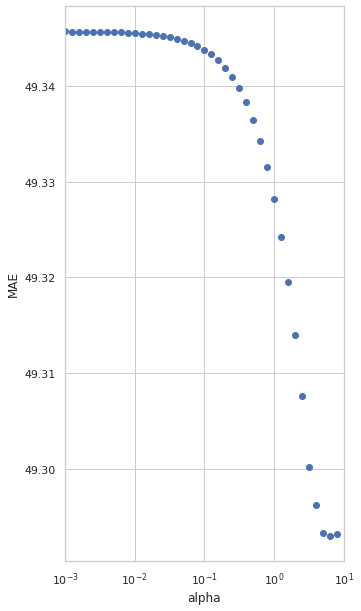

In [1060]:
alphas = 0.0001 * 10**np.arange(1,5,0.1)
maes = []
for alpha in alphas:
    lr = linear_model.Ridge(alpha = alpha)
    lr.fit(X_train_scaled, train2)

    # predict result using test data
    y_pred = lr.predict(X_test_scaled)
    maes.append(metrics.mean_absolute_error(test2, y_pred))
plt.scatter(alphas, maes)
plt.xscale('log')
plt.xlim(0.001, 10)
plt.xlabel('alpha')
plt.ylabel('MAE')

In [1061]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  49.293
Median Absolute Error MAE 37.881
RMSE =  67.351
R2 score =  0.548


In [1062]:
# predict result using test data
y_pred = lr.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
3844,80.0,145.0
147,100.0,146.0
5197,378.0,284.0
682,225.0,130.0
599,109.0,92.0
3910,399.0,284.0
1346,106.0,182.0
1191,175.0,201.0
6640,109.0,102.0
2108,160.0,246.0


In [1063]:
lr = linear_model.Lasso(alpha = 0.1)
lr.fit(X_train_scaled, train2)

# predict result using test data
y_pred = lr.predict(X_test_scaled)

print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  49.257
Median Absolute Error MAE 38.031
RMSE =  67.299
R2 score =  0.549


In [1064]:
# predict result using test data
y_pred = lr.predict(X_test_scaled)

df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
1267,313.0,290.0
2575,239.0,200.0
908,225.0,152.0
473,151.0,166.0
633,109.0,132.0
392,400.0,354.0
4936,185.0,165.0
497,166.0,145.0
2698,296.0,392.0
1223,251.0,291.0


*** Used Linear Regression again, but also used RidgeCV, LassoCV and ElasticNetCV now ***

In [1065]:
lr = linear_model.LinearRegression()
alphas = [1000, 100, 50, 20, 10, 1, 0.1, 0.01]
l1_ratios = [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9]
ridge = linear_model.RidgeCV(alphas=alphas)
lasso = linear_model.LassoCV(alphas=alphas, max_iter=10000)
elastic = linear_model.ElasticNetCV(alphas=alphas, l1_ratio=l1_ratios)

In [1066]:
for model, name in zip([lr, ridge, lasso, elastic], ['LinearRegression', 'Ridge', 'Lasso', 'ElasticNet']):
  model.fit(X_train_scaled, train2)
  y_pred_train = model.predict(X_train_scaled)
  mrse_train = np.sqrt(mean_squared_error(y_pred=y_pred_train, y_true=train2))
  y_pred = model.predict(X_test_scaled)
  mrse_test = np.sqrt(mean_squared_error(y_pred=y_pred, y_true=test2))
  best_alpha = ''
  if name != 'LinearRegression':
    best_alpha = ' best alpha: ' + str(model.alpha_)
  best_l1 = ''
  if name == 'ElasticNet':
    best_l1 = ' best l1: '+ str(model.l1_ratio_)
  print(name + ' mrse_train: ' + str(mrse_train) + ', mrse_test: ' + str(mrse_test) + best_alpha + best_l1)

LinearRegression mrse_train: 65.610893775, mrse_test: 7.72963688363e+13
Ridge mrse_train: 65.824412695, mrse_test: 67.4223581169 best alpha: 100.0
Lasso mrse_train: 66.2482084289, mrse_test: 67.7367072119 best alpha: 1.0
ElasticNet mrse_train: 66.6150168411, mrse_test: 67.8733575885 best alpha: 1.0 best l1: 0.9


In [1067]:
print(lasso.coef_)

[  0.00000000e+00  -0.00000000e+00  -4.00280222e+00  -7.49331533e-01
   2.19935525e+01   3.28618515e+01  -1.19753019e+00   2.00947922e+01
   2.55806449e-01  -1.69971196e-01   5.80472458e+00   2.20763822e+00
  -1.17629758e+01  -0.00000000e+00   0.00000000e+00   0.00000000e+00
  -0.00000000e+00   0.00000000e+00   8.00592844e+00  -0.00000000e+00
  -2.08747801e+00  -0.00000000e+00   7.20741634e+00   0.00000000e+00
   2.29710929e-01   0.00000000e+00   1.47826223e+00  -0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   3.29179456e+00
  -0.00000000e+00   0.00000000e+00  -0.00000000e+00  -0.00000000e+00
   1.14461112e+00  -1.67859020e+00   6.12341963e+00   0.00000000e+00
  -0.00000000e+00   0.00000000e+00   0.00000000e+00  -6.43103572e-01
  -3.82849102e-01   0.00000000e+00   0.00000000e+00   0.00000000e+00
   5.10397377e+00   0.00000000e+00   8.59866424e+00  -0.00000000e+00
  -2.03027734e+00   0.00000000e+00  -5.91974937e+00   0.00000000e+00
   0.00000000e+00  -4.05152995e-01

In [1068]:
order = np.argsort(np.abs(lasso.coef_))[::-1]
for i in order:
  coef_ = lasso.coef_[i]
  if coef_ > 0:
    print(split_data.columns[i] + ', ' + str(lasso.coef_[i]))

bedrooms, 32.8618515109
accommodates, 21.9935524862
review_scores_rating, 20.0947921904
Room in hotel, 8.59866424052
Entire condo, 8.00592844072
Haight Ashbury, 7.54958260517
Entire home, 7.20741633798
Presidio, 6.41828054294
Private room in hostel, 6.12341963311
Entire home/apt, 5.80472458198
Nob Hill, 5.38908139665
Room in boutique hotel, 5.10397377261
Twin Peaks, 4.32973073435
Castro/Upper Market, 3.96708838498
Private room in bed and breakfast, 3.29179455542
Potrero Hill, 3.26448971524
Western Addition, 3.04006874733
Marina, 2.66580552878
Hotel room, 2.20763821672
Russian Hill, 1.64316079323
Entire serviced apartment, 1.47826223145
Private room in guest suite, 1.14461111764
North Beach, 0.458105810081
amenities, 0.25580644945
Entire loft, 0.229710929335
Chinatown, 0.158566846587
Golden Gate Park, 0.0762065014906
Financial District, 0.0640520432259
Downtown/Civic Center, 0.0119207024475


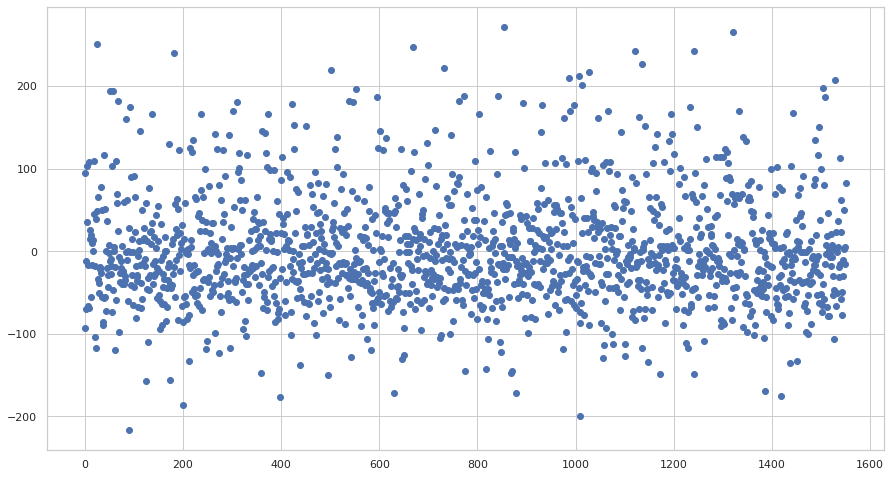

In [1069]:
y_pred_train = lasso.predict(X_train_scaled)
diff = train2 - y_pred_train
plt.figure(figsize=(15,8))
plt.scatter(np.arange(len(diff)), diff)

In [1070]:
train1[np.abs(diff) > 100].describe()

,host_is_superhost,host_listings_count,reviews_per_month,number_of_reviews,accommodates,bedrooms,beds,review_scores_rating,amenities,instant_bookable_1,...,Potrero Hill,Presidio,Presidio Heights,Russian Hill,Seacliff,South of Market,Twin Peaks,Visitacion Valley,West of Twin Peaks,Western Addition
count,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,...,188.000000,188.000000,188.000000,188.000000,188.0,188.000000,188.000000,188.000000,188.000000,188.000000
mean,0.606383,3.276596,1.233191,64.377660,4.303191,1.973404,2.367021,4.869734,77.691489,0.164894,...,0.058511,0.010638,0.015957,0.037234,0.0,0.037234,0.005319,0.021277,0.010638,0.063830
std,0.489856,7.932070,1.167428,71.526076,2.015605,0.880165,1.274336,0.138036,39.531623,0.372075,...,0.235333,0.102866,0.125645,0.189840,0.0,0.189840,0.072932,0.144690,0.102866,0.245102
min,0.000000,1.000000,0.100000,11.000000,1.000000,1.000000,1.000000,4.000000,18.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.380000,20.000000,2.750000,1.000000,1.750000,4.817500,43.750000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,0.730000,34.500000,4.000000,2.000000,2.000000,4.905000,71.500000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,3.000000,1.730000,75.000000,6.000000,2.000000,3.000000,4.962500,107.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,92.000000,5.040000,464.000000,10.000000,5.000000,8.000000,5.000000,197.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000


In [1071]:
train1[np.abs(diff) > 80]

,host_is_superhost,host_listings_count,reviews_per_month,number_of_reviews,accommodates,bedrooms,beds,review_scores_rating,amenities,instant_bookable_1,...,Potrero Hill,Presidio,Presidio Heights,Russian Hill,Seacliff,South of Market,Twin Peaks,Visitacion Valley,West of Twin Peaks,Western Addition
5933,0,2,3.64,16,4,2.0,1.0,4.63,103,1,...,0,0,0,0,0,0,0,0,0,1
4035,1,1,0.43,13,3,1.0,2.0,4.92,135,0,...,0,0,0,0,0,1,0,0,0,0
6750,0,1,0.31,36,3,2.0,2.0,4.71,37,0,...,0,0,0,0,0,0,0,0,1,0
773,1,1,1.05,65,3,1.0,1.0,4.95,69,0,...,0,0,0,0,0,0,0,0,0,0
750,0,2,0.37,33,5,2.0,2.0,4.85,116,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1239,0,1,0.38,29,6,3.0,4.0,5.00,65,0,...,0,0,0,0,0,0,0,0,0,0
2721,1,21,0.70,34,2,1.0,1.0,4.97,59,0,...,0,0,0,0,0,0,0,0,0,0
1222,1,7,2.34,186,2,1.0,1.0,4.95,33,0,...,1,0,0,0,0,0,0,0,0,0
1221,0,2,0.51,41,4,1.0,1.0,4.83,55,0,...,0,0,0,0,0,0,0,0,0,0


In [1072]:
train1[np.abs(diff) < 10]

,host_is_superhost,host_listings_count,reviews_per_month,number_of_reviews,accommodates,bedrooms,beds,review_scores_rating,amenities,instant_bookable_1,...,Potrero Hill,Presidio,Presidio Heights,Russian Hill,Seacliff,South of Market,Twin Peaks,Visitacion Valley,West of Twin Peaks,Western Addition
1947,0,43,0.81,47,1,1.0,1.0,4.70,41,1,...,0,0,0,0,0,0,0,0,0,0
693,1,1,5.15,474,2,1.0,1.0,4.95,98,0,...,0,0,1,0,0,0,0,0,0,0
1721,0,7,1.24,80,1,1.0,1.0,4.60,30,1,...,0,0,0,0,0,0,0,0,0,0
4286,0,10,3.55,93,1,1.0,2.0,4.29,29,1,...,0,0,0,0,0,0,0,0,0,0
3542,1,1,2.49,92,2,1.0,1.0,4.93,29,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2192,1,2,3.19,184,2,1.0,1.0,4.97,184,1,...,1,0,0,0,0,0,0,0,0,0
1,1,1,2.28,371,3,1.0,2.0,4.86,144,0,...,0,0,0,0,0,0,0,0,0,1
1512,1,6,3.20,226,1,1.0,1.0,4.81,83,0,...,0,0,0,0,0,0,0,0,0,0
1260,0,1,2.26,174,2,1.0,1.0,4.86,37,0,...,0,0,0,0,0,0,0,0,0,0


In [1073]:
high_error = train1[np.abs(diff) > 80]
print('size high error: ' + str(len(high_error)))
low_error = train1[np.abs(diff) < 10]
print('size low error: ' + str(len(low_error)))

size high error: 288
size low error: 226


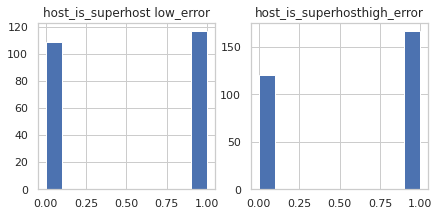

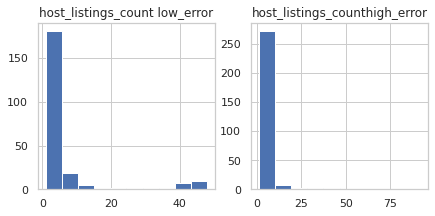

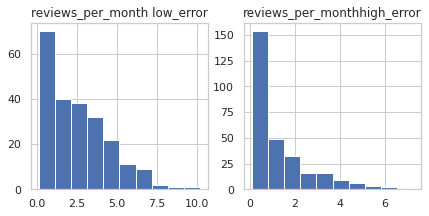

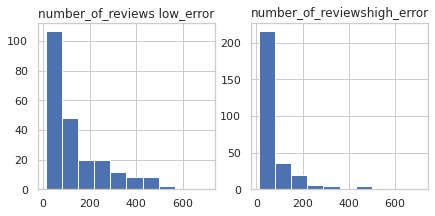

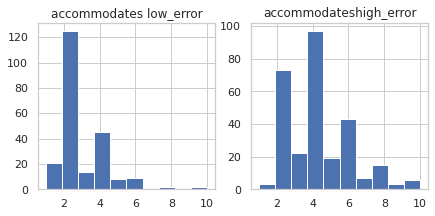

...

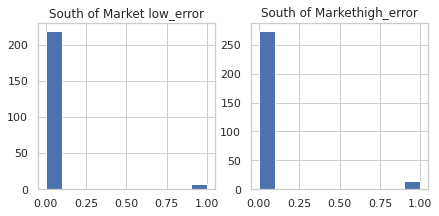

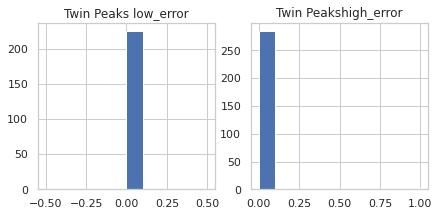

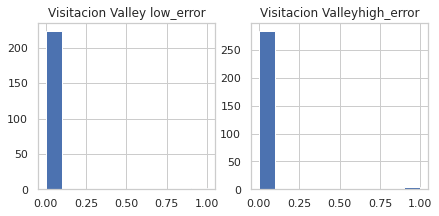

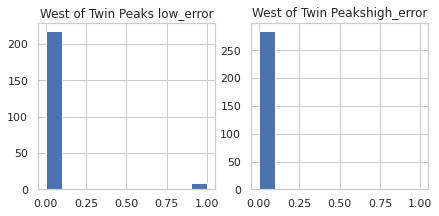

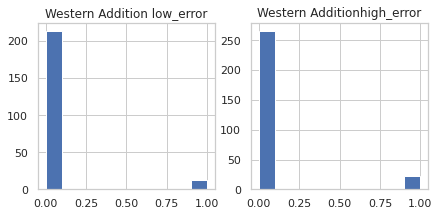

In [1074]:
for c in high_error.columns:
  plt.figure(figsize=(7,3))
  plt.subplot(121)
  plt.hist(low_error[c])
  plt.title(c + ' low_error')
  plt.subplot(122)
  plt.hist(high_error[c])
  plt.title(c + 'high_error')
  plt.show()

It seems that both linear regression and ridge come out to be around `$`40 of error when predicting the prices. Let's see if we can lower this number by utilizing scikit learn's ensemble and GridSearchCV.

GridSearchCV is an exhausive search method over specified parameter values for an estimator.

Particularly, we want to focus on AdaBoostRegressor, GradientBoostRegressor, and BaggingRegressor for our estimators.

AdaBoostRegressor: meta-estimator that fits a regressor on the original dataset and then fits additional copies of the regressor utilizing different and adjusted weights of the errors.

GradientBoostingRegressor: estimator that allows for optimization of arbitrary differentiable loss functions, where in each stage a regression tree is fit on the negative gradient.

BaggingRegressor: it is an ensemble meta-estimator that fits base regressors each on random subsets of the original datasets and then aggregate their individual predictions to a final one. The benefit is that it reduces variance of black-box estimaor like a decision tree using randomization.

In [1075]:
sklearn.metrics.get_scorer_names()

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

***Decision Tree, Random Forest, XGBoost***

In [1076]:
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train_scaled, train2)

In [1077]:
y_pred = clf.predict(X_test_scaled)

In [1078]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  66.955
Median Absolute Error MAE 43.000
RMSE =  97.425
R2 score =  0.055


In [1079]:
df_temp = pd.DataFrame({'price':test2, 'predicted price': y_pred}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
1019,240.0,224.0
128,53.0,78.0
51,85.0,205.0
729,80.0,108.0
3322,73.0,110.0
2839,135.0,308.0
4060,205.0,318.0
4017,58.0,90.0
2664,100.0,99.0
194,100.0,66.0


In [1080]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(max_depth = 11)
clf.fit(X_train_scaled, train2)
y_pred = clf.predict(X_test_scaled)

In [1081]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, y_pred)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, y_pred)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, y_pred))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, y_pred)))

Mean Absolute Error MAE =  59.375
Median Absolute Error MAE 36.000
RMSE =  87.970
R2 score =  0.229


***Neural Network***

In [1082]:
len(listing.columns)

49

In [1083]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.optimizers import Adam

model = Sequential([
    Dense(64, activation = 'relu', input_shape = (94,)),
    Dropout(0.1),
    Dense(32, activation = 'relu'),
    Dropout(0.1),
    Dense(1)
])
opt = Adam(learning_rate = 0.001)
model.compile(loss = 'mean_squared_error', optimizer = opt)

In [1084]:
X_test_scaled.shape

(1035, 94)

In [1085]:
X_val, X_test2, y_val, y_test2 = train_test_split(X_test_scaled, test2, test_size = 0.5, random_state = 42)

hist = model.fit(X_train_scaled, train2, batch_size = 32, epochs = 100, validation_data = (X_val, y_val),
                verbose = 0)
y_pred2 = model.predict(X_test2)

17/17 [==============================] - 0s 2ms/step


In [1086]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(y_test2, y_pred2)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(y_test2, y_pred2)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(y_test2, y_pred2))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(y_test2, y_pred2)))

Mean Absolute Error MAE =  46.797
Median Absolute Error MAE 30.455
RMSE =  68.631
R2 score =  0.552


In [1087]:
df_temp = pd.DataFrame({'price':y_test2, 'predicted price': y_pred2[:,0]}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
1737,62.0,77.0
502,208.0,221.0
3045,308.0,331.0
68,350.0,207.0
5559,265.0,184.0
2420,343.0,179.0
1020,95.0,143.0
2682,125.0,140.0
724,99.0,143.0
55,83.0,234.0


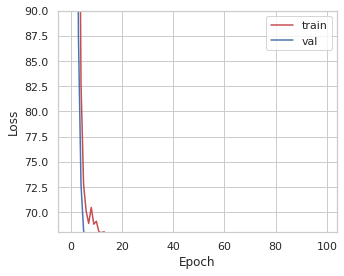

In [1088]:
fig, ax = plt.subplots(1, 1, figsize=(5,4))
ax.plot(np.sqrt(hist.history['loss']), 'r', label='train')
ax.plot(np.sqrt(hist.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch')
ax.set_ylabel(r'Loss')
ax.set_ylim(68,90)
ax.legend()

***Hyper parameter tuning***

In [1089]:
from tqdm import tqdm
lrs = 0.000001 * 10**np.arange(0,8,0.2)
val_losses = []
for lr in tqdm(lrs):
    model = Sequential([
        Dense(64, activation = 'relu', input_shape = (94,)),
        Dense(32, activation = 'relu'),
        Dense(1)
    ])
    opt = Adam(learning_rate = lr)
    model.compile(loss = 'mean_squared_error', optimizer = opt)
    hist = model.fit(X_train_scaled, train2, batch_size = 32, epochs = 100, validation_data = (X_val, y_val),
                    verbose = 0)
    val_losses.append(np.sqrt(hist.history['val_loss'][-1]))

100%|██████████| 40/40 [10:28<00:00, 15.70s/it]


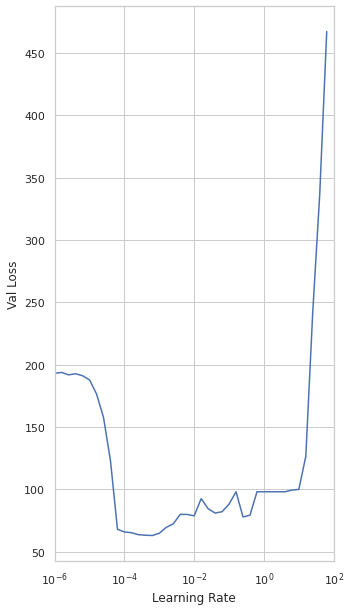

In [1090]:
plt.plot(lrs, val_losses)
plt.xscale('log')
plt.xlim(0.000001, 100);
plt.xlabel('Learning Rate');
plt.ylabel('Val Loss');

In [1091]:
drops = list(np.arange(0.01,0.2,0.002))
val_losses = []
for drop in tqdm(drops):
    model = Sequential([
        Dense(64, activation = 'relu', input_shape = (94,)),
        Dropout(drop),
        Dense(32, activation = 'relu'),
        Dropout(drop),
        Dense(1)
    ])
    opt = Adam(learning_rate = 0.001)
    model.compile(loss = 'mean_squared_error', optimizer = opt)
    hist = model.fit(X_train_scaled, train2, batch_size = 32, epochs = 100, validation_data = (X_val, y_val),
                    verbose = 0)
    val_losses.append(np.sqrt(hist.history['val_loss'][-1]))

100%|██████████| 95/95 [25:12<00:00, 15.92s/it]


In [1092]:
y_pred2 = model.predict(X_test2)

17/17 [==============================] - 0s 1ms/step


In [1093]:
print('Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(y_test2, y_pred2)))
print('Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(y_test2, y_pred2)))
print('RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(y_test2, y_pred2))))
print('R2 score = ', '{:.3f}'.format(metrics.r2_score(y_test2, y_pred2)))

Mean Absolute Error MAE =  45.952
Median Absolute Error MAE 30.524
RMSE =  68.275
R2 score =  0.557


In [1094]:
df_temp = pd.DataFrame({'price':y_test2, 'predicted price': y_pred2[:,0]}).sample(10)
df_temp.apply(np.floor).astype(object)

,price,predicted price
1731,149.0,198.0
533,149.0,146.0
3610,250.0,235.0
328,75.0,73.0
3370,120.0,86.0
1335,189.0,173.0
5531,221.0,243.0
464,134.0,115.0
2606,71.0,91.0
1346,106.0,165.0


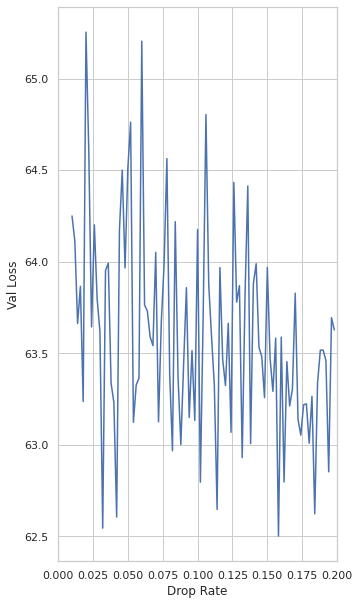

In [1095]:
plt.plot(drops, val_losses)
plt.xlim(0, 0.2);
plt.xlabel('Drop Rate');
plt.ylabel('Val Loss');

In [1096]:
# ada boost regressor

param_names = ["n_estimators", "learning_rate", "loss"]
param_values = [[1], [1,2], ['linear']]

parameters = dict(zip(param_names, param_values))

abr = GridSearchCV(ensemble.AdaBoostRegressor(),
                   cv = 3,
                   param_grid = parameters,
                   scoring = 'neg_median_absolute_error')
preds = abr.fit(X_train_scaled, train2)
abr_best_estimator = abr.best_estimator_

In [1097]:
print('AdaBoostRegressor Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, abr.predict(X_test_scaled))))
print('AdaBoostRegressor Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, abr.predict(X_test_scaled))))
print('AdaBoostRegressor RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, abr.predict(X_test_scaled)))))
print('AdaBoostRegressor R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, abr.predict(X_test_scaled))))

AdaBoostRegressor Mean Absolute Error MAE =  54.761
AdaBoostRegressor Median Absolute Error MAE 41.403
AdaBoostRegressor RMSE =  73.698
AdaBoostRegressor R2 score =  0.459


In [1098]:
# gradient boosting regressor

param_names = ["n_estimators", "max_depth", "learning_rate", "loss", "min_samples_split"]
param_values = [[100,300,500], [1,2,3,4], [0.01, 0.02], ['absolute_error', 'squared_error'], [1.0]]

parameters = dict(zip(param_names, param_values))
gbr = GridSearchCV(ensemble.GradientBoostingRegressor(), 
                   cv = 3, 
                   param_grid = parameters, 
                   scoring='neg_median_absolute_error')
preds = gbr.fit(X_train_scaled, train2)
gbr_best_estimator = gbr.best_estimator_

In [1099]:
print('GradientBoostingRegressor Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, gbr.predict(X_test_scaled))))
print('GradientBoostingRegressor Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, gbr.predict(X_test_scaled))))
print('GradientBoostingRegressor RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, gbr.predict(X_test_scaled)))))
print('GradientBoostingRegressor R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, gbr.predict(X_test_scaled))))

GradientBoostingRegressor Mean Absolute Error MAE =  51.545
GradientBoostingRegressor Median Absolute Error MAE 33.972
GradientBoostingRegressor RMSE =  73.723
GradientBoostingRegressor R2 score =  0.459


In [1100]:
# bagging regressor

param_names = ["n_estimators", "max_features", "bootstrap", "oob_score"]
param_values = [[100,500,1000], [1,5,10], [True, False], [False]]

parameters = dict(zip(param_names, param_values))
br = GridSearchCV(ensemble.BaggingRegressor(), 
                   cv = 3, 
                   param_grid = parameters, 
                   scoring='neg_median_absolute_error')
preds = br.fit(X_train_scaled, train2)
br_best_estimator = br.best_estimator_

In [1101]:
print('BaggingRegressor Mean Absolute Error MAE = ', '{:.3f}'.format(metrics.mean_absolute_error(test2, br.predict(X_test_scaled))))
print('BaggingRegressor Median Absolute Error MAE', '{:.3f}'.format(metrics.median_absolute_error(test2, br.predict(X_test_scaled))))
print('BaggingRegressor RMSE = ','{:.3f}'.format(np.sqrt(metrics.mean_squared_error(test2, br.predict(X_test_scaled)))))
print('BaggingRegressor R2 score = ', '{:.3f}'.format(metrics.r2_score(test2, br.predict(X_test_scaled))))

BaggingRegressor Mean Absolute Error MAE =  65.659
BaggingRegressor Median Absolute Error MAE 56.228
BaggingRegressor RMSE =  83.138
BaggingRegressor R2 score =  0.312


In [1102]:
print("AdaBoostRegressor: " + "$" + str(abs(abr.best_score_)))
print("GradientBoostingRegressor: " + "$" + str(abs(gbr.best_score_)))
print("BaggingRegressor: " + "$" + str(abs(br.best_score_)))

AdaBoostRegressor: $42.6969940565
GradientBoostingRegressor: $35.6103675615
BaggingRegressor: $53.978248526


In [1103]:
abr_preds = abr.predict(X_test_scaled)
gbr_preds = gbr.predict(X_test_scaled)
br_preds = br.predict(X_test_scaled)

In [1104]:
df_temp = pd.DataFrame({'ABR price':test2, 'ABR predicted price': abr_preds}).sample(10)
df_temp.apply(np.floor).astype(object)

,ABR price,ABR predicted price
468,165.0,117.0
5761,186.0,183.0
836,128.0,183.0
3273,103.0,117.0
34,95.0,117.0
4712,338.0,365.0
237,379.0,297.0
342,150.0,183.0
1462,125.0,117.0
6711,150.0,183.0


In [1105]:
df_temp = pd.DataFrame({'GBR price':test2, 'GBR predicted price': gbr_preds}).sample(10)
df_temp.apply(np.floor).astype(object)

,GBR price,GBR predicted price
4707,135.0,129.0
3158,93.0,165.0
348,69.0,99.0
6624,79.0,109.0
453,77.0,109.0
6747,256.0,226.0
921,68.0,124.0
43,101.0,130.0
1372,249.0,115.0
218,230.0,145.0


In [1106]:
df_temp = pd.DataFrame({'BR price':test2, 'BR predicted price': br_preds}).sample(10)
df_temp.apply(np.floor).astype(object)

,BR price,BR predicted price
5338,158.0,188.0
3003,59.0,145.0
2583,243.0,200.0
5537,376.0,223.0
3791,119.0,193.0
2206,63.0,149.0
1433,180.0,153.0
52,134.0,166.0
1001,150.0,204.0
5341,142.0,204.0


By using GridSearchCV, we can run different combinations of selected hyper-parameters. It seems that AdaBoostRegressor and BaggingRegressor (after some tuning) arrives at similar results as our previous linear and ridge regressors. 

Gradient Boosting Regressor, however, seems to do singificantly better (error decreased by 25-30%) than all the others. We can take a closer look at the gradient boosting regressor's characteristics:

In [1107]:
gbr_best_estimator

GradientBoostingRegressor(learning_rate=0.02, loss='absolute_error',
                          max_depth=1, min_samples_split=1.0, n_estimators=500)

Let's now graph the features and their relevance based on importance.

In [1108]:
gbr_best_estimator.feature_importances_

array([ 0.        ,  0.0605168 ,  0.00939604,  0.        ,  0.26333341,
        0.21129887,  0.        ,  0.11214036,  0.        ,  0.        ,
        0.19440427,  0.        ,  0.01905808,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00894335,  0.        ,
        0.00048675,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.03889585,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00181066,  0.        ,
        0.00228248,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00183062,  0.        ,
        0.        ,  0.        ,  0.00054079,  0.        ,  0.00134223,
        0.03093842,  0.        ,  0.        ,  0.        ,  0.01

In [1109]:
100.0 * (gbr_best_estimator.feature_importances_ / gbr_best_estimator.feature_importances_.max())

array([   0.        ,   22.9810568 ,    3.5681161 ,    0.        ,
        100.        ,   80.24005446,    0.        ,   42.58493613,
          0.        ,    0.        ,   73.82438654,    0.        ,
          7.23724372,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    3.39620621,    0.        ,
          0.18484243,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,   14.77057209,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.68759113,    0.        ,    0.8667627 ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.69517315,    0.     

<Axes: title={'center': 'Feature Importance'}>

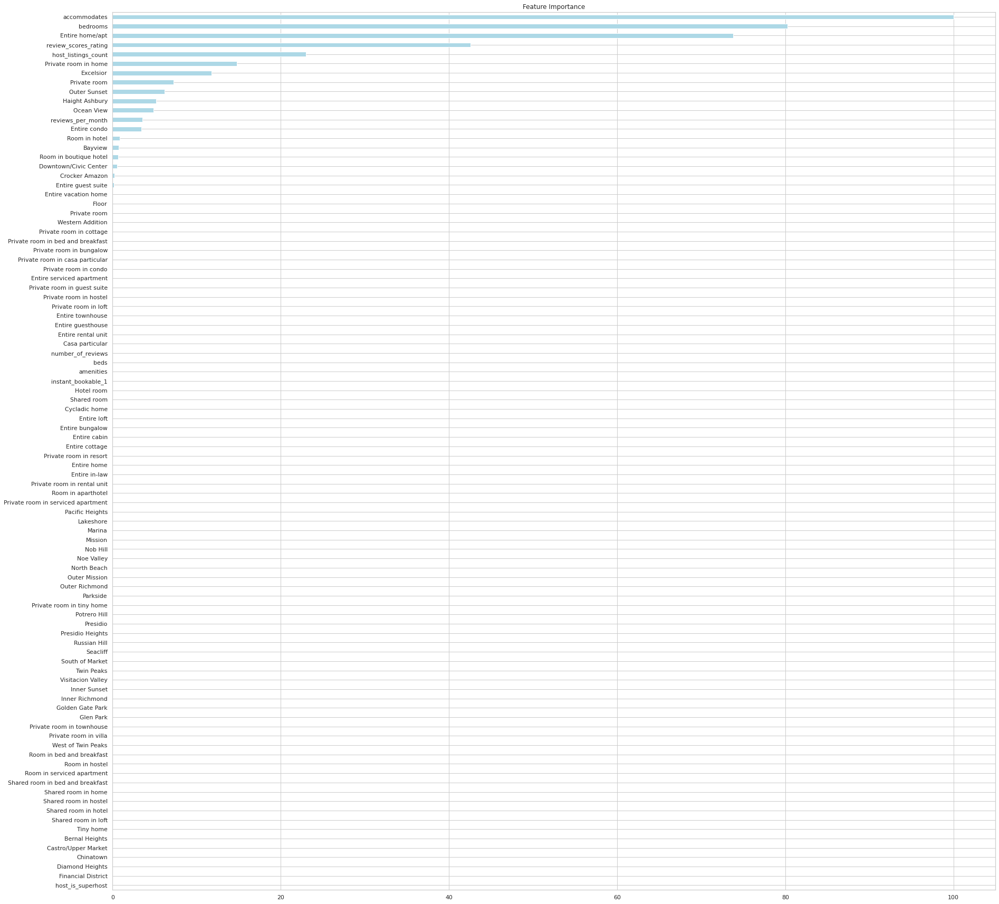

In [1112]:
feature_importance = gbr_best_estimator.feature_importances_
feature_score = 100.0 * (feature_importance / feature_importance.max())

feature = pd.Series(feature_score, index = train1.columns).sort_values(ascending = True)

feature.plot(kind = 'barh',
              figsize = (30,30),
              color = 'LightBlue',
              title = 'Feature Importance')

***Conclusion***

***Additional Note***

Managed to bring down baseline error compared to the original baseline through combination of Linear Regression, LassoCV, RidgeCV and ElasticNetCV by $10. I ignored those points in my data where number of reviews was less than 10 as usually there will be more number of reviews if we think about real world scenario based on domain understanding.

We really had a very noisy data and some with no reviews. I guess what some people will do is they will put their apartment for whatever maximum amount happens to be there and they will think they are set if people click and buy. Usually, people don't do this unless there is a good price. So, what runs continous and gets more reviews at the end gets more stable and is easier to predict. This is my take for this exercise and also the reasoning behind this additional note I have put here.

***In this data analysis project, I analyzed some of the most popular trends given the Airbnb's data on listings in San Francisco.***

***Summarized findings:***
- Most of the listings are clustered near the bart stations and center of the city / Most Airbnb rentals in San Francisco are in the north-east coastal areas.
- Prices in most neighbors are skewed to the right. The Downtown/Civic area, while having the lowest average price, shows a bimodal distribution. This suggests a gap between the rich and the poor.
- Superhosts, in general, provide better renting experience, their rating in all aspects were 0.02 - 0.2 higher in rating than regular hosts.
- Mission (421), Western Addition (306) and South of Market (291) at the top 3 neighborhoods with most listings
- Average price of all SF listings is `$`180.11.
- Prices vary wildly based on property and room types.
- Presidio (`$`301.83), Seacliff (`$`292.6), Twin Peaks (`$`246.34) are the most expensive neighborhoods.
- Majority of listings are rented for their entirety, although private room is a close second. This is the most important factor when people choose where to stay.
- Accomodates is the most important factor, meaning that most people who use Airbnb at SF travel in groups.
- Almost all of listings are Entire home/apt.
- Most frequent words in summaries show that more hosts talk about the surrounding area rather than the listing itself.
- Listings with prices around `$`100 - 300 get the most reviews, meaning that they are booked most often.
- We have used multiple machine learning algorithms to successfully make an estimation for Airbnb rent price. In which Gradient Boosting Regressor and Neural Network have the best performance.
- I also did few Ensemble Algorithms in this notebook if you scroll up just for experimentation.